In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.colors as mcolors
import networkx as nx
import re
import os
import os.path
import time
import shutil
#from threading import Thread
import concurrent.futures
import subprocess
from io import StringIO
from Bio.Seq import Seq
from Bio.SeqRecord import SeqRecord
from Bio import SeqIO
from Bio.Blast.Applications import NcbiblastpCommandline
from Bio.Align.Applications import ClustalOmegaCommandline
from Bio.Align import MultipleSeqAlignment
from Bio.PDB.MMCIFParser import MMCIFParser
from Bio.PDB.Polypeptide import three_to_one
from Bio.SVDSuperimposer import SVDSuperimposer
from pdbecif.mmcif_io import CifFileReader
from scipy.sparse import lil_matrix, dok_matrix

import pipeline.HomologyRing as HomologyRing
import logging
from pipeline.utils import *

blast_DBs = {'PDB':'blast_db/pdb_seqres', 'SPROT':'blast_db/uniprot_sprot.fasta'}

# Basic Pipeline Testing

## Normal running from query chain with BLAST homology search

## Alphafold BLAST search

In [5]:
rh = HomologyRing.HomologyRing('query/1LM8.cif', blast_DBs['SPROT'], struct_source='AlphaFold', log_level=logging.DEBUG, uses_PDB_ids=False)
#rh.acc_PDB = True
rh.verbose = True
rh.build('C','1', force_download=False, force_RING=False, max_results=64, use_label_asym_id=False, prob_normalization='possible')
self = rh

## PDB Homology search

### ELOC analysis

In [2]:
## Normal build with one query file
# normal test :8cmz
# problem test (chain id) 1HWT C
# 'query/auto_test/1ryp.cif'
#2v8l 
# 3cmt -- RecA
# interactive test 2v8l
# 1a3s good for seeing interchain contact outliers (ionic PIPI)
# 1a15 - ILK8 pretty basic 2 chain
rh = HomologyRing.HomologyRing('query/1LM8.cif', blast_DBs['PDB'], struct_source='PDB', log_level=logging.DEBUG, uses_PDB_ids=True)
#rh.acc_PDB = True
rh.verbose = True
rh.build('C','1', force_download=False, force_RING=False, max_results=128, use_label_asym_id=False, prob_normalization='possible', all_models=True, )
self = rh

Bad edges found: 9 instances in ['7pi4', '6zhc', '8bdt']. They have been filtered, but this issue should be resolved.


In [160]:
rh.contact_df.groupby(['inter_class', 'inter']).size()

inter_class  inter    
LIG          HBOND          15
             METAL_ION       2
             VDW            36
inter        HBOND        1550
             IONIC         214
             PICATION       36
             PIHBOND         7
             PIPISTACK     472
             VDW          3789
intra        HBOND        7347
             IONIC         147
             PICATION       54
             PIHBOND         8
             PIPISTACK     595
             VDW          7431
dtype: int64

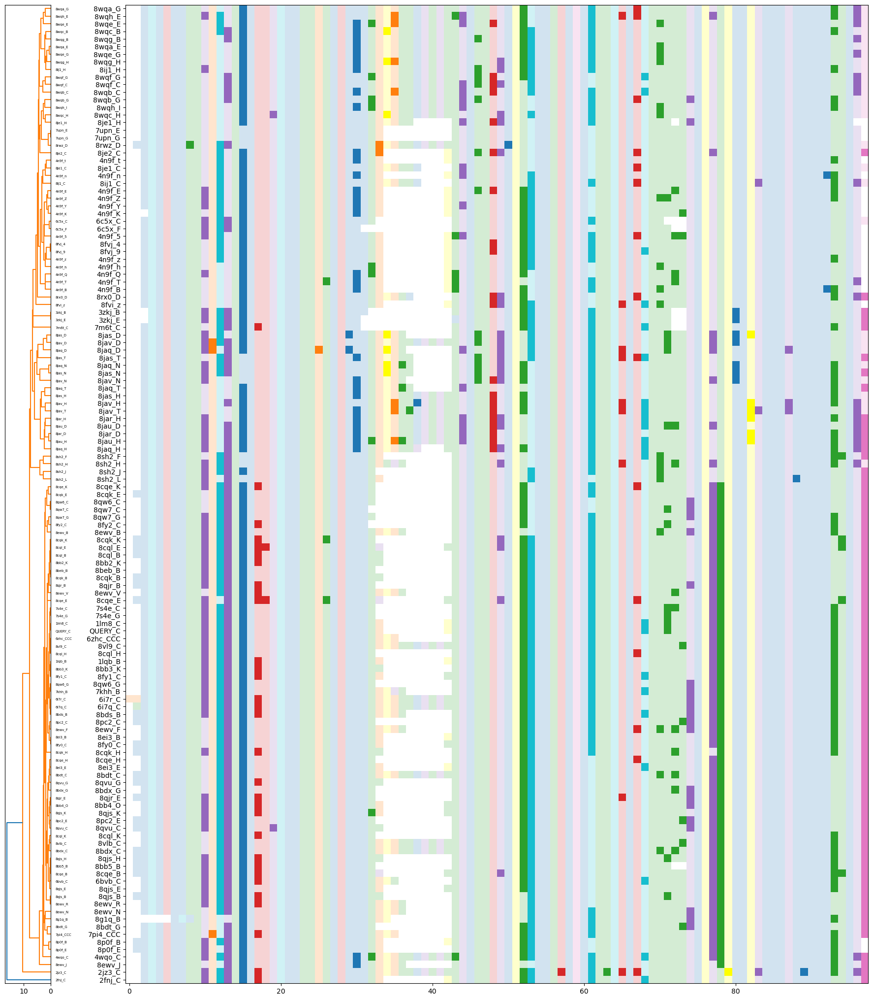

([26,
  15,
  21,
  23,
  17,
  27,
  20,
  16,
  8,
  19,
  18,
  24,
  25,
  14,
  22,
  6,
  65,
  64,
  11,
  5,
  80,
  7,
  81,
  9,
  86,
  83,
  87,
  85,
  73,
  72,
  78,
  54,
  53,
  79,
  82,
  84,
  77,
  76,
  10,
  55,
  89,
  88,
  69,
  43,
  37,
  49,
  40,
  47,
  41,
  35,
  46,
  42,
  36,
  34,
  44,
  39,
  45,
  38,
  48,
  33,
  32,
  31,
  30,
  119,
  117,
  97,
  96,
  95,
  51,
  61,
  115,
  113,
  114,
  4,
  123,
  118,
  106,
  56,
  121,
  67,
  66,
  93,
  0,
  71,
  29,
  112,
  92,
  3,
  52,
  98,
  70,
  94,
  13,
  128,
  108,
  60,
  63,
  12,
  116,
  120,
  62,
  127,
  100,
  124,
  105,
  2,
  101,
  107,
  99,
  111,
  28,
  125,
  102,
  1,
  122,
  74,
  103,
  104,
  57,
  58,
  50,
  126,
  68,
  110,
  109,
  75,
  59,
  90,
  91],
 ['8wqa_G',
  '8wqh_E',
  '8wqe_E',
  '8wqc_B',
  '8wqg_B',
  '8wqa_E',
  '8wqe_G',
  '8wqg_H',
  '8ij1_H',
  '8wqf_G',
  '8wqf_C',
  '8wqb_C',
  '8wqb_G',
  '8wqh_I',
  '8wqc_H',
  '8je1_H',
  '7upn_E',
  

In [3]:
rh.plot_contact_conservation(inter_class='inter', contact_type='HBOND')

In [20]:
# Query to find rows where one column is 'ELOC_HUMAN' and the other is 'ELOB_HUMAN'
results = rh.entity_contact_df[
    ((rh.entity_contact_df['db_code_1'] == 'ELOC_HUMAN') & (rh.entity_contact_df['db_code_2'] == 'ELOB_HUMAN')) |
    ((rh.entity_contact_df['db_code_1'] == 'ELOB_HUMAN') & (rh.entity_contact_df['db_code_2'] == 'ELOC_HUMAN'))
]

results


,level_0,index,NodeId1,Interaction,NodeId2,Distance,Model,acc,acc_chn,chain1,...,pdbx_description_2,db_name_2,db_code_2,pdbx_db_accession_2,entity_id_2,src_acc_2,identifier_2,EIDN_2,u_node,v_node
17,17,17,B:93:_:PHE,PIPISTACK:SC_SC,C:27:_:HIS,5.066,1,QUERY,QUERY_C,B,...,ELONGIN C,UNP,ELOC_HUMAN,Q15369,2,QUERY,Q15369,1,98,12
21,21,21,B:11:_:LYS,HBOND:SC_MC,C:25:_:ASP,2.816,1,QUERY,QUERY_C,B,...,ELONGIN C,UNP,ELOC_HUMAN,Q15369,2,QUERY,Q15369,1,98,10
27,27,27,B:97:_:PRO,VDW:SC_SC,C:102:_:GLU,2.731,1,QUERY,QUERY_C,B,...,ELONGIN C,UNP,ELOC_HUMAN,Q15369,2,QUERY,Q15369,1,98,87
46,46,46,B:68:_:ARG,HBOND:SC_SC,C:83:_:TYR,3.282,1,QUERY,QUERY_C,B,...,ELONGIN C,UNP,ELOC_HUMAN,Q15369,2,QUERY,Q15369,1,98,68
47,47,47,B:99:_:LEU,VDW:SC_MC,C:98:_:GLU,2.885,1,QUERY,QUERY_C,B,...,ELONGIN C,UNP,ELOC_HUMAN,Q15369,2,QUERY,Q15369,1,98,83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18180,21665,21674,A:11:_:LYS,HBOND:SC_MC,B:25:_:ASP,2.889,1,8bds,8bds_B,A,...,Elongin-C,UNP,ELOC_HUMAN,Q15369,2,8bds,Q15369,1,98,10
18185,21670,21679,A:70:_:GLN,VDW:SC_SC,B:94:_:PRO,2.399,1,8bds,8bds_B,A,...,Elongin-C,UNP,ELOC_HUMAN,Q15369,2,8bds,Q15369,1,98,79
18190,21675,21684,A:93:_:PHE,VDW:SC_SC,B:67:_:SER,2.418,1,8bds,8bds_B,A,...,Elongin-C,UNP,ELOC_HUMAN,Q15369,2,8bds,Q15369,1,98,52
18196,21682,21691,A:96:_:PRO,VDW:SC_SC,B:102:_:GLU,2.723,1,8bds,8bds_B,A,...,Elongin-C,UNP,ELOC_HUMAN,Q15369,2,8bds,Q15369,1,98,87


In [9]:
results['inter'].value_counts()

inter
VDW          1117
HBOND         605
PIPISTACK     235
IONIC          44
PICATION       25
Name: count, dtype: int64

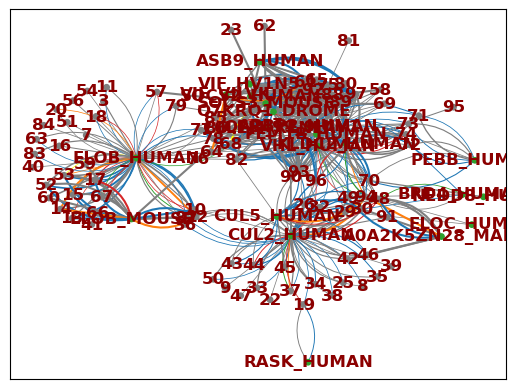

In [4]:
rh.plot_hRIN_network(inter_class='inter')

In [3]:
MG_filtered = nx.MultiGraph()
for u_id, v_id, data in rh.MultiGraph.edges(data=True):
    u_data, v_data = rh.MultiGraph.nodes[u_id], rh.MultiGraph.nodes[v_id]
    if u_data.get('db_code') == 'ELOB_HUMAN':
        if u_id not in MG_filtered.nodes: # add eloc data if not there yet
            MG_filtered.add_node(u_id, **u_data)
        MG_filtered.add_node(v_id, **v_data)
        MG_filtered.add_edge(u_id, v_id, key=None, **data)
    if v_data.get('db_code') == 'ELOB_HUMAN':
        if v_id not in MG_filtered.nodes: # add eloc data if not there yet
            MG_filtered.add_node(v_id, **v_data)
        MG_filtered.add_node(u_id, **u_data)
        MG_filtered.add_edge(u_id, v_id, key=None, **data)
rh.MultiGraph = MG_filtered

In [4]:
rh.MultiGraph.nodes[98]

{'consensus': 'CHN',
 'node_type': 'CHAIN',
 'identifier': 'Q15370',
 'EIDN': 0.0,
 'db_code': 'ELOB_HUMAN',
 'pdbx_description': 'Transcription elongation factor B polypeptide 2',
 'x': 60.5295969062626,
 'y': 5.958057829871963,
 'z': 114.23085305721513,
 'color': '#2ca02c'}

In [56]:
rh.consensus_seq[11:18]

'GHEFIVK'

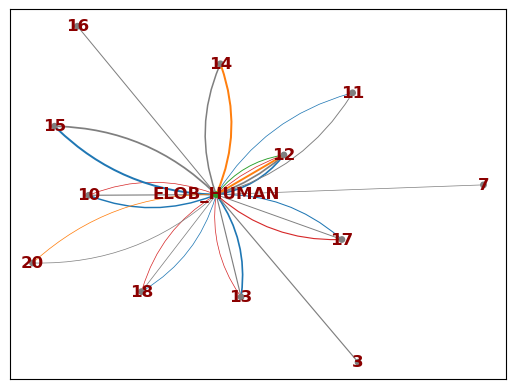

In [5]:
rh.plot_hRIN_network(layout='spring', trim=(1,30), crv_rad=0.2)

In [27]:
patches.Circle((0,0), radius=5)

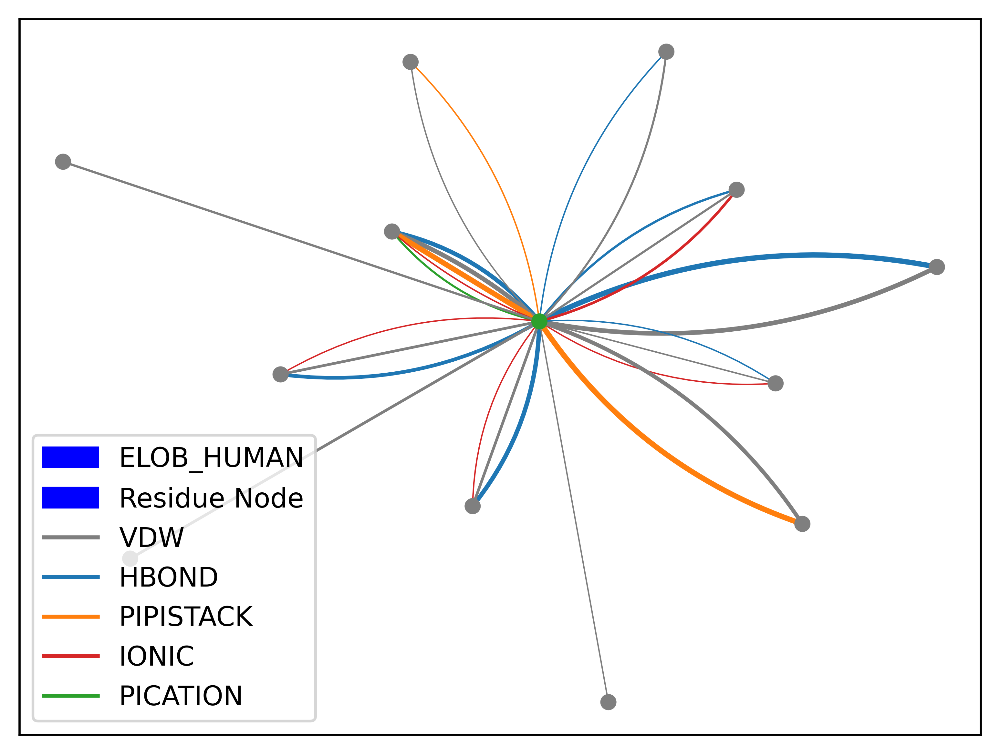

In [45]:
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
fig = plt.figure(dpi=600)
rh.plot_hRIN_network(layout='spring', trim=(1,30), crv_rad=0.17, het_lables=None, res_lables=None, prob_weight=1.6, node_size=25)
# Manually define legend entries
node_legend1 = mpatches.Patch(color='blue', label='ELOB_HUMAN')
node_legend2 = mpatches.Patch(color='blue', label='Residue Node')
edge_legend1 = mlines.Line2D([], [], color='tab:grey', label='VDW', linewidth=1.5)
edge_legend2 = mlines.Line2D([], [], color='tab:blue', label='HBOND', linewidth=1.5)
edge_legend3 = mlines.Line2D([], [], color='tab:orange', label='PIPISTACK', linewidth=1.5)
edge_legend4 = mlines.Line2D([], [], color='tab:red', label='IONIC', linewidth=1.5)
edge_legend5 = mlines.Line2D([], [], color='tab:green', label='PICATION', linewidth=1.5)

# Add the legend to the plot
plt.legend(handles=[node_legend1, node_legend2, edge_legend1, edge_legend2, edge_legend3, edge_legend4, edge_legend5], loc='best')

plt.show()

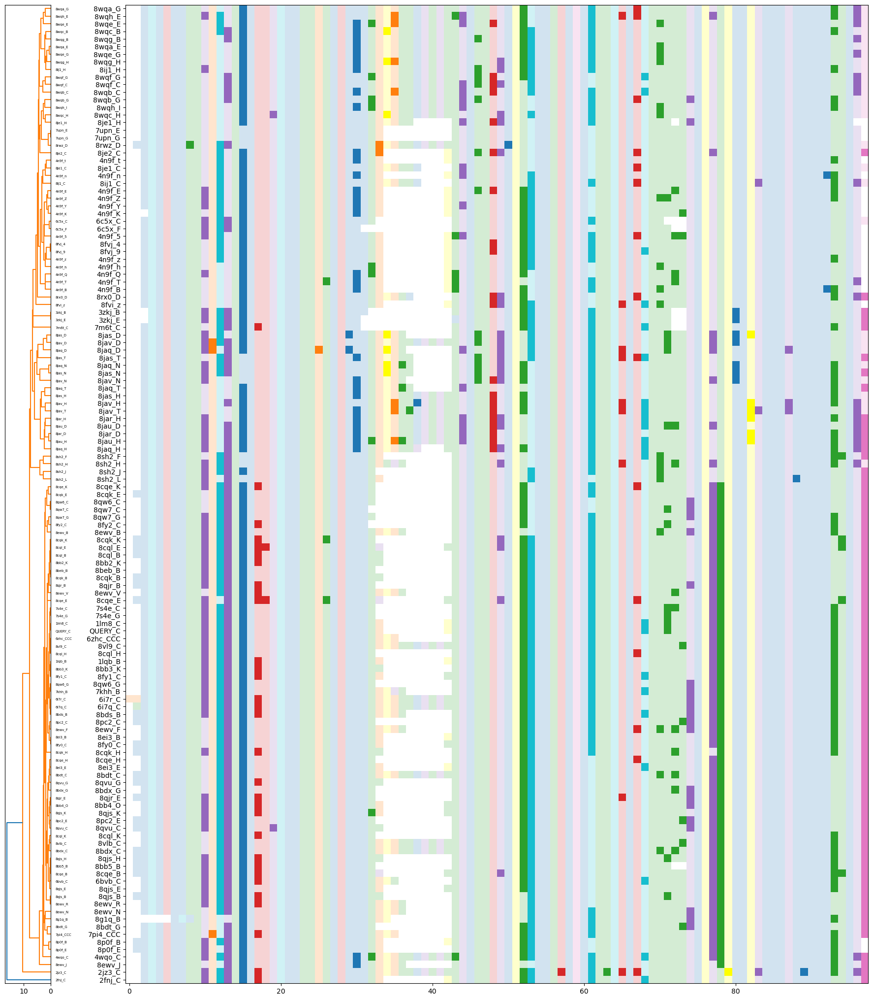

([26,
  15,
  21,
  23,
  17,
  27,
  20,
  16,
  8,
  19,
  18,
  24,
  25,
  14,
  22,
  6,
  65,
  64,
  11,
  5,
  80,
  7,
  81,
  9,
  86,
  83,
  87,
  85,
  73,
  72,
  78,
  54,
  53,
  79,
  82,
  84,
  77,
  76,
  10,
  55,
  89,
  88,
  69,
  43,
  37,
  49,
  40,
  47,
  41,
  35,
  46,
  42,
  36,
  34,
  44,
  39,
  45,
  38,
  48,
  33,
  32,
  31,
  30,
  119,
  117,
  97,
  96,
  95,
  51,
  61,
  115,
  113,
  114,
  4,
  123,
  118,
  106,
  56,
  121,
  67,
  66,
  93,
  0,
  71,
  29,
  112,
  92,
  3,
  52,
  98,
  70,
  94,
  13,
  128,
  108,
  60,
  63,
  12,
  116,
  120,
  62,
  127,
  100,
  124,
  105,
  2,
  101,
  107,
  99,
  111,
  28,
  125,
  102,
  1,
  122,
  74,
  103,
  104,
  57,
  58,
  50,
  126,
  68,
  110,
  109,
  75,
  59,
  90,
  91],
 ['8wqa_G',
  '8wqh_E',
  '8wqe_E',
  '8wqc_B',
  '8wqg_B',
  '8wqa_E',
  '8wqe_G',
  '8wqg_H',
  '8ij1_H',
  '8wqf_G',
  '8wqf_C',
  '8wqb_C',
  '8wqb_G',
  '8wqh_I',
  '8wqc_H',
  '8je1_H',
  '7upn_E',
  

In [34]:
rh.plot_contact_conservation(inter_class='inter', contact_type='HBOND')

In [107]:
rh.file_df.groupby('acc').size().sort_values(ascending=False)

acc
4n9f     12
8ewv      6
8jav      4
8jas      4
8jaq      4
         ..
8beb      1
8fvi      1
1lqb      1
8fy1      1
QUERY     1
Length: 64, dtype: int64

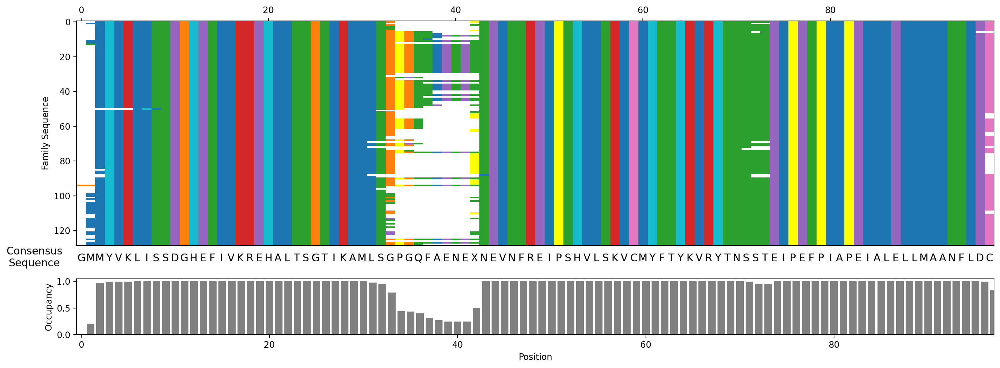

In [63]:
import matplotlib.pyplot as plt
from Bio.Align import AlignInfo

# Define the undo function
def undo_make_fainter(rgb_fainter, alpha):
    return tuple((c_fainter - 1.0 * alpha) / (1 - alpha) for c_fainter in rgb_fainter)

# Prepare the MSA image data and consensus sequence
msa_data = undo_make_fainter(rh.contact_img_base, 0.8)
summary_info = AlignInfo.SummaryInfo(rh.msa)
consensus_string = summary_info.dumb_consensus()

# Calculate occupancy for each column in the alignment
occupancy = []
for i in range(rh.msa.get_alignment_length()):
    column = rh.msa[:, i]  # Extract the column at position i
    non_gap_count = sum(1 for residue in column if residue != '-')  # Count non-gaps
    occupancy.append(non_gap_count / len(column))

# Create subplots: one for MSA and one for occupancy
fig, (ax_msa, ax_occ) = plt.subplots(2, 1, figsize=(16, 6), dpi=200, gridspec_kw={'height_ratios': [4, 1]})

# Plot the MSA data
ax_msa.imshow(msa_data, aspect='auto')
ax_msa.xaxis.set_ticks_position('top')
ax_msa.xaxis.set_label_position('top')

ax_msa.set_ylabel("Family Sequence", fontsize=10)
# ax_msa.set_xlabel("Residue", fontsize=10)

# Plot the consensus string just below the MSA on ax_msa
consensus_string_yOffset = len(msa_data) + 4
ax_msa.text(-5, consensus_string_yOffset - 4, 'Consensus\nSequence', ha='center', va='top', fontsize=12, color="black")
for i, char in enumerate(consensus_string):
    ax_msa.text(i, consensus_string_yOffset, char, ha='center', va='top', fontsize=12, color="black")

# Plot the occupancy below as a bar plot
ax_occ.bar(range(len(occupancy)), occupancy, color="gray", align="center")
ax_occ.set_xlim(-0.5, len(occupancy) - 1)
ax_occ.set_ylabel("Occupancy", fontsize=10)
ax_occ.set_xlabel("Position", fontsize=10)

# Adjust layout to avoid overlap
plt.tight_layout()
plt.show()


In [93]:
entList_df = ent_query.groupby('src_acc')['db_code'].agg(list)
entList_df

src_acc
1lm8     [ELOB_HUMAN, ELOC_HUMAN, VHL_HUMAN, HIF1A_HUMA...
1lqb     [ELOB_HUMAN, ELOC_HUMAN, VHL_HUMAN, HIF1A_HUMA...
2fnj                [Q7KRQ1_DROME, ELOB_MOUSE, ELOC_MOUSE]
2jz3                 [SOCS3_MOUSE, ELOB_HUMAN, ELOC_MOUSE]
3zkj     [ASB9_HUMAN, ELOC_HUMAN, ELOB_HUMAN, ASB9_HUMA...
                               ...                        
8wqe     [CUL2_HUMAN, FEM1B_HUMAN, ELOC_HUMAN, ELOB_HUM...
8wqf     [CUL2_HUMAN, ELOC_HUMAN, ELOB_HUMAN, RBX1_HUMA...
8wqg     [ELOB_HUMAN, RBX1_HUMAN, ELOC_HUMAN, CUL2_HUMA...
8wqh     [CUL2_HUMAN, RBX1_HUMAN, CUL2_HUMAN, RBX1_HUMA...
QUERY    [ELOB_HUMAN, ELOC_HUMAN, VHL_HUMAN, HIF1A_HUMA...
Name: db_code, Length: 64, dtype: object

In [103]:
len(set(rh.accs))

64

In [ ]:
rh.entity_df[].unique()

In [94]:
eloc_dict = {}
num_eloc = 0
for acc, gene_list in entList_df.items():
    num_eloc_struct = 0
    for gene in gene_list:
        if 'ELOC_HUMAN' in gene:
            num_eloc += 1
            num_eloc_struct += 1
            break
    if num_eloc_struct == 0:
        print(acc)
    eloc_dict[acc] = num_eloc_struct
eloc_dict

2fnj
2jz3
6i7q
7pi4
8rwz


{'1lm8': 1,
 '1lqb': 1,
 '2fnj': 0,
 '2jz3': 0,
 '3zkj': 1,
 '4n9f': 1,
 '4wqo': 1,
 '6bvb': 1,
 '6c5x': 1,
 '6i7q': 0,
 '6i7r': 1,
 '6zhc': 1,
 '7khh': 1,
 '7m6t': 1,
 '7pi4': 0,
 '7s4e': 1,
 '7upn': 1,
 '8bb2': 1,
 '8bb3': 1,
 '8bb4': 1,
 '8bb5': 1,
 '8bds': 1,
 '8bdt': 1,
 '8bdx': 1,
 '8beb': 1,
 '8cqe': 1,
 '8cqk': 1,
 '8cql': 1,
 '8ei3': 1,
 '8ewv': 1,
 '8fvi': 1,
 '8fvj': 1,
 '8fy0': 1,
 '8fy1': 1,
 '8fy2': 1,
 '8g1q': 1,
 '8ij1': 1,
 '8jaq': 1,
 '8jar': 1,
 '8jas': 1,
 '8jau': 1,
 '8jav': 1,
 '8je1': 1,
 '8je2': 1,
 '8p0f': 1,
 '8pc2': 1,
 '8qjr': 1,
 '8qjs': 1,
 '8qvu': 1,
 '8qw6': 1,
 '8qw7': 1,
 '8rwz': 0,
 '8rx0': 1,
 '8sh2': 1,
 '8vl9': 1,
 '8vlb': 1,
 '8wqa': 1,
 '8wqb': 1,
 '8wqc': 1,
 '8wqe': 1,
 '8wqf': 1,
 '8wqg': 1,
 '8wqh': 1,
 'QUERY': 1}

In [96]:
sum(list(eloc_dict.values()))

59

In [97]:
len(eloc_dict)

64

In [99]:
rh.entity_df['src_acc'].nunique()

64

In [124]:
ent_query = rh.entity_df[rh.entity_df['db_name'] == 'UNP']
chain_table = pd.concat([
    ent_query.groupby('db_code').size().sort_values(ascending=False),
    ent_query.drop_duplicates(['db_code', 'src_acc']).groupby('db_code').size().sort_values(ascending=False)
], axis=1)
chain_table.columns = ['chain_count', 'structs_with_chain']
chain_table = chain_table.reset_index()
chain_table['structs_with_chain_norm'] = chain_table['structs_with_chain'] / ent_query['src_acc'].nunique()
chain_table_trunc = chain_table.loc[13:]
chain_table_trunc = chain_table_trunc[chain_table_trunc.columns[1:]].sum()
chain_table['structs_with_chain_norm'] = (100 * chain_table['structs_with_chain_norm']).map("{:.1f}%".format)
chain_table




,db_code,chain_count,structs_with_chain,structs_with_chain_norm
0,ELOB_HUMAN,158,63,98.4%
1,ELOC_HUMAN,124,59,92.2%
2,VHL_HUMAN,78,39,60.9%
3,CUL2_HUMAN,38,18,28.1%
4,RBX1_HUMAN,24,14,21.9%
5,FEM1B_HUMAN,19,10,15.6%
6,APBP2_HUMAN,16,5,7.8%
7,PEBB_HUMAN,15,3,4.7%
8,BRD4_HUMAN,15,8,12.5%
9,CUL5_HUMAN,14,2,3.1%


In [136]:
main_chains = \
['ELOB_HUMAN',
 'ELOC_HUMAN',
 'VHL_HUMAN',
 'CUL2_HUMAN',
 'RBX1_HUMAN',
 'FEM1B_HUMAN',
 'APBP2_HUMAN',
 'PEBB_HUMAN',
 'BRD4_HUMAN',
 'CUL5_HUMAN',
 'RASK_HUMAN',
 'HIF1A_HUMAN',
 'CCD89_HUMAN']

In [146]:
structs_with_rare_chain = set()
for acc, gene_list in entList_df.items():
    for gene in gene_list:
        if gene not in main_chains:
            structs_with_rare_chain = structs_with_rare_chain | {acc}
len(structs_with_rare_chain)

34

In [147]:
34/64

0.53125

In [126]:
chain_table_trunc

chain_count                65.00000
structs_with_chain         46.00000
structs_with_chain_norm     0.71875
dtype: float64

In [117]:
latex_output = chain_table.to_latex(
    index=False,  # Do not include the index
    column_format="lccc",  # Align columns: left, center, center, center
    caption="Common protein chains with corresponding attributes.",
    label="tab:protein-chains",
    bold_rows=True
)

# Output LaTeX code
print(latex_output)

\begin{table}
\caption{Common protein chains with corresponding attributes.}
\label{tab:protein-chains}
\begin{tabular}{lccc}
\toprule
db_code & chain_count & structs_with_chain & structs_with_chain_norm \\
\midrule
ELOB_HUMAN & 158 & 63 & 98.4% \\
ELOC_HUMAN & 124 & 59 & 92.2% \\
VHL_HUMAN & 78 & 39 & 60.9% \\
CUL2_HUMAN & 38 & 18 & 28.1% \\
RBX1_HUMAN & 24 & 14 & 21.9% \\
FEM1B_HUMAN & 19 & 10 & 15.6% \\
APBP2_HUMAN & 16 & 5 & 7.8% \\
PEBB_HUMAN & 15 & 3 & 4.7% \\
BRD4_HUMAN & 15 & 8 & 12.5% \\
CUL5_HUMAN & 14 & 2 & 3.1% \\
Q72499_9HIV1 & 12 & 1 & 1.6% \\
RASK_HUMAN & 6 & 3 & 4.7% \\
HIF1A_HUMAN & 6 & 3 & 4.7% \\
CCD89_HUMAN & 5 & 3 & 4.7% \\
NEDD8_HUMAN & 5 & 3 & 4.7% \\
KLDC2_HUMAN & 4 & 1 & 1.6% \\
EPAS1_HUMAN & 4 & 2 & 3.1% \\
WDR5_HUMAN & 4 & 4 & 6.2% \\
SMCA4_HUMAN & 3 & 2 & 3.1% \\
CASP_HUMAN & 3 & 2 & 3.1% \\
VIF_HV1N5 & 3 & 2 & 3.1% \\
SMCA2-2_HUMAN & 2 & 1 & 1.6% \\
SOCS2_HUMAN & 2 & 1 & 1.6% \\
PPIA_HUMAN & 2 & 1 & 1.6% \\
VIF_VILVK & 2 & 1 & 1.6% \\
FKBP5_HUMAN & 2 & 1 & 

In [109]:
stuctsWithChain = ent_query.drop_duplicates(['db_code', 'src_acc']).groupby('db_code').size().sort_values(ascending=False)

db_code
ELOB_HUMAN          0.984375
ELOC_HUMAN          0.921875
VHL_HUMAN           0.609375
CUL2_HUMAN          0.281250
RBX1_HUMAN          0.218750
FEM1B_HUMAN         0.156250
BRD4_HUMAN          0.125000
APBP2_HUMAN         0.078125
WDR5_HUMAN          0.062500
PEBB_HUMAN          0.046875
NEDD8_HUMAN         0.046875
HIF1A_HUMAN         0.046875
RASK_HUMAN          0.046875
CCD89_HUMAN         0.046875
CUL5_HUMAN          0.031250
CDO1_HUMAN          0.031250
B2CL1_HUMAN         0.031250
BCL2_HUMAN          0.031250
VIF_HV1N5           0.031250
SMCA4_HUMAN         0.031250
CASP_HUMAN          0.031250
EPAS1_HUMAN         0.031250
ELOC_MOUSE          0.031250
SOCS3_MOUSE         0.015625
SOCS2_HUMAN         0.015625
SMCA2-2_HUMAN       0.015625
UB2R1_HUMAN         0.015625
Q7KRQ1_DROME        0.015625
VIF_VILVK           0.015625
UBB_HUMAN           0.015625
A0A2K5ZN28_MANLE    0.015625
Q72499_9HIV1        0.015625
PPIA_HUMAN          0.015625
L7N190_MYOLU        0.015625
KLDC2_

In [74]:
ent_query

,label_entity_id,label_asym_id,auth_asym_id,hetatm_auth_seq_id,Cartn_x,Cartn_y,Cartn_z,id,type,src_method,...,entity_id,db_name,db_code,pdbx_db_accession,name,comp_id,src_acc,identifier,EIDN,node_id
0,1,A,B,None,42.189329,34.089508,97.278294,1,polymer,man,...,1,UNP,ELOB_HUMAN,Q15370,NaN,NaN,QUERY,Q15370,0,98
1,2,B,C,None,53.321160,29.473338,110.399287,2,polymer,man,...,2,UNP,ELOC_HUMAN,Q15369,NaN,NaN,QUERY,Q15369,1,99
2,3,C,V,None,42.209126,16.530610,132.441679,3,polymer,man,...,3,UNP,VHL_HUMAN,P40337,NaN,NaN,QUERY,P40337,2,100
3,4,D,H,None,24.697156,12.867859,134.300641,4,polymer,syn,...,4,UNP,HIF1A_HUMAN,Q16665,NaN,NaN,QUERY,Q16665,3,101
4,4,D,H,564,24.697156,12.867859,134.300641,4,polymer,syn,...,4,UNP,HIF1A_HUMAN,Q16665,NaN,NaN,QUERY,Q16665,3,101
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7,4,H,H,None,32.070641,46.204503,106.335739,4,polymer,man,...,4,UNP,VHL_HUMAN,P40337,NaN,NaN,8bdt,P40337,2,100
0,1,A,A,None,79.590065,76.247274,145.064944,1,polymer,man,...,1,UNP,ELOB_HUMAN,Q15370,NaN,NaN,8bds,Q15370,0,98
1,2,B,B,None,71.039877,79.897768,129.287488,2,polymer,man,...,2,UNP,ELOC_HUMAN,Q15369,NaN,NaN,8bds,Q15369,1,99
2,3,C,C,None,48.251083,95.048640,129.413782,3,polymer,man,...,3,UNP,VHL_HUMAN,P40337,NaN,NaN,8bds,P40337,2,100


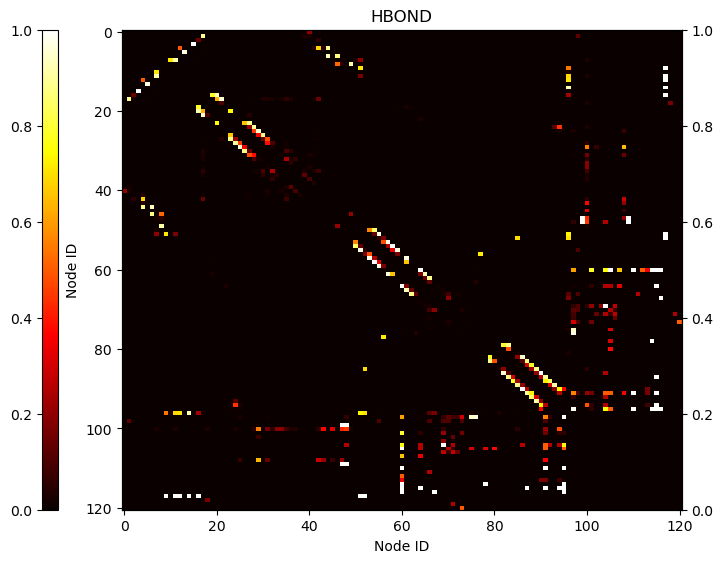

(array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]),
 {0: 1,
  1: 2,
  2: 3,
  3: 4,
  4: 5,
  5: 6,
  6: 7,
  7: 8,
  8: 9,
  9: 10,
  10: 11,
  11: 12,
  12: 13,
  13: 14,
  14: 15,
  15: 16,
  16: 17,
  17: 18,
  18: 19,
  19: 20,
  20: 21,
  21: 22,
  22: 23,
  23: 24,
  24: 25,
  25: 26,
  26: 27,
  27: 28,
  28: 29,
  29: 30,
  30: 31,
  31: 32,
  32: 33,
  33: 34,
  34: 35,
  35: 36,
  36: 37,
  37: 38,
  38: 39,
  39: 40,
  40: 41,
  41: 42,
  42: 43,
  43: 44,
  44: 45,
  45: 46,
  46: 47,
  47: 48,
  48: 49,
  49: 50,
  50: 51,
  51: 52,
  52: 53,
  53: 54,
  54: 55,
  55: 56,
  56: 57,
  57: 58,
  58: 59,
  59: 60,
  60: 61,
  61: 62,
  62: 63,
  63: 64,
  64: 65,
  65: 66,
  66: 67,
  67: 68,
  68: 69,
  69: 70,
  70: 71,
  71: 72,
  72: 73,
  73: 74,
  74: 75,
  75: 77,
  76: 78,


In [5]:
rh.plot_hRIN_prob(inter='HBOND', )

In [7]:
rh.entity_df

,label_entity_id,label_asym_id,auth_asym_id,hetatm_auth_seq_id,Cartn_x,Cartn_y,Cartn_z,id,type,src_method,...,entity_id,db_name,db_code,pdbx_db_accession,name,comp_id,src_acc,identifier,EIDN,node_id
0,1,A,B,None,42.189329,34.089508,97.278294,1,polymer,man,...,1,UNP,ELOB_HUMAN,Q15370,NaN,NaN,QUERY,Q15370,0,97
1,2,B,C,None,53.321160,29.473338,110.399287,2,polymer,man,...,2,UNP,ELOC_HUMAN,Q15369,NaN,NaN,QUERY,Q15369,1,98
2,3,C,V,None,42.209126,16.530610,132.441679,3,polymer,man,...,3,UNP,VHL_HUMAN,P40337,NaN,NaN,QUERY,P40337,2,99
3,4,D,H,None,24.697156,12.867859,134.300641,4,polymer,syn,...,4,UNP,HIF1A_HUMAN,Q16665,NaN,NaN,QUERY,Q16665,3,100
4,4,D,H,564,24.697156,12.867859,134.300641,4,polymer,syn,...,4,UNP,HIF1A_HUMAN,Q16665,NaN,NaN,QUERY,Q16665,3,100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5,2,F,F,None,78.884405,91.748061,30.464247,2,polymer,man,...,2,UNP,VIF_VILVK,P69717,NaN,NaN,7upn,P69717,73,170
6,3,G,G,None,112.131338,84.579659,34.181302,3,polymer,man,...,3,UNP,ELOC_HUMAN,Q15369,NaN,NaN,7upn,Q15369,1,98
7,4,H,I,None,128.414499,87.975519,21.874719,4,polymer,man,...,4,UNP,ELOB_HUMAN,Q15370,NaN,NaN,7upn,Q15370,0,97
8,5,I,C,301,49.674458,107.510435,16.255271,5,non-polymer,syn,...,NaN,NaN,NaN,NaN,NaN,NaN,7upn,ZINC ION,16,113


In [11]:
rh.query_seq

'MYVKLISSDGHEFIVKREHALTSGTIKAMLSGPNEVNFREIPSHVLSKVCMYFTYKVRYTNSSTEIPEFPIAPEIALELLMAANFLDC'

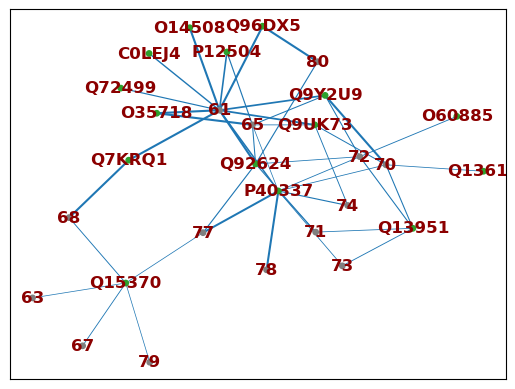

In [8]:
rh.plot_hRIN_network(inter_types=['HBOND'], trim=(60,80), inter_class='inter')

In [17]:
vhl_contact_df = rh.entity_contact_df[rh.entity_contact_df['db_code_2'].fillna('').str.contains('VHL')]

In [20]:
vhl_contact_df.groupby('u_node').size().sort_values()

u_node
28     1
29     1
70     1
72     1
93     1
84     1
68     2
64     3
89     4
69     4
81     5
85     6
91     7
79     9
87    10
74    10
71    11
88    12
73    17
92    17
60    20
77    22
96    25
76    40
dtype: int64

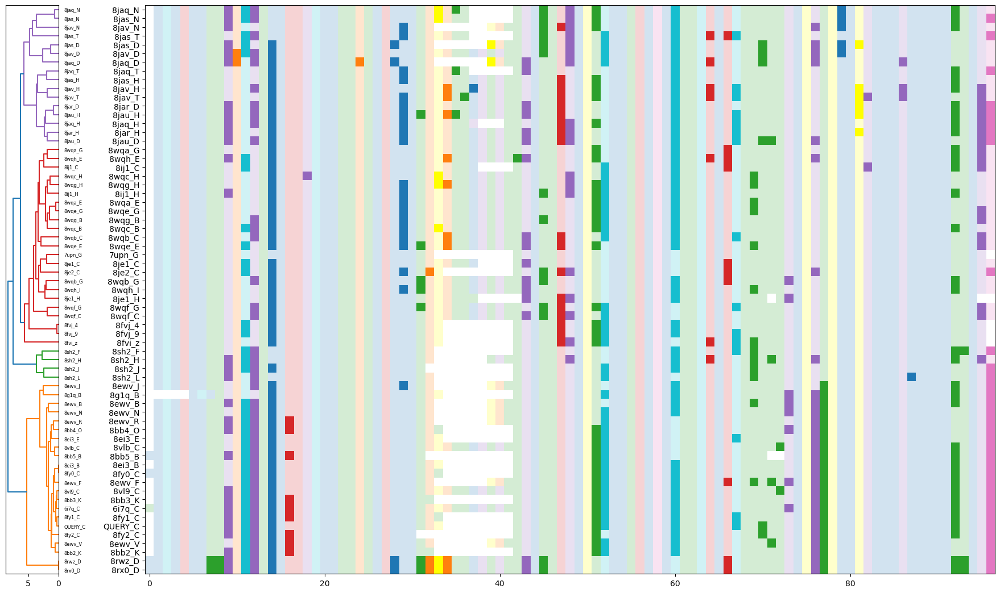

([47,
  41,
  35,
  40,
  43,
  37,
  49,
  46,
  42,
  36,
  34,
  45,
  38,
  48,
  44,
  39,
  26,
  15,
  9,
  22,
  16,
  8,
  27,
  20,
  17,
  23,
  24,
  21,
  64,
  7,
  5,
  25,
  14,
  6,
  19,
  18,
  54,
  53,
  55,
  33,
  32,
  31,
  30,
  59,
  50,
  61,
  58,
  57,
  2,
  62,
  28,
  1,
  63,
  12,
  60,
  29,
  3,
  13,
  52,
  0,
  51,
  56,
  4,
  11,
  10],
 ['8jaq_N',
  '8jas_N',
  '8jav_N',
  '8jas_T',
  '8jas_D',
  '8jav_D',
  '8jaq_D',
  '8jaq_T',
  '8jas_H',
  '8jav_H',
  '8jav_T',
  '8jar_D',
  '8jau_H',
  '8jaq_H',
  '8jar_H',
  '8jau_D',
  '8wqa_G',
  '8wqh_E',
  '8ij1_C',
  '8wqc_H',
  '8wqg_H',
  '8ij1_H',
  '8wqa_E',
  '8wqe_G',
  '8wqg_B',
  '8wqc_B',
  '8wqb_C',
  '8wqe_E',
  '7upn_G',
  '8je1_C',
  '8je2_C',
  '8wqb_G',
  '8wqh_I',
  '8je1_H',
  '8wqf_G',
  '8wqf_C',
  '8fvj_4',
  '8fvj_9',
  '8fvi_z',
  '8sh2_F',
  '8sh2_H',
  '8sh2_J',
  '8sh2_L',
  '8ewv_J',
  '8g1q_B',
  '8ewv_B',
  '8ewv_N',
  '8ewv_R',
  '8bb4_O',
  '8ei3_E',
  '8vlb_C',
  '8bb5

In [6]:
rh.plot_contact_conservation(inter_class='inter', contact_type='HBOND', trim=)

In [28]:
import json
blast_header = 'sseqid qstart qend sstart send evalue gaps sseq qseq'
blast_input_f = 'query_ring.fasta'
eval=1E-3
db = blast_DBs['SPROT']#'pdb' # 13
remote = False
blast_client = NcbiblastpCommandline(query=blast_input_f, db=db, outfmt=15, evalue=eval, remote=remote)#, out=blast_output_f)
stdout, stderr = blast_client()
blast_json = json.loads(stdout)

hits = blast_json['BlastOutput2'][0]['report']['results']['search']['hits']

# check the first result to see if acc formatted like PDB entries or UNP
# Needed because BLAST does not use a consistent/useful schema for different databases
test_acc = hits[0]['description'][0]['accession']
test_acc = test_acc.split('_')
test_title = hits[0]['description'][0]['title']
if (db not in ['pdb', 'sprot']) and remote:
    raise Exception("Supported remote Databases are 'sprot' and 'pdb'")
# check if acc are PDB or uniprot
# This is not a robust way of doing things
if (len(test_acc) == 2) and (len(test_acc[0]) == 4):
    acc_fmt = 'pdb'
elif test_title.split('|')[0] == 'sp':
    acc_fmt = 'unp'
else:
    acc_fmt = None
    raise Exception("Unknown / unsupported BLAST output scheme.")


hit_dfs = []
for hit in hits:
    desc_df = pd.json_normalize(hit['description'])
    hsps_df = pd.json_normalize(hit['hsps']).iloc[[0]]
    # if len(hsps_df) > 1:
    #     raise Exception("Multiple alignments for a hit!")
    hsps_df = pd.concat([hsps_df] * len(desc_df), ignore_index=True)
    hit_df = pd.concat([desc_df, hsps_df], axis=1)
    hit_dfs.append(hit_df)
blast_df = pd.concat(hit_dfs, ignore_index=True)
if acc_fmt == 'pdb':
    blast_df = blast_df.rename(
        columns={
            'id': 'sseqid',
            'accession': 'acc_chn', 
            'query_from': 'qstart', 
            'query_to': 'qend', 
            'hit_from': 'sstart', 
            'hit_to': 'send'}
    )
elif acc_fmt == 'unp':
    blast_df['acc'] = blast_df['title'].str.split('|').str[1]
    # AF structures will all only have chain A
    # dummy cols so errors aren't thrown elsewhere.
    blast_df['pdb_chain'] = 'A'
    blast_df['acc_chn'] = blast_df['acc'] + '_A'

blast_df

,id,accession,title,num,bit_score,score,evalue,identity,positive,query_from,...,hit_from,hit_to,align_len,gaps,qseq,hseq,midline,acc,pdb_chain,acc_chn
0,gnl|BL_ORD_ID|120741,120741,sp|P83941|ELOC_RAT Elongin-C OS=Rattus norvegi...,1,176.4070,446,5.547160e-58,88,88,1,...,17,112,96,8,MYVKLISSDGHEFIVKREHALTSGTIKAMLSGP--------NEVNF...,MYVKLISSDGHEFIVKREHALTSGTIKAMLSGPGQFAENETNEVNF...,MYVKLISSDGHEFIVKREHALTSGTIKAMLSGP NEVNF...,P83941,A,P83941_A
1,gnl|BL_ORD_ID|120740,120740,sp|P83940|ELOC_MOUSE Elongin-C OS=Mus musculus...,1,176.4070,446,5.547160e-58,88,88,1,...,17,112,96,8,MYVKLISSDGHEFIVKREHALTSGTIKAMLSGP--------NEVNF...,MYVKLISSDGHEFIVKREHALTSGTIKAMLSGPGQFAENETNEVNF...,MYVKLISSDGHEFIVKREHALTSGTIKAMLSGP NEVNF...,P83940,A,P83940_A
2,gnl|BL_ORD_ID|120739,120739,sp|Q15369|ELOC_HUMAN Elongin-C OS=Homo sapiens...,1,176.4070,446,5.547160e-58,88,88,1,...,17,112,96,8,MYVKLISSDGHEFIVKREHALTSGTIKAMLSGP--------NEVNF...,MYVKLISSDGHEFIVKREHALTSGTIKAMLSGPGQFAENETNEVNF...,MYVKLISSDGHEFIVKREHALTSGTIKAMLSGP NEVNF...,Q15369,A,Q15369_A
3,gnl|BL_ORD_ID|120736,120736,sp|Q2KII4|ELOC_BOVIN Elongin-C OS=Bos taurus O...,1,176.4070,446,5.547160e-58,88,88,1,...,17,112,96,8,MYVKLISSDGHEFIVKREHALTSGTIKAMLSGP--------NEVNF...,MYVKLISSDGHEFIVKREHALTSGTIKAMLSGPGQFAENETNEVNF...,MYVKLISSDGHEFIVKREHALTSGTIKAMLSGP NEVNF...,Q2KII4,A,Q2KII4_A
4,gnl|BL_ORD_ID|120737,120737,sp|Q54Q05|ELOC_DICDI Elongin-C OS=Dictyosteliu...,1,97.8265,242,5.206990e-27,47,67,3,...,15,109,95,9,VKLISSDGHEFIVKREHALTSGTIKAMLSGPN---------EVNFR...,LRLYSSTGHEFVLSRKMSYVSGTIKSMLSGDNSNFMEDQNNEIRFR...,++L SS GHEF++ R+ + SGTIK+MLSG N E+ FR...,Q54Q05,A,Q54Q05_A
5,gnl|BL_ORD_ID|120742,120742,sp|Q9USX9|ELOC_SCHPO Elongin-C OS=Schizosaccha...,1,75.4850,184,2.262820e-18,42,58,2,...,5,96,93,8,YVKLISSDGHEFIVKREHALTSGTIKAML-------SGPNEVNFRE...,YVRLISGDGFVFILEKEIACLSGTIRAILNEGIFSEAQKNECTFPD...,YV+LIS DG FI+++E A SGTI+A+L + NE F +...,Q9USX9,A,Q9USX9_A
6,gnl|BL_ORD_ID|120743,120743,sp|Q03071|ELOC_YEAST Elongin-C OS=Saccharomyce...,1,71.6330,174,9.210470e-17,36,55,2,...,5,97,93,8,YVKLISSDGHEFIVKREHALTSGTIKAMLSGP-----NEVNFREIP...,FVTLVSKDDKEYEISRSAAMISPTLKAMIEGPFRESKGRIELKQFD...,+V L+S D E+ + R A+ S T+KAM+ GP + ++ ...,Q03071,A,Q03071_A
7,gnl|BL_ORD_ID|120738,120738,sp|Q751F9|ELOC_EREGS Elongin-C OS=Eremothecium...,1,62.7734,151,2.557320e-13,36,54,2,...,6,98,93,8,YVKLISSDGHEFIVKREHALTSGTIKAMLSGP------NEVNFREI...,HVTLVSSDGKSFEVPRERAMLSPTLAKMLDSSFAEAKEAKVTLPTI...,+V L+SSDG F V RE A+ S T+ ML +V I...,Q751F9,A,Q751F9_A
8,gnl|BL_ORD_ID|449492,449492,sp|Q9Y709|SKP1_SCHPO Suppressor of kinetochore...,1,40.0466,92,4.679360e-04,33,51,3,...,4,109,107,23,VKLISSDGHEFIVKREHALTSGTIKAMLSGPNEVN----FREIPSH...,IKLISSDNEEFVVDQLIAERSMLIKNMLEDVGEINVPIPLPNVSSN...,+KLISSD EF+V + A S IK ML E+N + S+...,Q9Y709,A,Q9Y709_A


In [24]:
rh = HomologyRing.HomologyRing('query/2PGH.cif', blast_DBs['PDB'], struct_source='PDB', log_level=logging.DEBUG, uses_PDB_ids=True)
#rh.acc_PDB = True
rh.verbose = True
rh.build('A','1', force_download=False, force_RING=False, max_results=64, use_label_asym_id=False, prob_normalization='possible')
self = rh

Bad edges found: 3 instances in ['6r2o', '5c6e', '2zlx']. They have been filtered, but this issue should be resolved.


In [32]:
rec = rh.get_seqrecord_by_id('2rao_A')
print(rec.seq)

VLSPADKTNIKTAWEKIGSHGGEYGAEAVERMFLGFPTTKTYFPHFDFTHGSEQIKAHGKKVSEALTKAVGHLDDLPGALSTLSDLHAHKLRVDPVNFKLLSHCLLVTLANHHPSEFTPAVHASLDKFLANVSTVLTSKYR


In [36]:
f_df = rh.filter_contact_df(inter_type='PIHBOND', inter_class='intra')
f_df = f_df[f_df['acc_chn'] == '2rao_A']
f_df

,NodeId1,Interaction,NodeId2,Distance,acc,acc_chn,chain1,chain2,struct_id1,struct_id2,...,inter_orientation,msaCol1,msaCol2,Node1_name,Node2_name,inter_class,res1_one,res2_one,hetatm_auth_seq_id_1,hetatm_auth_seq_id_2
7669,A:110:_:ALA,PIHBOND:MC_SC,A:117:_:PHE,4.151,2rao,2rao_A,A,A,110,117,...,MC_SC,109,116,ALA,PHE,intra,A,F,None,None


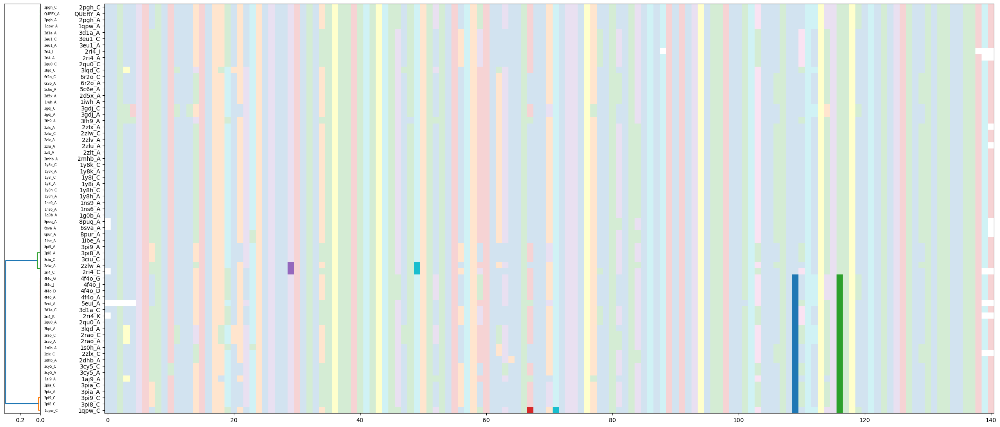

([5,
  0,
  6,
  8,
  11,
  12,
  13,
  15,
  17,
  18,
  20,
  22,
  23,
  24,
  25,
  26,
  29,
  30,
  32,
  34,
  35,
  37,
  38,
  39,
  40,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  55,
  56,
  61,
  63,
  64,
  36,
  16,
  2,
  1,
  3,
  4,
  9,
  10,
  14,
  19,
  21,
  27,
  28,
  31,
  33,
  41,
  53,
  54,
  57,
  58,
  59,
  60,
  62,
  7],
 ['2pgh_C',
  'QUERY_A',
  '2pgh_A',
  '1qpw_A',
  '3d1a_A',
  '3eu1_C',
  '3eu1_A',
  '2ri4_I',
  '2ri4_A',
  '2qu0_C',
  '3lqd_C',
  '6r2o_C',
  '6r2o_A',
  '5c6e_A',
  '2d5x_A',
  '1iwh_A',
  '3gdj_C',
  '3gdj_A',
  '3fh9_A',
  '2zlx_A',
  '2zlw_C',
  '2zlv_A',
  '2zlu_A',
  '2zlt_A',
  '2mhb_A',
  '1y8k_C',
  '1y8k_A',
  '1y8i_C',
  '1y8i_A',
  '1y8h_C',
  '1y8h_A',
  '1ns9_A',
  '1ns6_A',
  '1g0b_A',
  '8puq_A',
  '6sva_A',
  '8pur_A',
  '1ibe_A',
  '3pi9_A',
  '3pi8_A',
  '3ciu_C',
  '2zlw_A',
  '2ri4_C',
  '4f4o_G',
  '4f4o_J',
  '4f4o_D',
  '4f4o_A',
  '5eui_A',
  '3d1a_C',
  '2ri4_K',
  '2qu0_A',
  '3lq

In [30]:
rh.plot_contact_conservation('PIHBOND', inter_class='intra')

## Build from user-defined family (DDX Analysis)

### Test of family defined from file

In [2]:
rh = HomologyRing.HomologyRing('DDX_human_pdb/DDX2B_Q14240/3bor.cif', blast_DBs['PDB'], struct_source='PDB', log_level=logging.DEBUG, uses_PDB_ids=True)
#rh.acc_PDB = True
rh.verbose = True
family_dir = 'DDX_family.tsv'#'DDX_human_pdb'
tst = rh.build_fromFamily(family_dir, 'A','1', force_RING=False, use_label_asym_id=False)

Bad edges found: 48 instances in ['6UV4', '6L5M', '2RB4', '7OI6', '8FKT']. They have been filtered, but this issue should be resolved.


In [4]:
rh.save_family('test_fam_out.tsv')

,PDB,path,chain
0,4XW3,DDX_human_pdb/DDX1_Q92499/4xw3.cif,A
1,4XW3,DDX_human_pdb/DDX1_Q92499/4xw3.cif,B
2,2PL3,DDX_human_pdb/DDX10_Q13206/2pl3.cif,A
3,6UV4,DDX_human_pdb/DDX17_Q92841/6uv4.cif,A
4,3LY5,DDX_human_pdb/DDX18_Q9NVP1/3ly5.cif,A
5,3LY5,DDX_human_pdb/DDX18_Q9NVP1/3ly5.cif,B
6,3EWS,DDX_human_pdb/DDX19B_Q9UMR2/3ews.cif,A
7,3EWS,DDX_human_pdb/DDX19B_Q9UMR2/3ews.cif,B
8,3B7G,DDX_human_pdb/DDX20_Q9UHI6/3b7g.cif,A
9,3B7G,DDX_human_pdb/DDX20_Q9UHI6/3b7g.cif,B


### Test of family from directory
Requires additional logic to filter homolog chains of interest

In [4]:
rh = HomologyRing.HomologyRing('DDX_human_pdb/DDX2B_Q14240/3bor.cif', blast_DBs['PDB'], struct_source='PDB', log_level=logging.DEBUG, uses_PDB_ids=True)
#rh.acc_PDB = True
rh.verbose = True
family_dir = 'DDX_human_pdb'
tst = rh.build_fromFamily(family_dir, 'A','1', force_RING=False, use_label_asym_id=False)

No Gene information for DDX_human_pdb/DDX288_Q9NUL7/7oi6.cif. Structure Skipped
No Gene information for DDX_human_pdb/DDX54_Q8TDD1/8fkv.cif. Structure Skipped
No Gene information for DDX_human_pdb/DDX54_Q8TDD1/8fkt.cif. Structure Skipped
Bad edges found: 86 instances in ['2HYI', '6UV4', '6UV2']. They have been filtered, but this issue should be resolved.


In [5]:
rh.file_df

,acc,acc_chn,pdb_chain,struct_pth,has_unk_res,edge_pth,node_pth,error
0,2HXY,2HXY_A,A,DDX_human_pdb/DDX48_P38919/2hxy.cif,False,ring_out/PDB/2hxy.cif_ringEdges,ring_out/PDB/2hxy.cif_ringNodes,None
1,2HXY,2HXY_B,B,DDX_human_pdb/DDX48_P38919/2hxy.cif,False,ring_out/PDB/2hxy.cif_ringEdges,ring_out/PDB/2hxy.cif_ringNodes,None
2,2HXY,2HXY_C,C,DDX_human_pdb/DDX48_P38919/2hxy.cif,False,ring_out/PDB/2hxy.cif_ringEdges,ring_out/PDB/2hxy.cif_ringNodes,None
3,2HXY,2HXY_D,D,DDX_human_pdb/DDX48_P38919/2hxy.cif,False,ring_out/PDB/2hxy.cif_ringEdges,ring_out/PDB/2hxy.cif_ringNodes,None
4,2HYI,2HYI_C,C,DDX_human_pdb/DDX48_P38919/2hyi.cif,False,ring_out/PDB/2hyi.cif_ringEdges,ring_out/PDB/2hyi.cif_ringNodes,None
5,2HYI,2HYI_I,I,DDX_human_pdb/DDX48_P38919/2hyi.cif,False,ring_out/PDB/2hyi.cif_ringEdges,ring_out/PDB/2hyi.cif_ringNodes,None
6,3BOR,3BOR_A,A,DDX_human_pdb/DDX2B_Q14240/3bor.cif,False,ring_out/PDB/3bor.cif_ringEdges,ring_out/PDB/3bor.cif_ringNodes,None
7,3FE2,3FE2_A,A,DDX_human_pdb/DDX5_P17844/3fe2.cif,False,ring_out/PDB/3fe2.cif_ringEdges,ring_out/PDB/3fe2.cif_ringNodes,None
8,3FE2,3FE2_B,B,DDX_human_pdb/DDX5_P17844/3fe2.cif,False,ring_out/PDB/3fe2.cif_ringEdges,ring_out/PDB/3fe2.cif_ringNodes,None
9,4A4D,4A4D_A,A,DDX_human_pdb/DDX5_P17844/4a4d.cif,False,ring_out/PDB/4a4d.cif_ringEdges,ring_out/PDB/4a4d.cif_ringNodes,None


In [8]:
rh.entity_df[rh.entity_df['type']=='polymer']['db_code'].unique()

array(['DDX48_HUMAN', '2HYI', 'MGN_HUMAN', 'RBM8A_HUMAN', 'CASC3_HUMAN',
       'IF4A2_HUMAN', 'DDX5_HUMAN', 'DDX17_HUMAN', '6UV4', '6UV2',
       'DDX18_HUMAN', 'DDX41_HUMAN', 'SF3B2_HUMAN', 'SF3B3_HUMAN',
       'SF3B5_HUMAN', 'PHF5A_HUMAN', 'NR_002716.3', 'SF3A3_HUMAN',
       'HTSF1_HUMAN', 'SF3B1_HUMAN', 'DDX46_HUMAN', 'K02227.1',
       'SF3B4_HUMAN', 'SF3A1_HUMAN', 'SF3A2_HUMAN', 'A0A0C4DG89_HUMAN',
       'RU2A_HUMAN', 'RU2B_HUMAN', 'SMD2_HUMAN', 'RUXF_HUMAN',
       'RUXE_HUMAN', 'RUXG_HUMAN', 'SMD3_HUMAN', 'RSMB_HUMAN',
       'SMD1_HUMAN', 'DDX10_HUMAN', 'DDX23_HUMAN', 'DDX3X_HUMAN',
       'DDX20_HUMAN', 'DD19B_HUMAN', 'NU214_HUMAN', 'DDX6_HUMAN',
       'DDX1_HUMAN', 'DDX47_HUMAN', 'IF4A1_HUMAN', 'PDCD4_MOUSE',
       'PDCD4_HUMAN', 'DDX53_HUMAN', 'DDX42_HUMAN'], dtype=object)

In [5]:
[one_to_three(res) for res in "DEAD"]

['Asp', 'Glu', 'Ala', 'Asp']

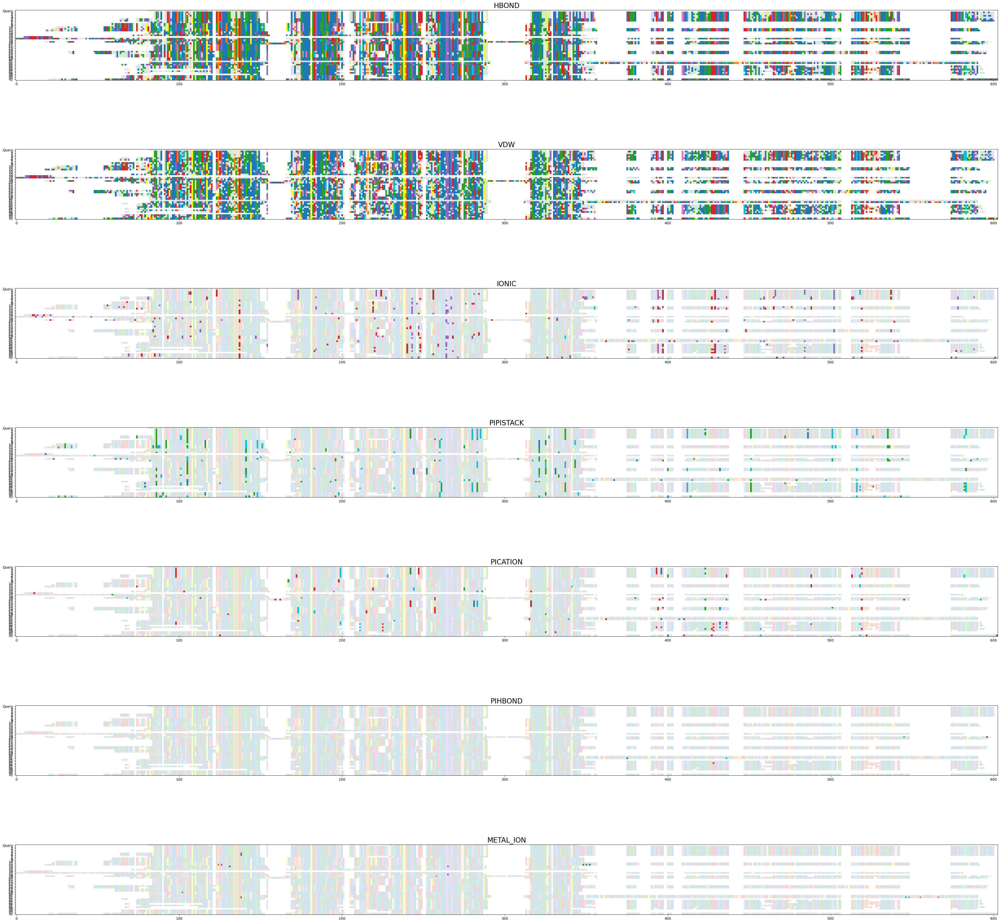

In [3]:
rh.plot_contacts()

/home/bio/.conda/envs/bioT/lib/python3.11/site-packages/scipy/cluster/hierarchy.py:2875: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim([dvw, 0])


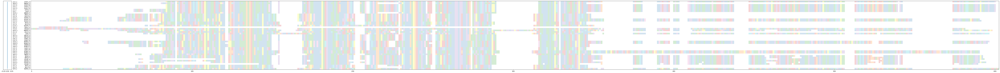

([1,
  0,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42],
 ['2HXY_A',
  '3BOR_A',
  '2HXY_B',
  '2HXY_C',
  '2HXY_D',
  '2HYI_C',
  '2HYI_I',
  '3BOR_A',
  '3FE2_A',
  '3FE2_B',
  '4A4D_A',
  '6UV4_A',
  '6UV2_A',
  '3LY5_A',
  '3LY5_B',
  '5GVR_A',
  '7Q3L_p',
  '7EVO_E',
  '4NHO_A',
  '2PL3_A',
  '2I4I_A',
  '3B7G_A',
  '3B7G_B',
  '2OXC_A',
  '2OXC_B',
  '3EWS_A',
  '3EWS_B',
  '3FMP_B',
  '3FMP_D',
  '1VEC_A',
  '1VEC_B',
  '8TBX_A',
  '8TBX_A',
  '3BER_A',
  '3EIQ_A',
  '3EIQ_D',
  '2ZU6_A',
  '2ZU6_C',
  '2ZU6_D',
  '2ZU6_F',
  '3IUY_A',
  '3IUY_B',
  '8DPE_A'])

In [20]:
rh.plot_contact_conservation('SSBOND', inter_class='intra')

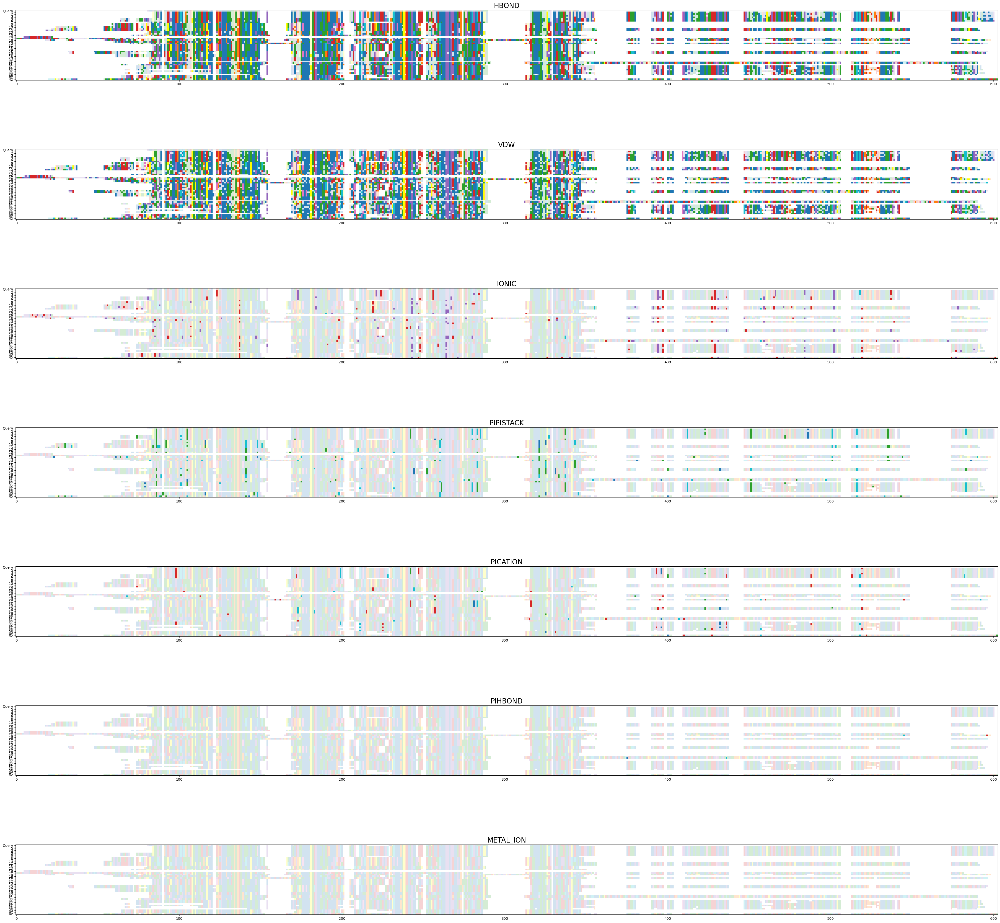

In [5]:
rh.plot_contacts(inter_participants='intra')

In [23]:
[one_to_three(res) for res in 'DEAD']

['Asp', 'Glu', 'Ala', 'Asp']

In [10]:
edges = []
for u, v, data in rh.MultiGraph.edges(data=True):
    row = {'u':u, 'v':v}
    row.update(data)
    edges.append(row)
edge_df = pd.DataFrame(edges).sort_values('prob', ascending=False)
edge_df.head(20)

,u,v,inter,prob,observations,count,color,_crv_idx,_crv_total,_crv_offset
1498,264,179,HBOND,0.952381,"[2HXY_A, 2HXY_B, 2HXY_C, 2HXY_D, 2HYI_C, 2HYI_...",40,tab:blue,1,2,0.5
288,242,238,HBOND,0.952381,"[2HXY_A, 2HXY_B, 2HXY_C, 2HXY_D, 2HYI_C, 2HYI_...",40,tab:blue,1,2,0.5
2027,179,262,HBOND,0.952381,"[2HXY_A, 2HXY_B, 2HXY_C, 2HXY_D, 2HYI_C, 2HYI_...",40,tab:blue,1,2,0.5
359,177,262,HBOND,0.952381,"[2HXY_A, 2HXY_B, 2HXY_C, 2HXY_D, 2HYI_C, 2HYI_...",40,tab:blue,1,2,0.5
362,177,260,HBOND,0.952381,"[2HXY_A, 2HXY_B, 2HXY_C, 2HXY_D, 2HYI_C, 2HYI_...",40,tab:blue,1,2,0.5
1383,182,186,HBOND,0.952381,"[2HXY_A, 2HXY_B, 2HXY_C, 2HXY_D, 2HYI_C, 2HYI_...",40,tab:blue,1,2,0.5
514,234,178,HBOND,0.952381,"[2HXY_A, 2HXY_B, 2HXY_C, 2HXY_D, 2HYI_C, 2HYI_...",40,tab:blue,1,2,0.5
2321,178,236,HBOND,0.952381,"[2HXY_A, 2HXY_B, 2HXY_C, 2HXY_D, 2HYI_C, 2HYI_...",40,tab:blue,1,2,0.5
2210,191,187,HBOND,0.952381,"[2HXY_A, 2HXY_B, 2HXY_C, 2HXY_D, 2HYI_C, 2HYI_...",40,tab:blue,1,2,0.5
439,176,234,HBOND,0.952381,"[2HXY_A, 2HXY_B, 2HXY_C, 2HXY_D, 2HYI_C, 2HYI_...",40,tab:blue,1,2,0.5


In [ ]:
rh.plot_hRIN_prob()

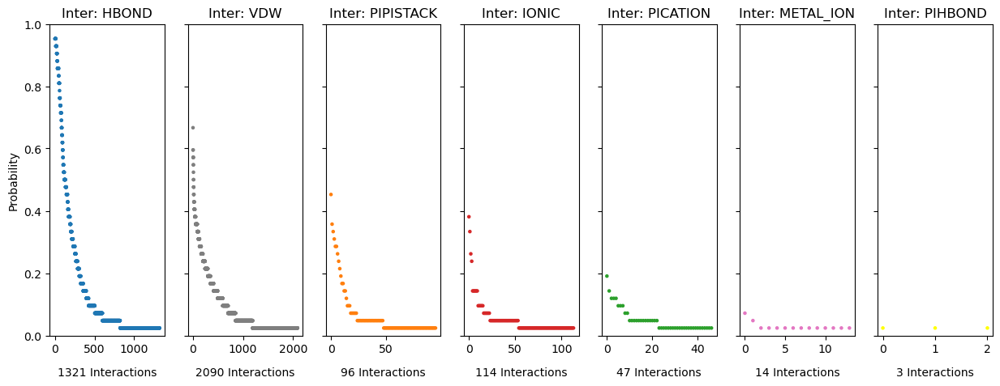

In [9]:
inters = edge_df['inter'].unique()
fig, ax = plt.subplots(1, len(inters), figsize=(15, 5))
for i, inter in enumerate(inters):
    f_df = edge_df[edge_df['inter'] == inter]
    ax[i].scatter(np.arange(len(f_df)), list(f_df['prob']), c=f_df['color'], s=5)
    ax[i].set_ylim(0,1)
    ax[i].set_title(f'Inter: {inter}')
    if i == 0:
        ax[i].set_ylabel('Probability')
    else:
        ax[i].set_yticklabels([]) 
    ax[i].text(0.5, -0.1, f'{len(f_df)} Interactions', ha='center', va='top', transform=ax[i].transAxes)

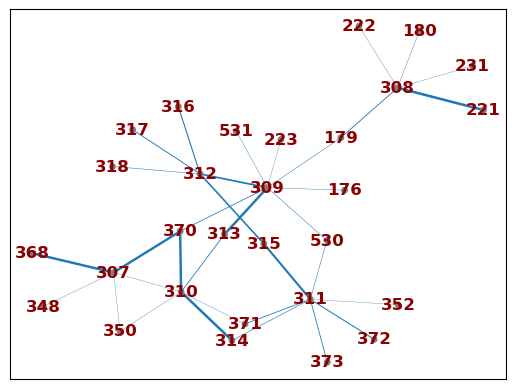

In [4]:
DEAD_hRIN = rh.plot_hRIN_network(inter_types='HBOND', inter_class='intra', trim=(307,311), min_weight=0.2, prob_weight=2)

In [15]:
DEAD_hRIN.nodes(data=True)[311]

{'node_type': 'RES',
 'color': '#1f77b4',
 'x': 52.964,
 'y': 5.134,
 'z': 28.658,
 'consensus': 'Asp'}

In [16]:
for u,v, data in DEAD_hRIN.edges(data=True):
    print(u,v, data)

221 308 {'inter': 'HBOND', 'prob': 0.8113207547169812, 'observations': ['2HXY_A', '2HXY_B', '2HXY_C', '2HXY_D', '2HYI_C', '2HYI_I', '3BOR_A', '8IJU_A', '3FE2_A', '3FE2_B', '6UV4_A', '6UV2_A', '6L5M_A', '6L5M_B', '6L5M_C', '6L5M_D', '6L5M_E', '6L5L_A', '3LY5_A', '3LY5_B', '5GVR_A', '3DKP_A', '7EVO_E', '4NHO_A', '2PL3_A', '2I4I_A', '3B7G_A', '3B7G_B', '2OXC_A', '2OXC_B', '3EWS_A', '3EWS_B', '3FMP_B', '3FMP_D', '8TBX_A', '3BER_A', '2ZU6_A', '2ZU6_C', '2ZU6_D', '2ZU6_F', '3IUY_A', '3IUY_B', '8DPE_A'], 'count': 43, 'color': 'tab:blue', '_crv_idx': 1, '_crv_total': 1, '_crv_offset': 0.0, 'crv_idx': 0}
308 231 {'inter': 'HBOND', 'prob': 0.018867924528301886, 'observations': ['2PL3_A'], 'count': 1, 'color': 'tab:blue', '_crv_idx': 1, '_crv_total': 1, '_crv_offset': 0.0, 'crv_idx': 0}
308 222 {'inter': 'HBOND', 'prob': 0.018867924528301886, 'observations': ['8TBX_A'], 'count': 1, 'color': 'tab:blue', '_crv_idx': 1, '_crv_total': 1, '_crv_offset': 0.0, 'crv_idx': 0}
308 180 {'inter': 'HBOND', 'p

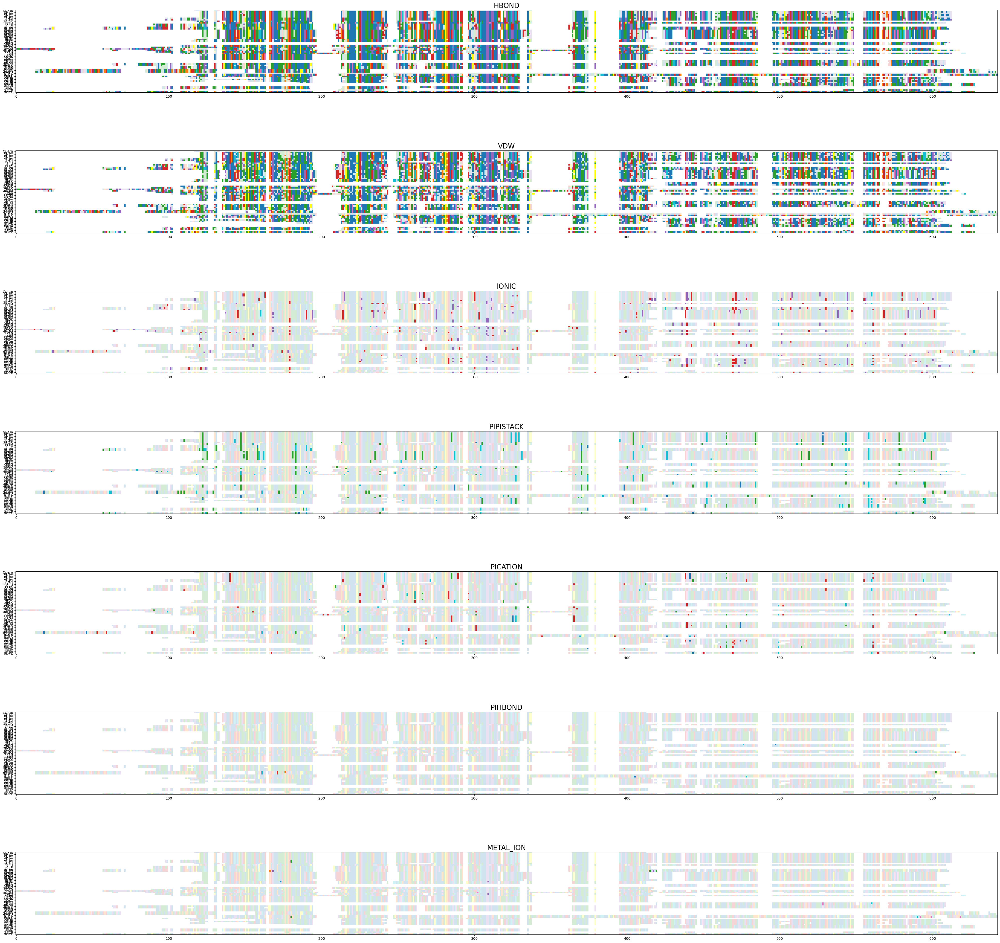

In [21]:
rh.plot_contacts(display_acc=True)

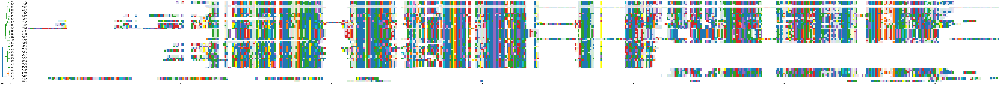

([6,
  5,
  1,
  0,
  41,
  2,
  4,
  3,
  8,
  36,
  35,
  46,
  44,
  53,
  28,
  26,
  12,
  11,
  25,
  17,
  13,
  15,
  14,
  16,
  18,
  42,
  47,
  45,
  51,
  50,
  43,
  23,
  10,
  9,
  20,
  19,
  38,
  37,
  27,
  24,
  30,
  29,
  32,
  31,
  7,
  22,
  21,
  49,
  48,
  34,
  33,
  40,
  39,
  52],
 ['2HYI_I',
  '2HYI_C',
  '2HXY_A',
  '3BOR_A',
  '8TBX_A',
  '2HXY_B',
  '2HXY_D',
  '2HXY_C',
  '8IJU_A',
  '3EWS_B',
  '3EWS_A',
  '2ZU6_D',
  '2ZU6_A',
  '8DPE_A',
  '2I4I_A',
  '4NHO_A',
  '6UV2_A',
  '6UV4_A',
  '7EVO_E',
  '6L5M_E',
  '6L5M_A',
  '6L5M_C',
  '6L5M_B',
  '6L5M_D',
  '6L5L_A',
  '8TBX_A',
  '2ZU6_F',
  '2ZU6_C',
  '3IUY_B',
  '3IUY_A',
  '3BER_A',
  '5GVR_A',
  '3FE2_B',
  '3FE2_A',
  '3LY5_B',
  '3LY5_A',
  '3FMP_D',
  '3FMP_B',
  '2PL3_A',
  '3DKP_A',
  '3B7G_B',
  '3B7G_A',
  '2OXC_B',
  '2OXC_A',
  '3BOR_A',
  '2P6N_B',
  '2P6N_A',
  '8KCA_B',
  '8KCA_A',
  '2RB4_B',
  '2RB4_A',
  '4XW3_B',
  '4XW3_A',
  '2E29_A'])

In [25]:
rh.plot_contact_conservation(contact_type='HBOND', inter_class='intra')

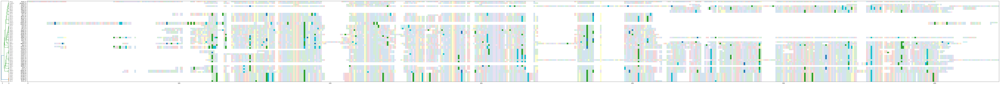

([25,
  0,
  52,
  42,
  49,
  48,
  22,
  21,
  51,
  50,
  30,
  29,
  31,
  32,
  40,
  39,
  20,
  19,
  27,
  24,
  38,
  37,
  23,
  43,
  53,
  10,
  9,
  28,
  26,
  8,
  12,
  11,
  47,
  46,
  44,
  45,
  3,
  1,
  4,
  41,
  2,
  34,
  33,
  7,
  6,
  5,
  36,
  35,
  14,
  13,
  15,
  16,
  17,
  18],
 ['7EVO_E',
  '_QUERY_A',
  '2E29_A',
  '8TBX_A',
  '8KCA_B',
  '8KCA_A',
  '2P6N_B',
  '2P6N_A',
  '3IUY_B',
  '3IUY_A',
  '3B7G_B',
  '3B7G_A',
  '2OXC_A',
  '2OXC_B',
  '4XW3_B',
  '4XW3_A',
  '3LY5_B',
  '3LY5_A',
  '2PL3_A',
  '3DKP_A',
  '3FMP_D',
  '3FMP_B',
  '5GVR_A',
  '3BER_A',
  '8DPE_A',
  '3FE2_B',
  '3FE2_A',
  '2I4I_A',
  '4NHO_A',
  '8IJU_A',
  '6UV2_A',
  '6UV4_A',
  '2ZU6_F',
  '2ZU6_D',
  '2ZU6_A',
  '2ZU6_C',
  '2HXY_C',
  '2HXY_A',
  '2HXY_D',
  '8TBX_A',
  '2HXY_B',
  '2RB4_B',
  '2RB4_A',
  '3BOR_A',
  '2HYI_I',
  '2HYI_C',
  '3EWS_B',
  '3EWS_A',
  '6L5M_B',
  '6L5M_A',
  '6L5M_C',
  '6L5M_D',
  '6L5M_E',
  '6L5L_A'])

In [7]:
rh.plot_contact_conservation(contact_type='PIPISTACK', inter_class='intra')

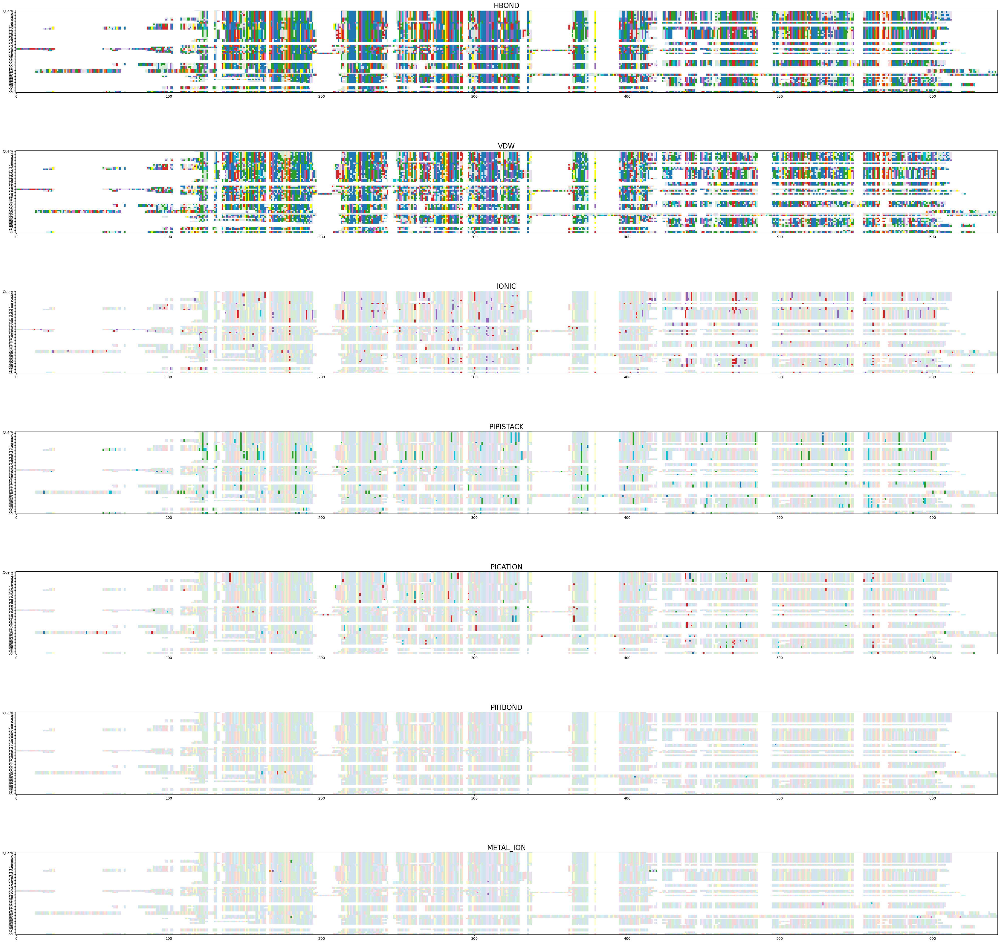

In [5]:
rh.plot_contacts()

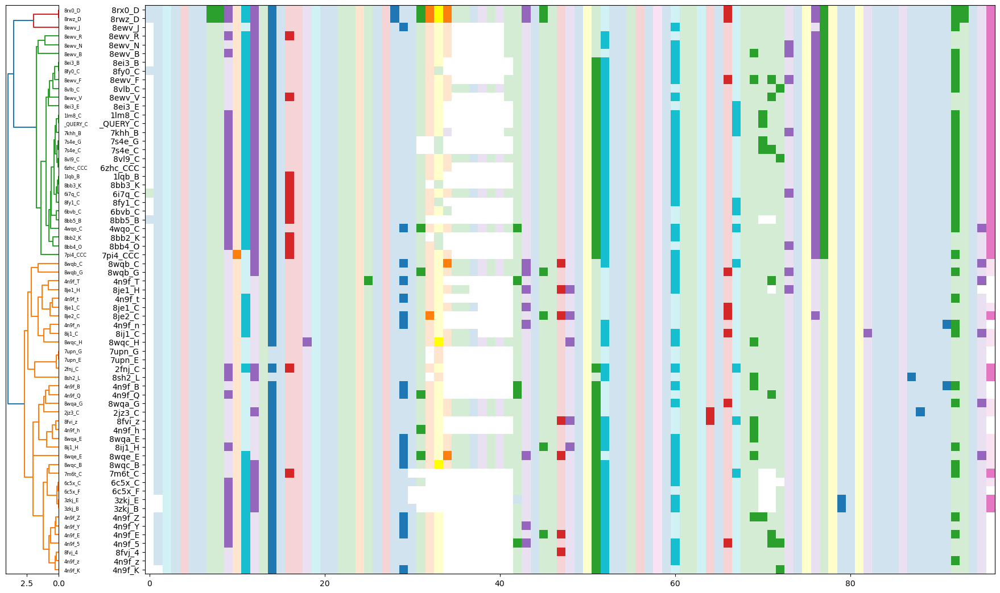

([12,
  11,
  26,
  28,
  22,
  24,
  30,
  10,
  25,
  57,
  29,
  23,
  34,
  0,
  15,
  19,
  18,
  56,
  14,
  35,
  3,
  13,
  54,
  51,
  1,
  33,
  4,
  2,
  17,
  61,
  60,
  49,
  6,
  47,
  7,
  5,
  32,
  9,
  63,
  21,
  20,
  36,
  55,
  50,
  43,
  59,
  37,
  46,
  45,
  58,
  8,
  64,
  62,
  16,
  31,
  27,
  39,
  38,
  44,
  40,
  41,
  53,
  52,
  48,
  42],
 ['8rx0_D',
  '8rwz_D',
  '8ewv_J',
  '8ewv_R',
  '8ewv_N',
  '8ewv_B',
  '8ei3_B',
  '8fy0_C',
  '8ewv_F',
  '8vlb_C',
  '8ewv_V',
  '8ei3_E',
  '1lm8_C',
  '_QUERY_C',
  '7khh_B',
  '7s4e_G',
  '7s4e_C',
  '8vl9_C',
  '6zhc_CCC',
  '1lqb_B',
  '8bb3_K',
  '6i7q_C',
  '8fy1_C',
  '6bvb_C',
  '8bb5_B',
  '4wqo_C',
  '8bb2_K',
  '8bb4_O',
  '7pi4_CCC',
  '8wqb_C',
  '8wqb_G',
  '4n9f_T',
  '8je1_H',
  '4n9f_t',
  '8je1_C',
  '8je2_C',
  '4n9f_n',
  '8ij1_C',
  '8wqc_H',
  '7upn_G',
  '7upn_E',
  '2fnj_C',
  '8sh2_L',
  '4n9f_B',
  '4n9f_Q',
  '8wqa_G',
  '2jz3_C',
  '8fvi_z',
  '4n9f_h',
  '8wqa_E',
  '8ij1_H',
 

In [4]:
rh.plot_contact_conservation(contact_type='HBOND', inter_class='inter')

In [10]:
rh.MultiGraph.nodes(data=True)

NodeDataView({67: {'node_type': 'RES', 'color': '#1f77b4', 'x': -14.804, 'y': 8.178, 'z': 49.369, 'consensus': 'Leu'}, 100: {'consensus': 'CHN', 'node_type': 'CHAIN', 'identifier': 'P48061', 'EIDN': 0, 'db_code': 'SDF1_HUMAN', 'pdbx_description': 'STROMAL DERIVED FACTOR-1ALPHA', 'x': 36.21893888759404, 'y': 36.03627907385762, 'z': -4.783104565809521, 'color': '#2ca02c'}, 21: {'node_type': 'RES', 'color': '#1f77b4', 'x': -11.147, 'y': 23.876, 'z': 56.566, 'consensus': 'Arg'}, 24: {'node_type': 'RES', 'color': '#1f77b4', 'x': -12.191, 'y': 26.122, 'z': 52.046, 'consensus': 'Val'}, 23: {'node_type': 'RES', 'color': '#1f77b4', 'x': -12.612, 'y': 28.7, 'z': 54.822, 'consensus': 'Asn'}, 45: {'node_type': 'RES', 'color': '#1f77b4', 'x': -13.594, 'y': 34.395, 'z': 52.549, 'consensus': 'Asn'}, 52: {'node_type': 'RES', 'color': '#1f77b4', 'x': -1.275, 'y': 24.613, 'z': 50.325, 'consensus': 'Ile'}, 59: {'node_type': 'RES', 'color': '#1f77b4', 'x': -5.982, 'y': 17.227, 'z': 54.242, 'consensus': 'I

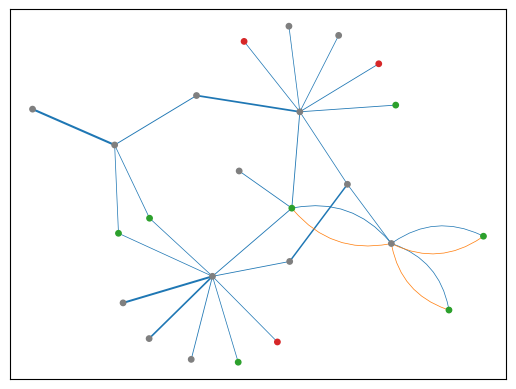

In [36]:
out_graph = rh.plot_hRIN_network(inter_class='all', inter_types=['HBOND', 'PIPISTACK', 'IONIC', 'SSBOND', 'PIHBOND'], trim=(16,20))

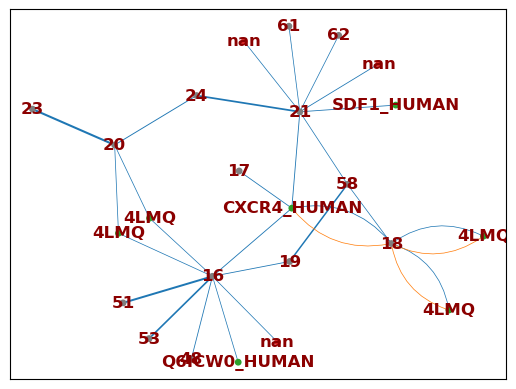

In [3]:
# Gene name
out_graph = rh.plot_hRIN_network(inter_class='all', inter_types=['HBOND', 'PIPISTACK', 'IONIC', 'SSBOND', 'PIHBOND'], trim=(16,20))

In [15]:
cfr = CifFileReader()
for i, r in rh.file_df.iterrows():
    pth = r['struct_pth']
    cif_obj = cfr.read(r['struct_pth']) #read the cif file - path comes from file_df
    acc_chn = r['acc_chn']
    acc, cif_obj = next(iter(cif_obj.items())) # get first entry in cif. Check if this will ever not be the case
    print(acc_chn)
    struct_ref = cif_obj['_struct_ref']
    print(pd.DataFrame(struct_ref))
    break

_QUERY_C
  id db_name      db_code entity_id  \
0  1     UNP   ELOB_HUMAN         1   
1  2     UNP   ELOC_HUMAN         2   
2  3     UNP    VHL_HUMAN         3   
3  4     UNP  HIF1A_HUMAN         4   

                            pdbx_seq_one_letter_code pdbx_align_begin  \
0  MDVFLMIRRHKTTIFTDAKESSTVFELKRIVEGILKRPPDEQRLYK...                1   
1  MYVKLISSDGHEFIVKREHALTSGTIKAMLSGPGQFAENETNEVNF...               17   
2  MEAGRPRPVLRSVNSREPSQVIFCNRSPRVVLPVWLNFDGEPQPYP...               54   
3                               DLDLEMLAPYIPMDDDFQLR              556   

  pdbx_db_accession pdbx_db_isoform  
0            Q15370               ?  
1            Q15369               ?  
2            P40337               ?  
3            Q16665               ?  


In [5]:
rh.entity_df['db_code'].unique()

array(['SDF1_HUMAN', nan, 'H7BX38_MOUSE', 'Q6ICW0_HUMAN', 'ACKR3_HUMAN',
       '7SK3', '7SK7', '7SK8', 'CXCR4_HUMAN', '8U4O', 'GNAI1_HUMAN',
       'GBB1_HUMAN', 'GBG2_HUMAN', '7SK5', '7SK6', '7SK4', '4LMQ'],
      dtype=object)

In [4]:
rh.entity_df['identifier'].unique()

array(['P48061', 'SULFATE ION', 'water', 'H7BX38', 'Q6ICW0', 'GOLD ION',
       '1-phenyl-3-[4-(1H-tetrazol-5-yl)phenyl]urea', 'P25106', '7SK3_C',
       '7SK3_D', '7SK3_E', '7SK3_F', 'CHOLESTEROL', '7SK7_C', '7SK7_D',
       '7SK7_K',
       '(1R)-4-[7-(3-carboxypropoxy)-6-methylquinolin-8-yl]-1-{[2-(4-hydroxypiperidin-1-yl)-1,3-thiazol-4-yl]methyl}-1,4-diazepan-1-ium',
       '7SK8_C', '7SK8_D', '7SK8_E', '7SK8_F',
       'Lauryl Maltose Neopentyl Glycol', 'P61073', '8U4O_R', 'P63096',
       'P62873', 'P59768', '7SK5_F', '7SK5_E', '7SK5_K',
       '4-deoxy-2-O-sulfo-alpha-L-threo-hex-4-enopyranuronic acid-(1-4)-2-deoxy-6-O-sulfo-2-(sulfoamino)-alpha-D-glucopyranose',
       '7SK6_E', '7SK6_F', '7SK4_C', '7SK4_D', '7SK4_E', '7SK4_F',
       '4LMQ_E', '4LMQ_H', '4LMQ_I', '4LMQ_L'], dtype=object)

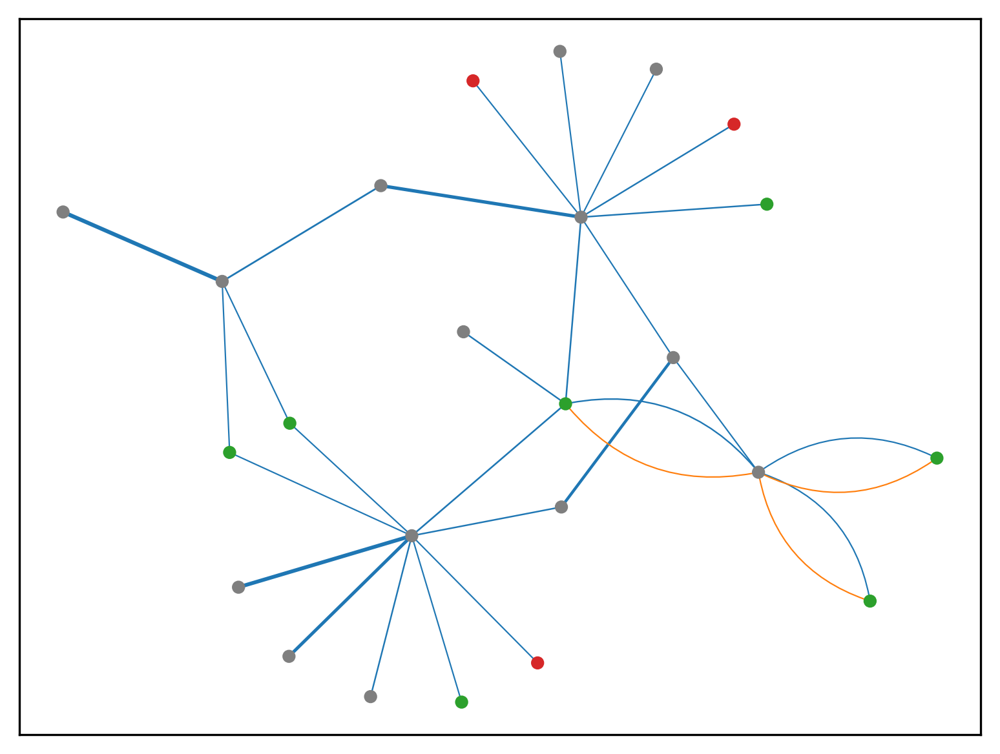

In [3]:
# base no lables for pres
out_graph = rh.plot_hRIN_network(inter_class='all', inter_types=['HBOND', 'PIPISTACK', 'IONIC', 'SSBOND', 'PIHBOND'], trim=(16,20))

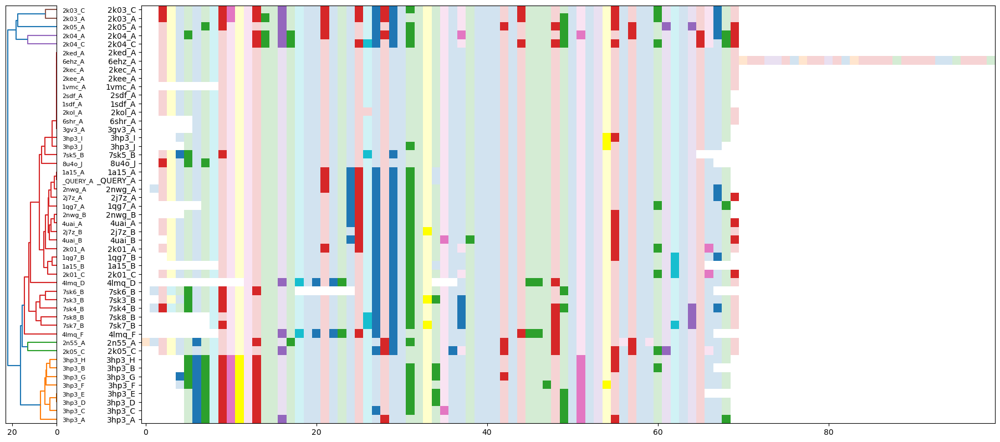

([37,
  36,
  38,
  41,
  39,
  4,
  3,
  5,
  6,
  17,
  27,
  28,
  33,
  45,
  46,
  15,
  16,
  26,
  25,
  2,
  0,
  32,
  18,
  30,
  31,
  22,
  19,
  20,
  34,
  29,
  1,
  35,
  48,
  43,
  21,
  44,
  24,
  23,
  47,
  42,
  40,
  14,
  8,
  13,
  12,
  11,
  10,
  9,
  7],
 ['2k03_C',
  '2k03_A',
  '2k05_A',
  '2k04_A',
  '2k04_C',
  '2ked_A',
  '6ehz_A',
  '2kec_A',
  '2kee_A',
  '1vmc_A',
  '2sdf_A',
  '1sdf_A',
  '2kol_A',
  '6shr_A',
  '3gv3_A',
  '3hp3_I',
  '3hp3_J',
  '7sk5_B',
  '8u4o_J',
  '1a15_A',
  '_QUERY_A',
  '2nwg_A',
  '2j7z_A',
  '1qg7_A',
  '2nwg_B',
  '4uai_A',
  '2j7z_B',
  '4uai_B',
  '2k01_A',
  '1qg7_B',
  '1a15_B',
  '2k01_C',
  '4lmq_D',
  '7sk6_B',
  '7sk3_B',
  '7sk4_B',
  '7sk8_B',
  '7sk7_B',
  '4lmq_F',
  '2n55_A',
  '2k05_C',
  '3hp3_H',
  '3hp3_B',
  '3hp3_G',
  '3hp3_F',
  '3hp3_E',
  '3hp3_D',
  '3hp3_C',
  '3hp3_A'])

In [12]:
rh.plot_contact_conservation(contact_type='HBOND', inter_class='inter', method='graph')

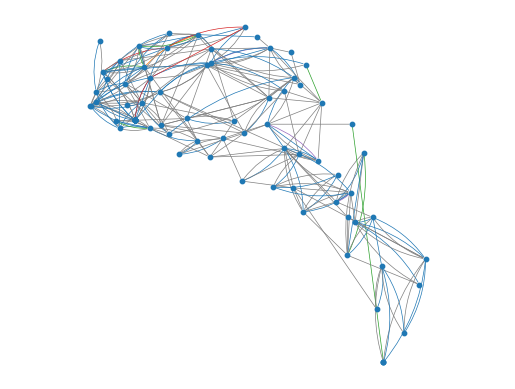

In [6]:
rh.plot_contact_net(arced = True, prob_weight=0, min_weight=0.5)

# DDX analysis
Some Utilities for downloading files required for analyzing the family of DDX human paralogs

In [14]:
rows = []
base_pth = 'DDX_human_pdb'
for dir_pth, dir, files in os.walk(base_pth):
    #print(files)
    for f_name in files:
        #f_pth = os.path.join(dir_pth, f_name)
        acc, ext, *rest = os.path.splitext(f_name)
        #print(ext)
        if ext != '.pdb':
            continue
        cif_dest = dir_pth+'/'+acc+'.cif'
        cif_url = f'https://files.rcsb.org/download/{acc}.cif'
        
        if not os.path.exists(cif_dest):
            print(f'Downloading {cif_dest}')
            response = requests.get(cif_url)
            with open(cif_dest, 'wb') as cif_f:
                cif_f.write(response.content)
        else:
            print(f'Found {cif_dest}')
        rows.append({
            'acc': acc,
            'pth': cif_dest
            })

## DDX search for examples with na binding in PDB

In [28]:
has_dead = []
has_na = []
with open('blast_db/pdb_seqres', 'r') as pdb_f:
    while True:
        id = pdb_f.readline().strip()
        seq = pdb_f.readline().strip()
        if not id or not seq:
            break
        if 'mol:protein' not in id:
            tokens = id.split(' ')
            acc_chn = tokens[0][1:]
            acc = acc_chn.split('_')[0]
            #mol_type = tokens[4]
            desc = ' '.join(tokens[3:])
            has_na.append({'acc': acc, 'desc': desc})
        if 'DEAD' in seq:
            tokens = id.split(' ')
            acc_chn = tokens[0][1:]
            acc = acc_chn.split('_')[0]
            has_dead.append({'acc_chn': acc_chn, 'acc':acc, 'seq':seq, 'len': len(seq), 'id':id})

# Plotting Dev

In [11]:
rh.plot_dist_matrix(contact_types=['IONIC', 'PIPISTACK'], method='graph_weighted')

(array([[ 0.        ,  1.87905939,  3.32220364,  4.18772457,  4.60876781,
          4.54606057, 30.01563379, 30.01563379, 25.36754513, 31.414493  ,
         31.414493  , 31.414493  , 30.91615503, 30.91615503, 29.5630734 ,
         29.65480412, 29.71677001, 29.71677001],
        [ 1.87905939,  0.        ,  2.53859104,  4.47834295,  4.84385827,
          4.84576944, 31.06862178, 31.06862178, 26.52473805, 32.56380252,
         32.56380252, 32.56380252, 32.06792559, 32.06792559, 30.70890811,
         30.80363936, 30.86969828, 30.86969828],
        [ 3.32220364,  2.53859104,  0.        ,  3.84659542,  3.8658045 ,
          3.9721251 , 31.8344483 , 31.8344483 , 27.2080462 , 33.27596916,
         33.27596916, 33.27596916, 32.7742936 , 32.7742936 , 31.41832445,
         31.5070049 , 31.56768155, 31.56768155],
        [ 4.18772457,  4.47834295,  3.84659542,  0.        ,  0.81649658,
          1.00921678, 29.63450191, 29.63450191, 24.51555314, 30.64250256,
         30.64250256, 30.64250256, 30.1

In [3]:
acc_msa_row_dict = {seq_rec.id: index for index, seq_rec in enumerate(self.msa)}
seq_ids = {rec.id for rec in self.msa}
n_seqs = len(acc_msa_row_dict)
dist_matrix_weighted = np.zeros((n_seqs, n_seqs), dtype=float)
dist_matrix = np.zeros_like(dist_matrix_weighted)

for u,v, data in rh.MultiGraph.edges(data=True):
    print(u,v,data)
    obs = set(data['observations'])
    prob = data['prob']
    diff = seq_ids.difference(obs)
    for x in obs:
        x_idx = acc_msa_row_dict[x]
        for y in diff:
            y_idx = acc_msa_row_dict[y]
            dist_matrix_weighted[x_idx,y_idx] += prob
            dist_matrix_weighted[y_idx,x_idx] += prob
            dist_matrix[x_idx,y_idx] += 1
            dist_matrix[y_idx,x_idx] += 1
    #break

51 171 {'inter': 'METAL_ION', 'prob': 0.1111111111111111, 'observations': ['_QUERY_A', '2v8l_A'], 'count': 2, 'color': 'tab:pink', '_crv_idx': 0, '_crv_total': 1, '_crv_offset': 0.0}
51 65 {'inter': 'VDW', 'prob': 0.2222222222222222, 'observations': ['_QUERY_A', '2v8l_A', '2v8m_D', '2v8m_C'], 'count': 4, 'color': 'tab:gray', '_crv_idx': 0, '_crv_total': 2, '_crv_offset': -0.5}
51 65 {'inter': 'HBOND', 'prob': 0.16666666666666666, 'observations': ['2v8m_D', '4bfn_A', '2v8m_C'], 'count': 3, 'color': 'tab:blue', '_crv_idx': 1, '_crv_total': 2, '_crv_offset': 0.5}
51 55 {'inter': 'VDW', 'prob': 0.05555555555555555, 'observations': ['7qfa_A'], 'count': 1, 'color': 'tab:gray', '_crv_idx': 0, '_crv_total': 2, '_crv_offset': -0.5}
51 55 {'inter': 'HBOND', 'prob': 0.3333333333333333, 'observations': ['7qfa_C', '7qfa_B', '7qfa_A', '7qf7_A', '7qm2_D', '7qm2_B'], 'count': 6, 'color': 'tab:blue', '_crv_idx': 1, '_crv_total': 2, '_crv_offset': 0.5}
51 54 {'inter': 'VDW', 'prob': 0.05555555555555555,

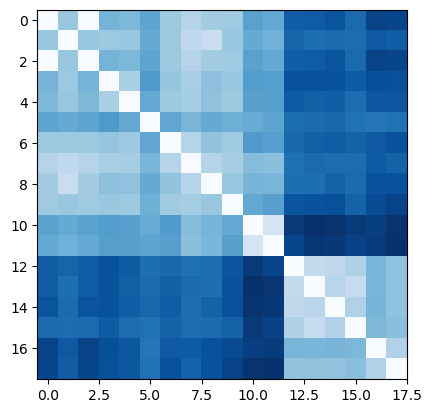

In [6]:
plt.imshow(dist_matrix_weighted, cmap='Blues')

In [5]:
rh.MultiGraph.edges(data=True)

MultiEdgeDataView([(51, 171, {'inter': 'METAL_ION', 'prob': 2.0, 'observations': ['_QUERY_A', '2v8l_A'], 'count': 2, 'color': 'tab:pink', '_crv_idx': 0, '_crv_total': 1, '_crv_offset': 0.0}), (51, 65, {'inter': 'VDW', 'prob': 4.0, 'observations': ['_QUERY_A', '2v8l_A', '2v8m_D', '2v8m_C'], 'count': 4, 'color': 'tab:gray', '_crv_idx': 0, '_crv_total': 2, '_crv_offset': -0.5}), (51, 65, {'inter': 'HBOND', 'prob': 3.0, 'observations': ['2v8m_D', '4bfn_A', '2v8m_C'], 'count': 3, 'color': 'tab:blue', '_crv_idx': 1, '_crv_total': 2, '_crv_offset': 0.5}), (51, 55, {'inter': 'VDW', 'prob': 1.0, 'observations': ['7qfa_A'], 'count': 1, 'color': 'tab:gray', '_crv_idx': 0, '_crv_total': 2, '_crv_offset': -0.5}), (51, 55, {'inter': 'HBOND', 'prob': 6.0, 'observations': ['7qfa_C', '7qfa_B', '7qfa_A', '7qf7_A', '7qm2_D', '7qm2_B'], 'count': 6, 'color': 'tab:blue', '_crv_idx': 1, '_crv_total': 2, '_crv_offset': 0.5}), (51, 54, {'inter': 'VDW', 'prob': 1.0, 'observations': ['7qfa_A'], 'count': 1, 'colo

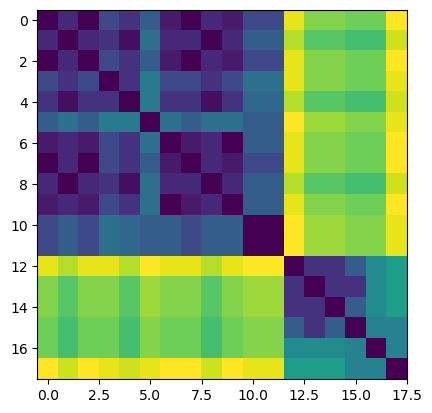

In [9]:
plt.imshow(rh.dist_matrix(contact_types=['IONIC', 'PIPISTACK'], inter_class='all'))

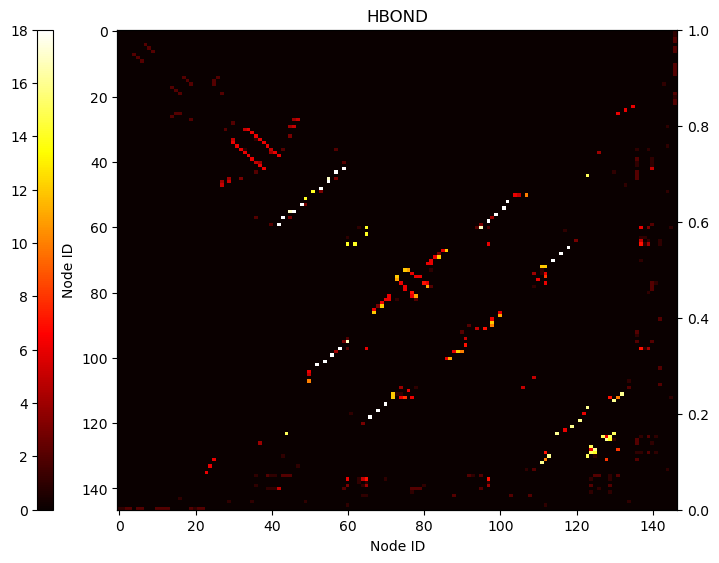

(array([[0., 0., 0., ..., 0., 0., 1.],
        [0., 0., 0., ..., 0., 0., 1.],
        [0., 0., 0., ..., 0., 0., 2.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [1., 1., 2., ..., 0., 0., 0.]]),
 {0: 0,
  1: 1,
  2: 2,
  3: 3,
  4: 4,
  5: 5,
  6: 6,
  7: 7,
  8: 8,
  9: 9,
  10: 12,
  11: 14,
  12: 16,
  13: 18,
  14: 27,
  15: 28,
  16: 29,
  17: 30,
  18: 31,
  19: 32,
  20: 33,
  21: 34,
  22: 36,
  23: 38,
  24: 40,
  25: 42,
  26: 43,
  27: 45,
  28: 46,
  29: 47,
  30: 49,
  31: 50,
  32: 51,
  33: 52,
  34: 53,
  35: 54,
  36: 55,
  37: 56,
  38: 57,
  39: 58,
  40: 59,
  41: 60,
  42: 61,
  43: 63,
  44: 64,
  45: 65,
  46: 66,
  47: 67,
  48: 68,
  49: 70,
  50: 72,
  51: 73,
  52: 74,
  53: 75,
  54: 76,
  55: 77,
  56: 78,
  57: 79,
  58: 80,
  59: 81,
  60: 82,
  61: 83,
  62: 84,
  63: 85,
  64: 86,
  65: 87,
  66: 88,
  67: 89,
  68: 90,
  69: 91,
  70: 92,
  71: 93,
  72: 94,
  73: 95,
  74: 96,
  75: 98,
  76: 99,
 

In [4]:
rh.plot_hRIN_prob(inter='HBOND')

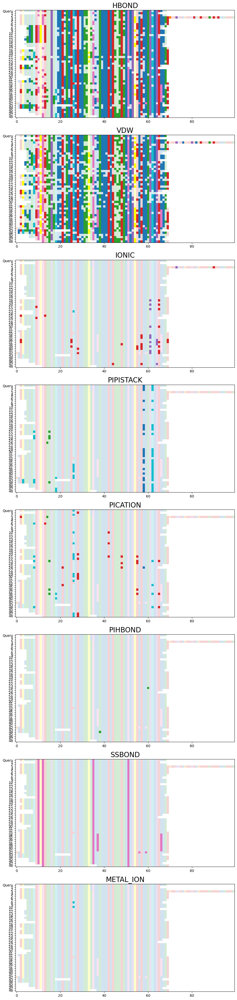

In [38]:
rh.plot_contacts()

In [49]:
all(inter_types)

True

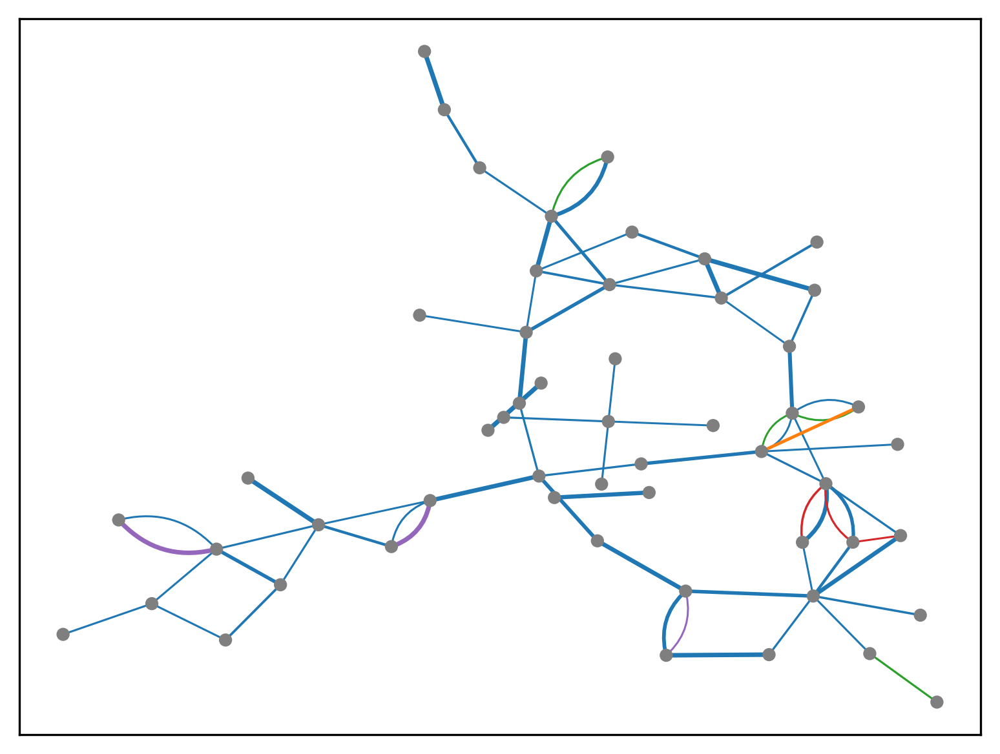

In [64]:

## Args
# crv_rad = 0.3
# out_graph = nx.MultiGraph()
# inter_types = ['HBOND', 'IONIC', 'PIPISTACK', 'SSBOND', 'PICATION']
# inter_class = 'intra'
# trim = (0, 50)
# layout =  'kamada_kawai' #'xy'#
# arc_multi_edges = True
# weight_edges = False
# spring_k = 0.5
# prob_weight = 1
# min_weight = 0.5

def plot_hRIN_network(self, inter_types='all', inter_class='all', trim=False, layout='kamada_kawai', arc_multi_edges=True, weight_edges=True, spring_k=0.2, prob_weight=1, min_weight=0.5, crv_rad = 0.3):
    """_summary_

    Args:
        inter_types (str, optional): _description_. Defaults to 'all'.
        inter_class (str, optional): _description_. Defaults to 'all'.
        trim (bool, optional): _description_. Defaults to False.
        layout (str, optional): Method used to assign node positions. Defaults to 'kamada_kawai' other options 'spring' or str of coords to use from query structure e.g. 'xy' or 'zx'.
        arc_multi_edges (bool, optional): _description_. Defaults to True.
        weight_edges (bool, optional): _description_. Defaults to True.
        spring_k (float, optional): _description_. Defaults to 0.2.
        prob_weight (int, optional): _description_. Defaults to 1.
        min_weight (float, optional): _description_. Defaults to 0.5.
        crv_rad (float, optional): Amount multiEdges will curve. Defaults to 0.3.

    """
    out_graph = nx.MultiGraph()
    node_size = 15
    #plt.figure(dpi=300) # for higher quality output

    # Ensure valid interaction types
    valid_inters = list(contact_colors.keys())
    if isinstance(inter_types, str):
        if inter_types == 'all':
            inter_types = valid_inters
        else:
            inter_types = [inter_types]
    elif not (isinstance(inter_types, list) and all(isinstance(t, str) and t in valid_inters for t in inter_types)):
        raise Exception(f"inter_types must be str or list of str. Valid interactions are {valid_inters}.")

    # Filter graph (edges and nodes) based on query parameters
    l, r, _ = trim_msa(self.msa, trim)# x_min, x_max = ()
    for u, v_dict in rh.MultiGraph.adj.items():
        for v, data in v_dict.items():
            if u > v: # adj will iterate over each edge twice, consider only one instance
                continue
            if not ((l <= u <= r) or (l <= v <= r)):
                continue
            # print(u,v)
            u_node = self.MultiGraph.nodes[u]
            v_node = self.MultiGraph.nodes[v]
            # enforce edge is of the correct intra_class
            if (inter_class == 'intra'):
                if (u_node['node_type'] != 'RES') or (v_node['node_type'] != 'RES'):
                    continue
            elif (inter_class == 'inter'):
                if not (((u_node['node_type'] == 'CHAIN') and (v_node['node_type'] == 'RES')) or ((u_node['node_type'] == 'RES') and (v_node['node_type'] == 'CHAIN'))):
                    continue
            elif (inter_class == 'LIG'):
                if not (((u_node['node_type'] == 'LIG') and (v_node['node_type'] == 'RES')) or ((u_node['node_type'] == 'RES') and (v_node['node_type'] == 'LIG'))):
                    continue
            num_selected_edges = 0
            selected_edges = []
            for edge in data.values():
                # enforce edge is of inter_type of interest
                edge_type = edge['inter']
                if edge_type not in inter_types:
                    continue
                new_edge = edge.copy()
                new_edge['crv_idx'] = num_selected_edges
                selected_edges.append(new_edge)
                num_selected_edges += 1
            for multi_id, edge in enumerate(selected_edges):
                edge['_crv_total'] = num_selected_edges
                edge['_crv_offset'] = 0.0 if num_selected_edges == 1 else (multi_id - (num_selected_edges-1)/2) / ((num_selected_edges-1)/2) * crv_rad
                out_graph.add_edge(u,v, key=multi_id, **edge)
    if layout == 'spring':
        node_pos = nx.spring_layout(out_graph, k=spring_k)
    elif layout == 'kamada_kawai':
        node_pos = nx.kamada_kawai_layout(out_graph, scale=100)
    else:
        if (len(layout) != 2) or (sum(coord in str.lower(layout) for coord in ['x', 'y', 'z']) < 2):
            raise Exception()
        coord_x, coord_y = str.lower(layout)[0], str.lower(layout)[1]
        node_pos = {}
        for nid in out_graph.nodes():
            interp_node_pos(self, nid)
            data = self.MultiGraph.nodes[nid]
            node_pos.update({nid: (data[coord_x], data[coord_y])})
            #out_graph.nodes[nid].update(self.MultiGraph.nodes[nid])
    node_colors = []
    node_type_color_map = {'RES': 'tab:gray', 'CHAIN':'tab:green', 'LIG':'tab:red'}
    for nid, data in out_graph.nodes(data=True):
        out_graph.nodes[nid].update(self.MultiGraph.nodes[nid])
        node_colors.append(node_type_color_map[data['node_type']])
    if arc_multi_edges:
        nx.draw_networkx_nodes(out_graph, node_size=node_size, pos=node_pos, node_color=node_colors)
        for u, v, data in out_graph.edges(data=True):
            rad = data['_crv_offset']
            edge_color = data['color']
            prob = data['prob']
            u_pos, v_pos = node_pos[u], node_pos[v]
            patch = patches.FancyArrowPatch(
                posA=u_pos, posB=v_pos,
                connectionstyle=f"arc3,rad={rad}",
                arrowstyle='-', color=edge_color, lw=prob_weight * prob + min_weight,
                mutation_scale=10.0, zorder=0
            )
            plt.gca().add_patch(patch)
    else:
        nx.draw(out_graph, node_size=node_size, pos=node_pos, node_color=node_colors)
    return out_graph
plot_hRIN_network(rh, inter_types = ['HBOND', 'IONIC', 'PIPISTACK', 'SSBOND', 'PICATION'], inter_class='intra', trim=(15,60), min_weight=0.7)

In [14]:
inter_col = set()
lig_col = set()
inter_df = rh.filter_contact_df(inter_type='all', inter_class='inter')
lig_df = rh.filter_contact_df(inter_type='all', inter_class='LIG')
inter_col.update(inter_df['msaCol1'])
inter_col.update(inter_df['msaCol2'])
lig_col.update(lig_df['msaCol1'])
lig_col.update(lig_df['msaCol2'])

In [3]:
inter_prob_smat_dict, MG, G_inter_dict = rh.create_hRIN(inter_class='all', normalize='weak')

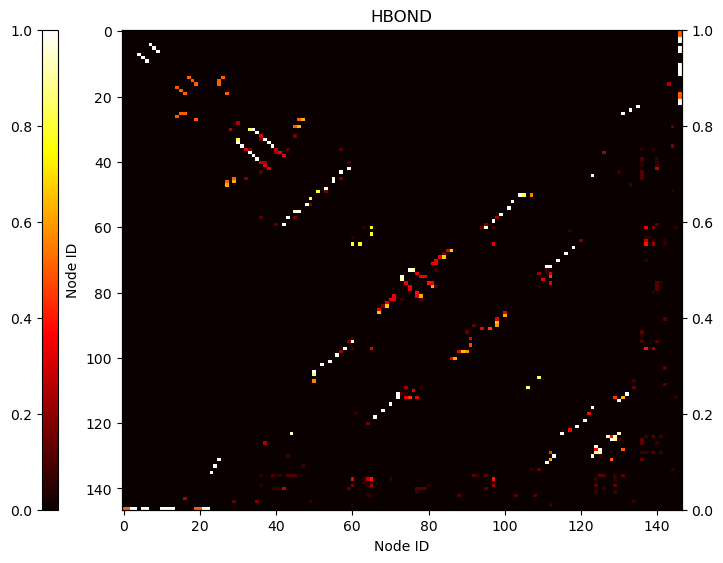

In [4]:
rh.plot_hRIN_prob(inter_prob_smat_dict, 'HBOND')

# Survey of random PHAM clans in PDB

In [35]:
import requests
url = 'https://www.ebi.ac.uk/interpro/wwwapi/set/pfam/?page_size=20&extra_fields=counters%3Aentry%2Cdescription'
found_end = False
response = requests.get(url)

In [36]:
response.json()['results'][0]

{'metadata': {'accession': 'CL0001', 'name': 'EGF', 'source_database': 'pfam'},
 'extra_fields': {'description': 'Members of this clan all belong to the EGF superfamily.  This particular superfamily is characterised as having least 6 cysteine residues. These cysteines form disulphide bonds, in the order 1-3, 2-4, 5-6, which are essential for the stability of the EGF fold. These disulphide bonds are stacked in a ladder-like arrangement. The Laminin EGF family is distinguished by having an an additional disulphide bond. The function of the domains within this family remains unclear, but they are thought to largely perform a structural role. More often than not, these domains are arranged in tandem repeats in extracellular proteins.',
  'counters': {'entries': {'pfam': 29, 'total': 29}}}}

In [47]:
rows = []
url = 'https://www.ebi.ac.uk/interpro/wwwapi/set/pfam/?page_size=100&extra_fields=counters%3Aentry%2Cdescription'
while url:
    response = requests.get(url).json()
    for result in response['results']:
        row = {}
        row.update(result['metadata'])
        #row.update(result['sets'][0])
        row.update(result['extra_fields']['counters']['entries'])
        rows.append(row)
    url = response['next']
pfam_clans_df = pd.DataFrame(rows)

In [48]:
pfam_clans_df['cumsum'] = pfam_clans_df['pfam'].cumsum()

# Function to find the index corresponding to a specific item number
def find_index_for_item_number(df, item_number):
    # Check if the item_number is within the range
    if item_number < 1 or item_number > df['cumsum'].iloc[-1]:
        raise ValueError("Item number out of range")
    # Find the index where the cumulative sum is greater than or equal to the item number
    index = df[df['cumsum'] >= item_number].index[0]
    return index

In [68]:
n = 100
# randomize across pfam enteries
choices = np.random.choice(range(0, pfam_clans_df['pfam'].sum() + 1), n, replace=False)
# randomize across pfam clans
# clan_choice_idx = np.random.choice(range(0, len(pfam_clans_df['pfam']) + 1), n, replace=False)
# pfam_clans_df.iloc[clan_choice_idx]

In [69]:
clan_idx = [find_index_for_item_number(pfam_clans_df, idx) for idx in choices]
chosen_clans_df = pfam_clans_df.iloc[clan_idx].reset_index()
chosen_clans_df['result_num'] = chosen_clans_df['cumsum'] - pd.Series(choices)
chosen_clans_df

,index,accession,name,source_database,pfam,total,cumsum,result_num
0,368,CL0425,ComplexI-N,pfam,3,3,8265,2
1,137,CL0167,Zn_Beta_Ribbon,pfam,107,107,5129,97
2,38,CL0051,NTF2,pfam,58,58,2013,18
3,6,CL0012,Histone,pfam,17,17,339,10
4,181,CL0219,RNase_H,pfam,91,91,6293,12
...,...,...,...,...,...,...,...,...
95,638,CL0750,ADAM_CR_sf,pfam,5,5,9570,3
96,71,CL0089,GlnB-like,pfam,12,12,2958,3
97,283,CL0331,EpsM,pfam,8,8,7662,0
98,392,CL0459,BRCT-like,pfam,12,12,8386,3


In [70]:
selected_pfam = []
name_pfam = []
for i, r in chosen_clans_df.iterrows():
    clan_id = r['accession']
    result_num = r['result_num']
    first_result_num = 0
    results_per_page = 100
    clan_url = f'https://www.ebi.ac.uk/interpro/api//entry/pfam/set/pfam/{clan_id}/?extra_fields=short_name&page_size={results_per_page}'
    while clan_url:
        response = requests.get(clan_url).json()
        relative_result_num = result_num - first_result_num
        if relative_result_num < results_per_page:
            result = response['results'][relative_result_num]
            clan_url = False
            name, pfam_id = result['metadata']['name'], result['metadata']['accession']
            selected_pfam.append(pfam_id)
            name_pfam.append(name)
            print(i, pfam_id, name)
        else:
            clan_url = response['next']
            first_result_num += results_per_page
chosen_clans_df['selected_pfam'] = selected_pfam
chosen_clans_df['name_pfam'] = name_pfam

0 PF10125 NADH dehydrogenase I, subunit N related protein
1 PF21344 Alpha-aminoadipate carrier protein LysW-like, globular domain
2 PF10429 Nuclear pore RNA shuttling protein Mtr2
3 PF09123 Domain of unknown function (DUF1931)
4 PF02075 Crossover junction endodeoxyribonuclease RuvC
5 PF00659 POLO box duplicated region
6 PF22067 Cep192 domain 3
7 PF19408 PKD-like domain
8 PF00961 LAGLIDADG endonuclease
9 PF14597 Metallo-beta-lactamase superfamily
10 PF01712 Deoxynucleoside kinase
11 PF18115 DNA repair protein Crb2 Tudor domain
12 PF02742 Iron dependent repressor, metal binding and dimerisation domain
13 PF22150 Type IV pilin Tt1218
14 PF03437 BtpA family
15 PF16261 Domain of unknown function (DUF4915)
16 PF03097 BRO1-like domain
17 PF09173 Initiation factor eIF2 gamma, C terminal
18 PF01571 Aminomethyltransferase folate-binding domain
19 PF05282 AAR2 C-terminal repeat region
20 PF17812 RET Cadherin like domain 3
21 PF02597 ThiS family
22 PF09468 Ydr279p protein family (RNase H2 complex 

In [71]:
chosen_clans_df.to_csv('chosen_clans.tsv', sep='\t', mode='a')

In [72]:
chosen_clans_df

,index,accession,name,source_database,pfam,total,cumsum,result_num,selected_pfam,name_pfam
0,368,CL0425,ComplexI-N,pfam,3,3,8265,2,PF10125,"NADH dehydrogenase I, subunit N related protein"
1,137,CL0167,Zn_Beta_Ribbon,pfam,107,107,5129,97,PF21344,"Alpha-aminoadipate carrier protein LysW-like, ..."
2,38,CL0051,NTF2,pfam,58,58,2013,18,PF10429,Nuclear pore RNA shuttling protein Mtr2
3,6,CL0012,Histone,pfam,17,17,339,10,PF09123,Domain of unknown function (DUF1931)
4,181,CL0219,RNase_H,pfam,91,91,6293,12,PF02075,Crossover junction endodeoxyribonuclease RuvC
...,...,...,...,...,...,...,...,...,...,...
95,638,CL0750,ADAM_CR_sf,pfam,5,5,9570,3,PF19236,ADAMTS cysteine-rich domain
96,71,CL0089,GlnB-like,pfam,12,12,2958,3,PF06153,Cyclic-di-AMP receptor
97,283,CL0331,EpsM,pfam,8,8,7662,0,PF03245,Bacteriophage Rz lysis protein
98,392,CL0459,BRCT-like,pfam,12,12,8386,3,PF16589,"BRCT domain, a BRCA1 C-terminus domain"


In [74]:
## Get representative PDB structure for each pfam ID
#chosen_structs = []
for _, r in chosen_clans_df.iterrows():
    pfam_id = r['selected_pfam']
    pfam_structures_url = f'https://www.ebi.ac.uk/interpro/api//structure/PDB/entry/pfam/{pfam_id}/?page_size=20'
    response = requests.get(pfam_structures_url)
    stat_code = response.status_code
    print(f"=== {pfam_id} ===", stat_code)
    if stat_code != 200:
        continue
    response = response.json()
    for result in response['results']:
        metadata = result['metadata']
        entry = result['entries'][0]
        print(metadata['accession'], entry['chain'], metadata['name'])
        #print(entry['sequence'])
        file_path = 'temp_query.fasta'

        # Write the sequence to a regular file
        with open(file_path, 'w') as file:
            file.write(f">query\n{entry['sequence']}")

        # Run BLAST
        blast_header = 'sseqid qstart qend sstart send evalue gaps sseq qseq'
        blast_client = NcbiblastpCommandline(query=file_path, db=rh.blast_DB, outfmt=f"6 {blast_header}", evalue=0.001, remote=False)
        stdout, stderr = blast_client()

        # Process the BLAST results
        blast_df = pd.read_csv(StringIO(stdout), sep='\t', names=blast_header.split()).sort_values('evalue').reset_index(drop=True)
        num_results = len(blast_df)
        print(num_results)
        if num_results >= 16:
            chosen_structs.append({'pfam': pfam_id, 'pdb':metadata['accession'], 'chain':entry['chain'], 'results':num_results})
            break

=== PF10125 === 204
=== PF21344 === 200
3vpb E ArgX from Sulfolobus tokodaii complexed with LysW/Glu/ADP/Mg/Zn/Sulfate
2
3wwl A Crystal structure of lysine biosynthetic amino acid carrier protein LysW from Thermus thermophilus conjugated with alpha-aminoadipate
10
3wwn B Crystal structure of LysZ from Thermus thermophilus complex with LysW
10
5ein C Crystal structure of C148A mutant of LysY from Thermus thermophilus in complex with NADP+ and LysW-gamma-aminoadipic acid
10
5eio C Crystal structure of LysY from Thermus thermophilus complexed with NADP+ and LysW-gamma-aminoadipic semialdehyde
10
5k2m E Bifunctional LysX/ArgX from Thermococcus kodakarensis with LysW-gamma-AAA
10
=== PF10429 === 200
1of5 B Crystal structure of Mex67-Mtr2
12
1q40 A Crystal structure of the C. albicans Mtr2-Mex67 M domain complex
12
1q42 A Crystal structure analysis of the Candida albicans Mtr2
12
4wwu C Structure of Mex67:Mtr2
12
8hbn B Structure of the Mex67-Mtr2-1 heterodimer
12
8hfr Bt NPC-trapped pre-60S

In [77]:
chosen_structs_df = pd.DataFrame(chosen_structs)
chosen_structs_df.to_csv('chosen_structs.tsv', sep='\t')

In [94]:
chosen_clans_df = pd.read_csv('chosen_clans1.tsv', sep='\t')
chosen_clans_df

,idx,accession,name,source_database,pfam,total,cumsum,result_num,selected_pfam,name_pfam
0,84,CL0103,Gal_mutarotase,pfam,37,37,3087,7,PF04349,"Periplasmic glucan biosynthesis protein, MdoG"
1,32,CL0044,Ferritin,pfam,29,29,1875,12,PF06175,tRNA-(MS[2]IO[6]A)-hydroxylase (MiaE)
2,100,CL0123,HTH,pfam,507,507,4041,495,PF22564,HAAS
3,224,CL0266,PH,pfam,107,107,7064,8,PF03525,Meiotic recombination protein Rec7 N-terminal ...
4,15,CL0023,P-loop_NTPase,pfam,265,265,1276,59,PF02463,RecF/RecN/SMC N terminal domain
...,...,...,...,...,...,...,...,...,...,...
195,638,CL0750,ADAM_CR_sf,pfam,5,5,9570,3,PF19236,ADAMTS cysteine-rich domain
196,71,CL0089,GlnB-like,pfam,12,12,2958,3,PF06153,Cyclic-di-AMP receptor
197,283,CL0331,EpsM,pfam,8,8,7662,0,PF03245,Bacteriophage Rz lysis protein
198,392,CL0459,BRCT-like,pfam,12,12,8386,3,PF16589,"BRCT domain, a BRCA1 C-terminus domain"


In [96]:
survey_df = chosen_clans_df.merge(chosen_structs_df, left_on='selected_pfam', right_on='pfam')

In [8]:
tst[tst['acc'] == '2v8m']['acc_chn'].unique()

array(['2v8m_A', '2v8m_B', '2v8m_D', '2v8m_C'], dtype=object)

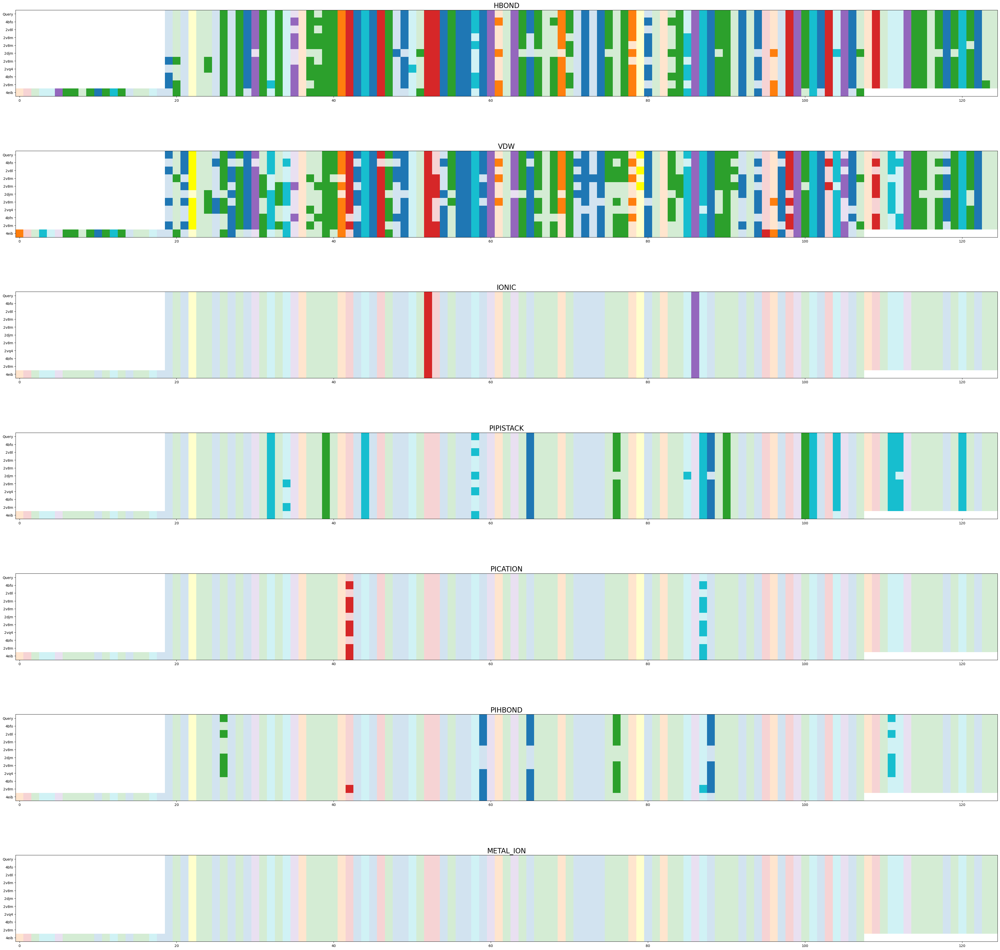

In [5]:
rh.plot_contacts('intra', display_acc=True)

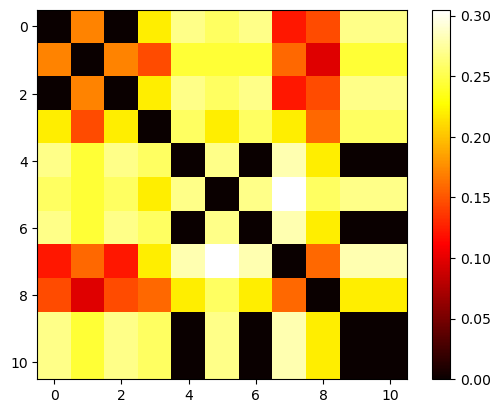

In [11]:
plt.imshow(rh.dist_matrix(['VDW', 'HBOND'], 'intra', trim_region=(40,80)), cmap='hot')
plt.colorbar()

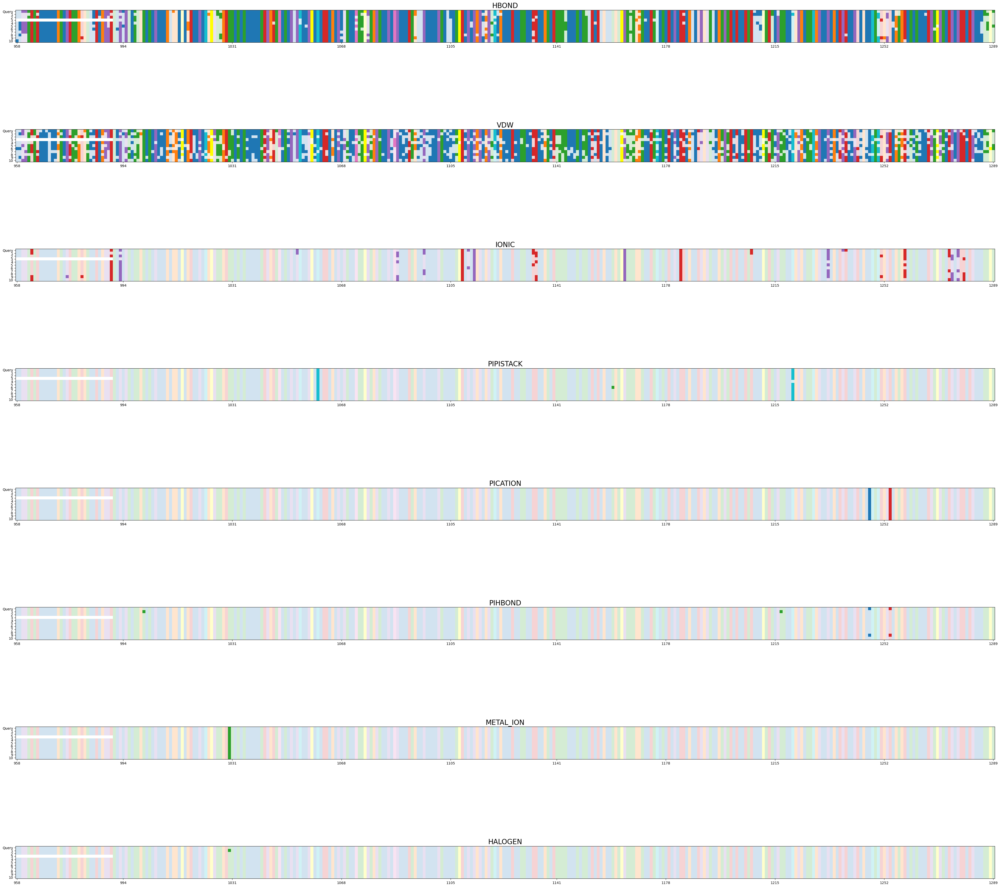

In [3]:
rh.plot_contacts('all',trim=0.5)

In [3]:
f_contacts_df = rh.filter_contact_df(inter_type='all', inter_class='all', use_entity_contact_df=True)
f_contacts_df

,index,NodeId1,Interaction,NodeId2,Distance,acc,acc_chn,chain1,chain2,struct_id1,...,pdbx_description_2,db_name_2,db_code_2,pdbx_db_accession_2,entity_id_2,src_acc_2,identifier_2,EIDN_2,u_node,v_node
0,0,A:3073:_:THR,METAL_ION:SC_LIG,A:3500:_:MG,2.123,_QUERY,_QUERY_A,A,A,3073,...,MAGNESIUM ION,NaN,NaN,NaN,NaN,_QUERY,MAGNESIUM ION,5.0,1363.0,1942.0
1,1,A:3287:_:ALA,VDW:MC_SC,A:3290:_:TRP,2.736,_QUERY,_QUERY_A,A,A,3287,...,Protein recA,UNP,RECA_ECOLI,P0A7G6,3,_QUERY,P0A7G6,4.0,1577.0,1580.0
2,2,A:2093:_:ILE,HBOND:MC_MC,A:2142:_:VAL,2.736,_QUERY,_QUERY_A,A,A,2093,...,Protein recA,UNP,RECA_ECOLI,P0A7G6,3,_QUERY,P0A7G6,4.0,1050.0,1099.0
3,3,A:4277:_:LEU,HBOND:MC_MC,A:4281:_:GLU,2.995,_QUERY,_QUERY_A,A,A,4277,...,Protein recA,UNP,RECA_ECOLI,P0A7G6,3,_QUERY,P0A7G6,4.0,1885.0,1889.0
4,4,A:3174:_:ALA,HBOND:MC_MC,A:3178:_:LEU,2.737,_QUERY,_QUERY_A,A,A,3174,...,Protein recA,UNP,RECA_ECOLI,P0A7G6,3,_QUERY,P0A7G6,4.0,1464.0,1468.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8843,9060,E:173:_:GLN,HBOND:MC_MC,E:177:_:LYS,3.288,7jy8,7jy8_E,E,E,173,...,Protein RecA,UNP,A0A376NU07_ECOLX,A0A376NU07,1,7jy8,A0A376NU07,8.0,1130.0,1134.0
8844,9061,E:246:_:VAL,VDW:MC_MC,E:256:_:LYS,3.074,7jy8,7jy8_E,E,E,246,...,Protein RecA,UNP,A0A376NU07_ECOLX,A0A376NU07,1,7jy8,A0A376NU07,8.0,1203.0,1213.0
8845,9062,E:61:_:ILE,VDW:SC_SC,E:191:_:PHE,2.404,7jy8,7jy8_E,E,E,61,...,Protein RecA,UNP,A0A376NU07_ECOLX,A0A376NU07,1,7jy8,A0A376NU07,8.0,1018.0,1148.0
8846,9063,E:94:_:ASP,VDW:SC_SC,E:97:_:HIS,2.713,7jy8,7jy8_E,E,E,94,...,Protein RecA,UNP,A0A376NU07_ECOLX,A0A376NU07,1,7jy8,A0A376NU07,8.0,1051.0,1054.0


In [5]:
f_contacts_df[f_contacts_df['v_node'].isna()]

,index,NodeId1,Interaction,NodeId2,Distance,acc,acc_chn,chain1,chain2,struct_id1,...,pdbx_description_2,db_name_2,db_code_2,pdbx_db_accession_2,entity_id_2,src_acc_2,identifier_2,EIDN_2,u_node,v_node


In [9]:
f_contacts_df = rh.filter_contact_df(inter_type='all', inter_class='all', use_entity_contact_df=True)
for i,r in f_contacts_df.iterrows():
    int(r['v_node'])

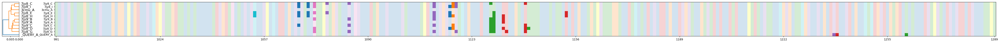

In [4]:
## 
tick_pos, tick_lab = rh.plot_contact_conservation(inter_class='inter', contact_type='HBOND', trim=1.0)

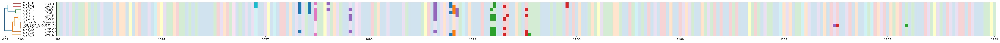

In [5]:
tick_pos, tick_lab = rh.plot_contact_conservation(inter_class='inter', contact_type='HBOND', trim=1.0, calculate_on_trimmed_region=True)

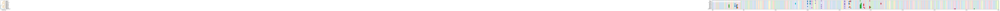

In [6]:
## 
tick_pos, tick_lab = rh.plot_contact_conservation(inter_class='inter', contact_type='HBOND', trim=0.5)

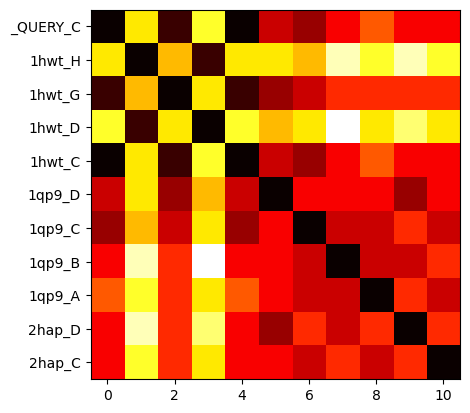

In [31]:
plt.imshow(rh.dist_matrix( 'HBOND', 'inter'),cmap='hot')
plt.yticks(tick_pos, tick_lab)
plt.show()

In [32]:
contact_prob_dict, MG, Gs_dict = rh.create_hRIN(inter_class='intra', set_attr=False)
contact_prob_dict

{'VDW': <76x76 sparse matrix of type '<class 'numpy.float64'>'
 	with 180 stored elements in Dictionary Of Keys format>,
 'HBOND': <76x76 sparse matrix of type '<class 'numpy.float64'>'
 	with 138 stored elements in Dictionary Of Keys format>,
 'IONIC': <76x76 sparse matrix of type '<class 'numpy.float64'>'
 	with 6 stored elements in Dictionary Of Keys format>,
 'PICATION': <76x76 sparse matrix of type '<class 'numpy.float64'>'
 	with 4 stored elements in Dictionary Of Keys format>}

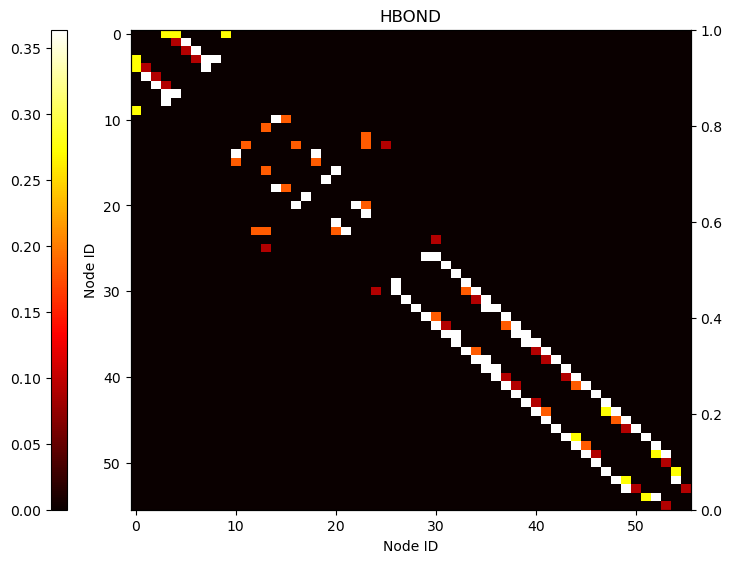

In [34]:
rh.plot_hRIN_prob(contact_prob_dict, inter='HBOND')

In [2]:
def download_file(url, dest_dir):
    # Make sure the destination directory exists
    if not os.path.exists(dest_dir):
        os.makedirs(dest_dir)

    # Extract the filename from the URL
    filename = os.path.basename(url)

    # Create the full path to the destination file
    dest_path = os.path.join(dest_dir, filename)

    # Download the file
    response = requests.get(url)
    response.raise_for_status()  # Ensure the request was successful

    # Write the content to the file
    with open(dest_path, 'wb') as file:
        file.write(response.content)
    
    print(f"File downloaded to {dest_path}")
    return dest_path

In [5]:
### testing 
# 42, 5 passed
# 22, 10 passed
# 16, 50 filed on 44 due to _atom_site parsing looking for "ATOM" in line - resolved to look in first token
# 13 , 100, ring failed on 7y7a (massive structure)
# 11, 100 # 1ryp - divide by zero error in SVD align, 5xzc - no DSSP (fine, filtered because of no ring output)
np.random.seed(11)
num_test = 100
n_prot = 830994
samples = np.random.choice(np.arange(0, n_prot + 1), size=num_test, replace=False)
entry_num = 0
cur_prot = 1
with open(blast_DBs['PDB']) as f:
    while entry_num < n_prot:
        info_line = f.readline()
        if 'mol:protein' in info_line:
            entry_num += 1
            seq_line = f.readline()
            if entry_num in samples:
                print(f"{cur_prot} {info_line.strip()}")
                pdb_acc = info_line[1:5]
                auth_chn = info_line.split()[0].split('_')[1]
                cif_pth = download_file(f'https://files.rcsb.org/download/{pdb_acc}.cif', 'query/auto_test/')
                # Run the pipeline
                rh = HomologyRing.HomologyRing(cif_pth, blast_DBs['PDB'], struct_source='PDB', log_level=logging.DEBUG, uses_PDB_ids=True)
                rh.build(auth_chn,'1', force_download=False, force_RING=True, max_results=10, use_label_asym_id=False)
                print(rh.accs)
                cur_prot += 1
            else:
                continue
        else:
            continue

1 >1jxw_A mol:protein length:46  Crambin
File downloaded to query/auto_test/1jxw.cif
['_QUERY', '3u7t', '1jxy', '1jxx', '1jxw', '1jxu', '1jxt', '1cxr', '1cbn', '1ab1', '1crn']
2 >1m75_A mol:protein length:302  3-HYDROXYACYL-COA DEHYDROGENASE
File downloaded to query/auto_test/1m75.cif
Bad edges found: 3 instances in ['_QUERY', '2hdh']. They have been filtered, but this issue should be resolved.
['_QUERY', '1m75', '3hdh', '3hdh', '3hdh', '2hdh', '2hdh', '3had', '3had', '1f12', '1f12']
3 >1mdw_B mol:protein length:328  Calpain II, catalytic subunit
File downloaded to query/auto_test/1mdw.cif
['_QUERY', '3df0', '3bow', '1u5i', '1df0', '1mdw', '1mdw', '1kfx', '1kfu', '2nqa', '2nqa']
4 >1ryp_M mol:protein length:222  20S PROTEASOME
File downloaded to query/auto_test/1ryp.cif
Bad edges found: 1 instances in ['4x6z']. They have been filtered, but this issue should be resolved.
['_QUERY', '8t0m', '3nzx', '3nzx', '3wxr', '3wxr', '4cr2', '4cr3', '3nzw', '4cr4', '4x6z']
5 >1tz6_B mol:protein leng

KeyboardInterrupt: 

In [7]:
colors.to_hex('tab:green')

'#2ca02c'

In [ ]:
import cProfile
import pstats
from pstats import SortKey
prof = cProfile.Profile()
prof.enable()

rh = HomologyRing.HomologyRing('query/1wee.cif', blast_DBs['PDB'], struct_source='PDB', log_level=logging.DEBUG, uses_PDB_ids=True)
#rh.acc_PDB = True
rh.build('A','1', force_download=False, force_RING=True, max_results=32, use_label_asym_id=False)
self = rh

prof.disable()
stats = pstats.Stats(prof)
stats.strip_dirs()
stats.sort_stats(SortKey.TIME)
stats.print_stats(10)

In [3]:
contact_prob_dict, MG, Gs_dict = rh.create_hRIN(inter_class='inter', set_attr=False)
contact_prob_dict

{'VDW': <674x674 sparse matrix of type '<class 'numpy.float64'>'
 	with 98 stored elements in Dictionary Of Keys format>,
 'HBOND': <674x674 sparse matrix of type '<class 'numpy.float64'>'
 	with 62 stored elements in Dictionary Of Keys format>,
 'IONIC': <674x674 sparse matrix of type '<class 'numpy.float64'>'
 	with 30 stored elements in Dictionary Of Keys format>,
 'PIPISTACK': <674x674 sparse matrix of type '<class 'numpy.float64'>'
 	with 4 stored elements in Dictionary Of Keys format>}

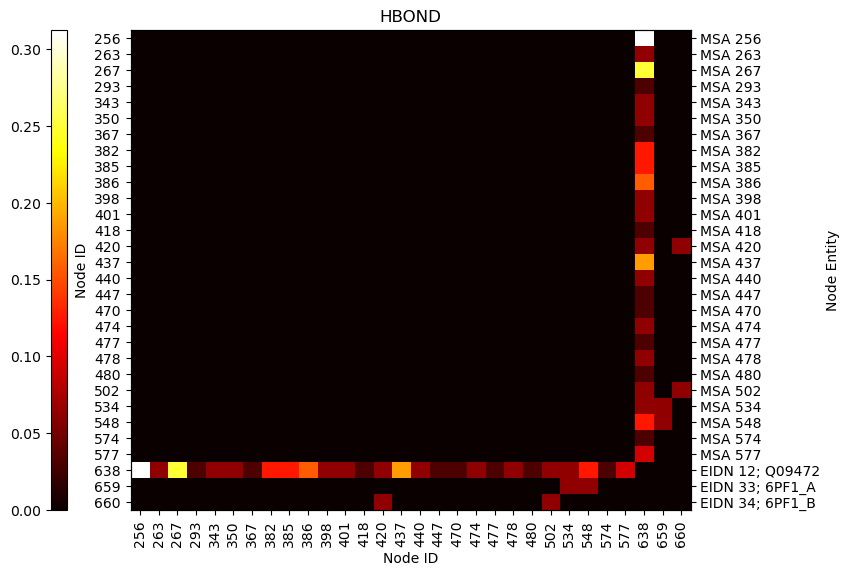

In [9]:
rh.plot_hRIN_prob(contact_prob_dict, 'HBOND')

In [1]:
import urllib.request as urlreq
from dash import Dash, html
import dash_bio as dashbio

app = Dash(__name__)

#data = urlreq.urlopen('https://git.io/alignment_viewer_p53.fasta').read().decode('utf-8')

with open('msa.fasta', 'r') as f:
    data = f.read()

AC = dashbio.AlignmentChart(
        id='alignment-viewer',
        showconsensus=False,
        showgap=False,
        showconservation=False,
        data=data
    )
app.layout = html.Div([
    AC,
])


if __name__ == '__main__':
    app.run_server(debug=True)

Ring classifies contacts made with non-standard residues on another peptide chiains to be ligands.
In general this is fine, but need to come up with a way of dealing with this because it is messing up my joins.
Can look into setting the entity id to be the same as the same as the rest of the chain, but not sure if this would help.

In [3]:
import line_profiler

# Create a line profiler instance
profiler = line_profiler.LineProfiler()

# Add the method you want to profile
profiler.add_function(rh.build_entity_contact_df)

# Run the profiling
profiler.enable_by_count()
ec = rh.build_entity_contact_df()
profiler.disable_by_count()

# Print the profiling results
profiler.print_stats()

Timer unit: 1e-09 s

Total time: 16.5743 s
File: /home/bio/source/ring-homology-pipeline/pipeline/RingHomology.py
Function: build_entity_contact_df at line 675

Line #      Hits         Time  Per Hit   % Time  Line Contents
   675                                               def build_entity_contact_df(self, return_grouped= False):
   676                                                   """Enriches the conact_df which stores edge (contact) information for all homologs with information about the entities that each node belongs to.
   677                                           
   678                                           
   679                                                   Args:
   680                                                       return_grouped (bool, optional): _description_. Defaults to False.
   681                                           
   682                                                   Returns:
   683                                                 

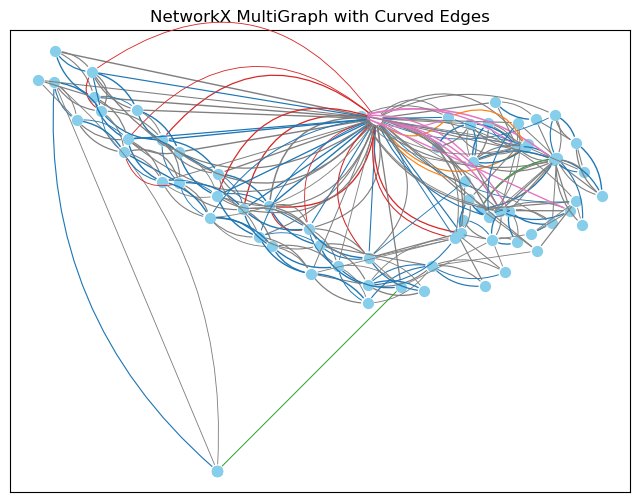

In [24]:
#pos = nx.spring_layout(MG, k=0.2, iterations=100)
fig, ax = plt.subplots(figsize=(8, 6))
for (u, v, key, data) in self.MultiGraph.edges(keys=True, data=True):
    # Extract the edge color from attributes
    edge_color = mcolors.to_rgba(data['color'])[:3]
    # Get positions of the nodes
    src = rh.node_pos[u]#(MG.nodes[u].get('x', 0.0), MG.nodes[u].get('y', 0.0)) 
    dst = rh.node_pos[v]#(MG.nodes[v].get('x', 0.0), MG.nodes[v].get('y', 0.0))

    ax.annotate("",
                xy=dst, xycoords='data',
                xytext=src, textcoords='data',
                arrowprops=dict(arrowstyle="-", color=edge_color,
                                linewidth = data['prob']**0.2,
                                shrinkA=5, shrinkB=5,
                                connectionstyle=f"arc3,rad={0.5 * data['_crv_offset']}"))

# Draw nodes
#nx.draw_networkx_labels(MG, pos, ax=ax, font_size=7)
nx.draw_networkx_nodes(MG, rh.node_pos, ax=ax, node_color='skyblue', node_size=50)



plt.title("NetworkX MultiGraph with Curved Edges")
plt.show()

In [4]:
rh.node_dict

{0: 'msa 0',
 1: 'msa 1',
 2: 'msa 2',
 3: 'msa 3',
 4: 'msa 4',
 5: 'msa 5',
 6: 'msa 6',
 7: 'msa 7',
 8: 'msa 8',
 9: 'msa 9',
 10: 'msa 10',
 11: 'msa 11',
 12: 'msa 12',
 13: 'msa 13',
 14: 'msa 14',
 15: 'msa 15',
 16: 'msa 16',
 17: 'msa 17',
 18: 'msa 18',
 19: 'msa 19',
 20: 'msa 20',
 21: 'msa 21',
 22: 'msa 22',
 23: 'msa 23',
 24: 'msa 24',
 25: 'msa 25',
 26: 'msa 26',
 27: 'msa 27',
 28: 'msa 28',
 29: 'msa 29',
 30: 'msa 30',
 31: 'msa 31',
 32: 'msa 32',
 33: 'msa 33',
 34: 'msa 34',
 35: 'msa 35',
 36: 'msa 36',
 37: 'msa 37',
 38: 'msa 38',
 39: 'msa 39',
 40: 'msa 40',
 41: 'msa 41',
 42: 'msa 42',
 43: 'msa 43',
 44: 'msa 44',
 45: 'msa 45',
 46: 'msa 46',
 47: 'msa 47',
 48: 'msa 48',
 49: 'msa 49',
 50: 'msa 50',
 51: 'msa 51',
 52: 'msa 52',
 53: 'msa 53',
 54: 'msa 54',
 55: 'msa 55',
 56: 'msa 56',
 57: 'msa 57',
 58: 'msa 58',
 59: 'msa 59',
 60: 'msa 60',
 61: 'msa 61',
 62: 'msa 62',
 63: 'msa 63',
 64: 'msa 64',
 65: 'msa 65',
 66: 'msa 66',
 67: 'msa 67',


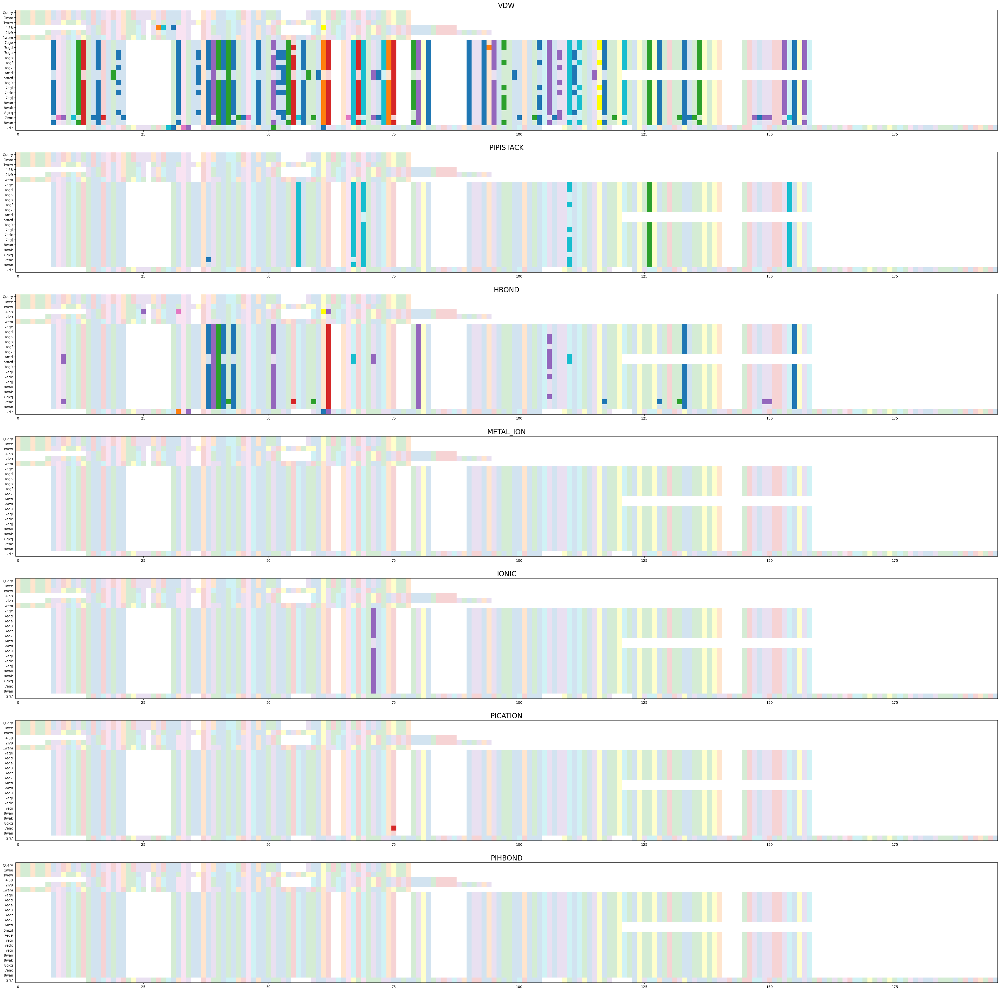

In [12]:
rh.plot_contacts(display_acc=True, inter_participants='inter')

<Axes: >

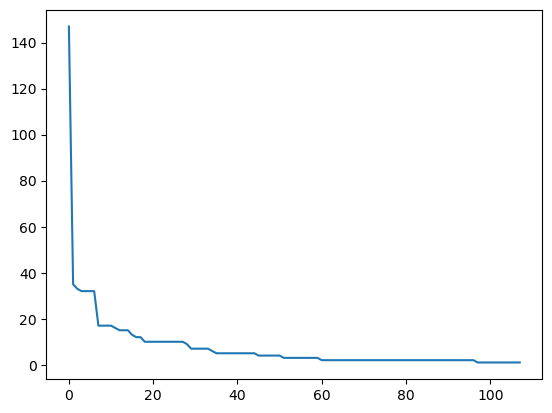

In [13]:
rh.entity_df.groupby('EIDN').size().sort_values(ascending=False).reset_index(name='count')['count'].plot()

In [18]:
edge_df = self.filter_contact_df(inter_class = 'LIG', use_entity_contact_df = True)
n_homologs = edge_df['acc'].nunique()
inters = edge_df['inter'].unique()
inters

array(['METAL_ION', 'VDW', 'HBOND'], dtype=object)

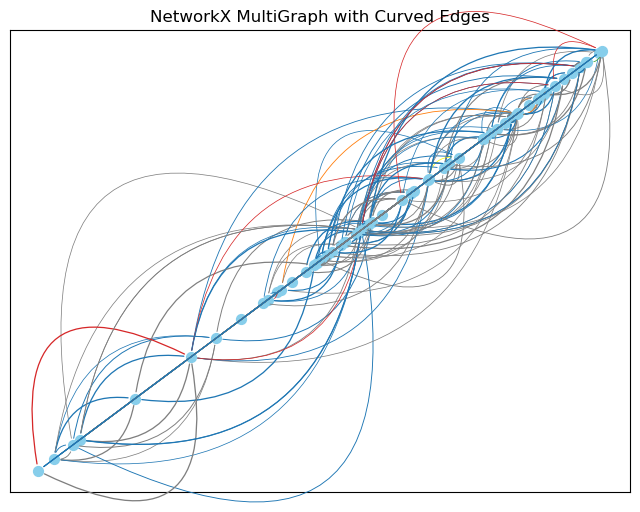

In [34]:
#pos = nx.spring_layout(MG, k=0.2, iterations=100)
fig, ax = plt.subplots(figsize=(8, 6))
for (u, v, key, data) in MG.edges(keys=True, data=True):
    # Extract the edge color from attributes
    edge_color = mcolors.to_rgba(data['color'])[:3]
    # Get positions of the nodes
    src = rh.node_pos[u]#(MG.nodes[u].get('x', 0.0), MG.nodes[u].get('y', 0.0)) 
    dst = rh.node_pos[v]#(MG.nodes[v].get('x', 0.0), MG.nodes[v].get('y', 0.0))

    ax.annotate("",
                xy=dst, xycoords='data',
                xytext=src, textcoords='data',
                arrowprops=dict(arrowstyle="-", color=edge_color,
                                linewidth = data['prob']**0.2,
                                shrinkA=5, shrinkB=5,
                                connectionstyle=f"arc3,rad={data['_crv_offset']}"))

# Draw nodes
#nx.draw_networkx_labels(MG, pos, ax=ax, font_size=7)
nx.draw_networkx_nodes(MG, rh.node_pos, ax=ax, node_color='skyblue', node_size=50)



plt.title("NetworkX MultiGraph with Curved Edges")
plt.show()

In [4]:
chain_contacts = rh.build_entity_contact_df()
chain_contacts

,NodeId1,Interaction,NodeId2,Distance,acc,acc_chn,chain1,chain2,struct_id1,struct_id2,...,label_asym_id_2,auth_asym_id_2,id_2,type_2,src_method_2,pdbx_description_2,entity_id_2,db_name_2,pdbx_db_accession_2,src_acc_2
0,B:261:_:MET,HBOND:MC_MC,B:265:_:SER,2.880,_QUERY,_QUERY_B,B,B,261,265,...,B,B,2,polymer,man,CYCLIN A,2,UNP,P20248,_QUERY
1,B:302:_:LEU,VDW:MC_SC,B:305:_:ASP,2.875,_QUERY,_QUERY_B,B,B,302,305,...,B,B,2,polymer,man,CYCLIN A,2,UNP,P20248,_QUERY
2,B:287:_:THR,HBOND:MC_MC,B:291:_:VAL,3.051,_QUERY,_QUERY_B,B,B,287,291,...,B,B,2,polymer,man,CYCLIN A,2,UNP,P20248,_QUERY
3,B:335:_:PHE,HBOND:MC_MC,B:338:_:GLU,3.241,_QUERY,_QUERY_B,B,B,335,338,...,B,B,2,polymer,man,CYCLIN A,2,UNP,P20248,_QUERY
4,A:154:_:VAL,VDW:MC_SC,B:317:_:GLN,2.733,_QUERY,_QUERY_B,A,B,154,317,...,B,B,2,polymer,man,CYCLIN A,2,UNP,P20248,_QUERY
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14372,B:363:_:ALA,HBOND:MC_MC,B:367:_:VAL,3.076,2cjm,2cjm_B,B,B,363,367,...,B,B,2,polymer,man,CYCLIN A2,2,UNP,P20248,2cjm
14373,B:190:_:GLU,HBOND:MC_MC,B:194:_:LYS,3.288,2cjm,2cjm_B,B,B,190,194,...,B,B,2,polymer,man,CYCLIN A2,2,UNP,P20248,2cjm
14374,B:266:_:LYS,HBOND:SC_SC,B:295:_:GLU,2.835,2cjm,2cjm_B,B,B,266,295,...,B,B,2,polymer,man,CYCLIN A2,2,UNP,P20248,2cjm
14375,B:319:_:PHE,VDW:SC_SC,B:360:_:PHE,2.917,2cjm,2cjm_B,B,B,319,360,...,B,B,2,polymer,man,CYCLIN A2,2,UNP,P20248,2cjm


In [54]:
chain_contacts = rh.build_entity_contact_df()
chain_contact_types = chain_contacts.groupby(['pdbx_db_accession_1', 'pdbx_db_accession_2', 'inter']).size().reset_index(name='count')
types_grouped = chain_contact_types.groupby(['pdbx_db_accession_1', 'pdbx_db_accession_2'])
chain_contact_types['_interEdgeNum'] = types_grouped.cumcount()
chain_contact_types = chain_contact_types.merge(types_grouped.size().reset_index(name='_numInterTypes'), 'inner', on=['pdbx_db_accession_1','pdbx_db_accession_2'])
chain_contact_types['_edgeArc'] = (chain_contact_types['_interEdgeNum'] - chain_contact_types['_numInterTypes']/2)
chain_contact_types

,pdbx_db_accession_1,pdbx_db_accession_2,inter,count,_interEdgeNum,_numInterTypes,_edgeArc
0,P20248,P20248,HBOND,6523,0,6,-3.0
1,P20248,P20248,IONIC,178,1,6,-2.0
2,P20248,P20248,PICATION,36,2,6,-1.0
3,P20248,P20248,PIHBOND,4,3,6,0.0
4,P20248,P20248,PIPISTACK,366,4,6,1.0
5,P20248,P20248,VDW,5869,5,6,2.0
6,P20248,P24941,HBOND,21,0,3,-1.5
7,P20248,P24941,IONIC,6,1,3,-0.5
8,P20248,P24941,VDW,63,2,3,0.5
9,P20248,P28749,HBOND,4,0,2,-1.0


{'P20248': Text(-0.4929392921464104, 0.07080896776294929, 'P20248'),
 'P24941': Text(-0.4940112349723469, 0.0677932121811539, 'P24941'),
 'P28749': Text(-0.6233457672045768, 0.11771301189000377, 'P28749'),
 'P46527': Text(-0.3804046353343995, 0.05298023522368681, 'P46527'),
 'Q9UJX2': Text(0.9907009296577338, -0.18750357820515234, 'Q9UJX2'),
 'Q9UJX3': Text(0.9999999999999999, -0.12179184885264117, 'Q9UJX3')}

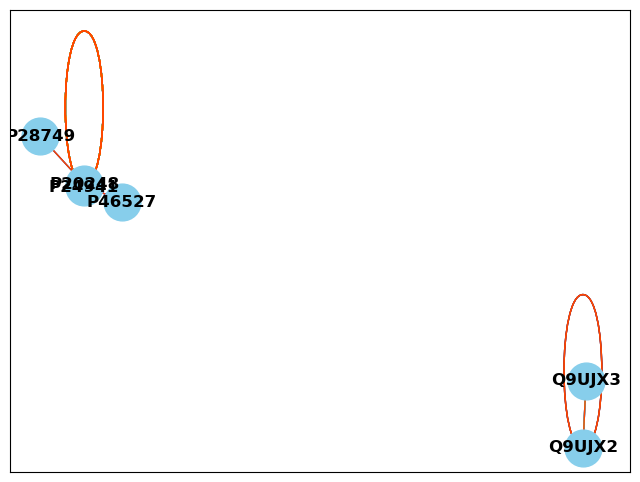

In [56]:
chain_contacts = rh.build_entity_contact_df()
chain_contact_types = chain_contacts.groupby(['pdbx_db_accession_1', 'pdbx_db_accession_2', 'inter']).size().reset_index(name='count')
types_grouped = chain_contact_types.groupby(['pdbx_db_accession_1', 'pdbx_db_accession_2'])
chain_contact_types['_interEdgeNum'] = types_grouped.cumcount()
chain_contact_types = chain_contact_types.merge(types_grouped.size().reset_index(name='_numInterTypes'), 'inner', on=['pdbx_db_accession_1','pdbx_db_accession_2'])
chain_contact_types['_edgeArc'] = (chain_contact_types['_interEdgeNum'] - chain_contact_types['_numInterTypes']/2)
chain_contact_types
G = nx.MultiGraph()
for _, row in chain_contact_types.iterrows():
    G.add_edge(row['pdbx_db_accession_1'], row['pdbx_db_accession_2'], weight=row['count'], inter=row['inter'])
plt.figure(figsize=(8, 6))
pos = nx.spring_layout(G, k=0.1)  # positions for all nodes
nx.draw_networkx_nodes(G, pos, node_size=700, node_color='skyblue')
# Draw edges with weights and colors
edges = G.edges(data=True)
for edge in edges:
    u, v, attributes = edge
    weight = attributes['weight']
    nx.draw_networkx_edges(G, pos, edgelist=[(u, v)], width=1, edge_color=contact_colors[attributes['inter']])
nx.draw_networkx_labels(G, pos, font_size=12, font_color='black', font_weight='bold')

In [50]:
types_grouped = chain_contact_types.groupby(['pdbx_db_accession_1', 'pdbx_db_accession_2'])
chain_contact_types['_interEdgeNum'] = types_grouped.cumcount()
chain_contact_types = chain_contact_types.merge(types_grouped.size().reset_index(name='_numInterTypes'), 'inner', on=['pdbx_db_accession_1','pdbx_db_accession_2'])
chain_contact_types['_edgeArc'] = (chain_contact_types['_interEdgeNum'] - chain_contact_types['_numInterTypes']/2)
chain_contact_types

KeyError: '_numInterTypes'

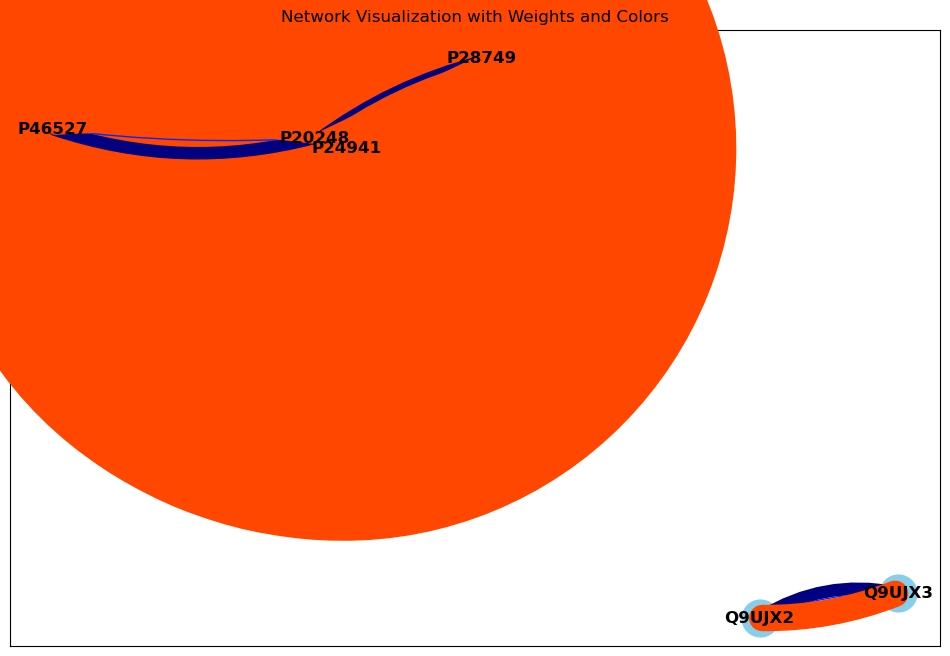

In [52]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# Group and count
chain_contact_types = chain_contacts.groupby(['pdbx_db_accession_1', 'pdbx_db_accession_2', 'inter']).size().reset_index(name='count')
types_grouped = chain_contact_types.groupby(['pdbx_db_accession_1', 'pdbx_db_accession_2'])
chain_contact_types['_interEdgeNum'] = types_grouped.cumcount()
chain_contact_types = chain_contact_types.merge(types_grouped.size().reset_index(name='_numInterTypes'), 'inner', on=['pdbx_db_accession_1','pdbx_db_accession_2'])
chain_contact_types['_edgeArc'] = (chain_contact_types['_interEdgeNum'] - chain_contact_types['_numInterTypes']/2)

# Create a MultiGraph
G = nx.MultiGraph()
for _, row in chain_contact_types.iterrows():
    G.add_edge(row['pdbx_db_accession_1'], row['pdbx_db_accession_2'], weight=row['count'], inter=row['inter'], arc=row['_edgeArc'])

# Define a color map for inter values
unique_inters = chain_contact_types['inter'].unique()
contact_colors = {inter: plt.cm.jet(i / len(unique_inters)) for i, inter in enumerate(unique_inters)}

# Draw the network
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G, k=0.5)  # positions for all nodes

# Draw nodes
nx.draw_networkx_nodes(G, pos, node_size=700, node_color='skyblue')

# Draw edges with weights and colors, using arc offsets
ax = plt.gca()
for u, v, attributes in G.edges(data=True):
    color = contact_colors[attributes['inter']]
    weight = attributes['weight']
    arc = attributes['arc'] * 0.1  # Scale the arc value to adjust the curvature
    
    # Get the start and end positions of the edge
    start = pos[u]
    end = pos[v]
    
    # Offset the edge slightly using the arc value
    connection_style = f'arc3,rad={arc}'
    
    ax.annotate("",
                xy=end, xycoords='data',
                xytext=start, textcoords='data',
                arrowprops=dict(arrowstyle="-", color=color, 
                                connectionstyle=connection_style, 
                                lw=weight))

# Draw labels
nx.draw_networkx_labels(G, pos, font_size=12, font_color='black', font_weight='bold')

plt.title("Network Visualization with Weights and Colors")
plt.show()


In [24]:
types_grouped.size().reset_index(name='count')

,pdbx_db_accession_1,pdbx_db_accession_2,count
0,P20248,P20248,6
1,P20248,P24941,3
2,P20248,P28749,2
3,P20248,P46527,3
4,P24941,P20248,6
5,Q9UJX2,Q9UJX2,2
6,Q9UJX3,Q9UJX2,4


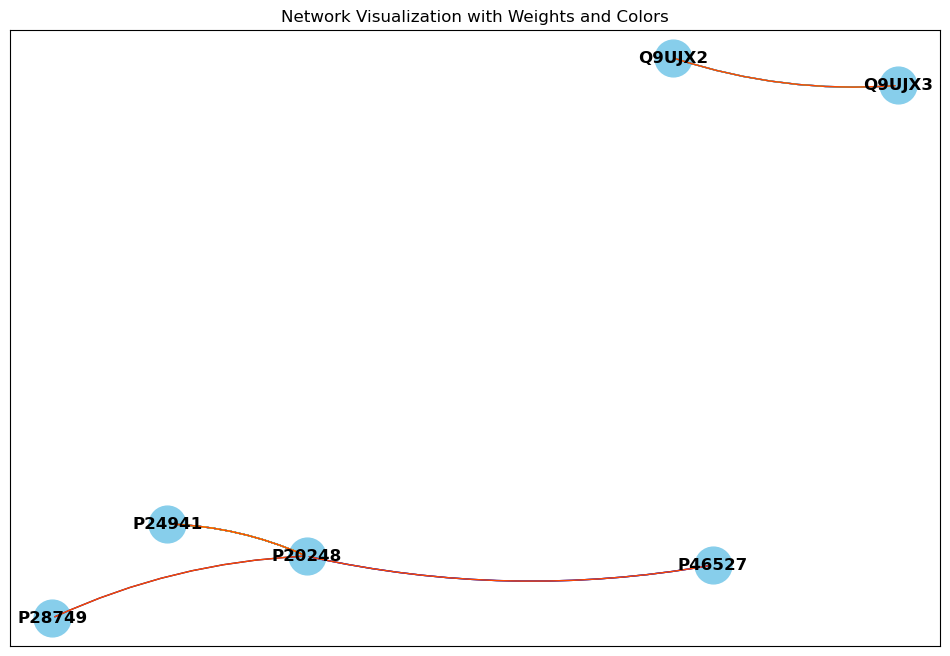

In [37]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# Assuming chain_contacts and chain_contact_types are already defined
# Example usage: chain_contacts = rh.build_entity_contact_df()
# chain_contact_types = chain_contacts.groupby(['pdbx_db_accession_1', 'pdbx_db_accession_2', 'inter']).size().reset_index(name='count')

# Create a MultiGraph
G = nx.MultiGraph()

# Add edges to the graph with count as weight and inter as color attribute
for _, row in chain_contact_types.iterrows():
    G.add_edge(row['pdbx_db_accession_1'], row['pdbx_db_accession_2'], weight=1, inter=row['inter'])

# Define a color map for inter values
unique_inters = chain_contact_types['inter'].unique()
color_map = {inter: plt.cm.jet(i / len(unique_inters)) for i, inter in enumerate(unique_inters)}

# Draw the network
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G)  # positions for all nodes

# Draw nodes
nx.draw_networkx_nodes(G, pos, node_size=700, node_color='skyblue')

# Draw edges with weights and colors, offsetting parallel edges
ax = plt.gca()
for u, v, attributes in G.edges(data=True):
    color = color_map[attributes['inter']]
    weight = attributes['weight']
    
    # Get the start and end positions of the edge
    start = pos[u]
    end = pos[v]
    
    # Offset the edge slightly
    rad = 0.1  # You can adjust this radius to change the offset
    connection_style = f'arc3,rad={rad}'
    
    ax.annotate("",
                xy=end, xycoords='data',
                xytext=start, textcoords='data',
                arrowprops=dict(arrowstyle="-", color=color, 
                                connectionstyle=connection_style, 
                                lw=weight))

# Draw labels
nx.draw_networkx_labels(G, pos, font_size=12, font_color='black', font_weight='bold')

plt.title("Network Visualization with Weights and Colors")
plt.show()


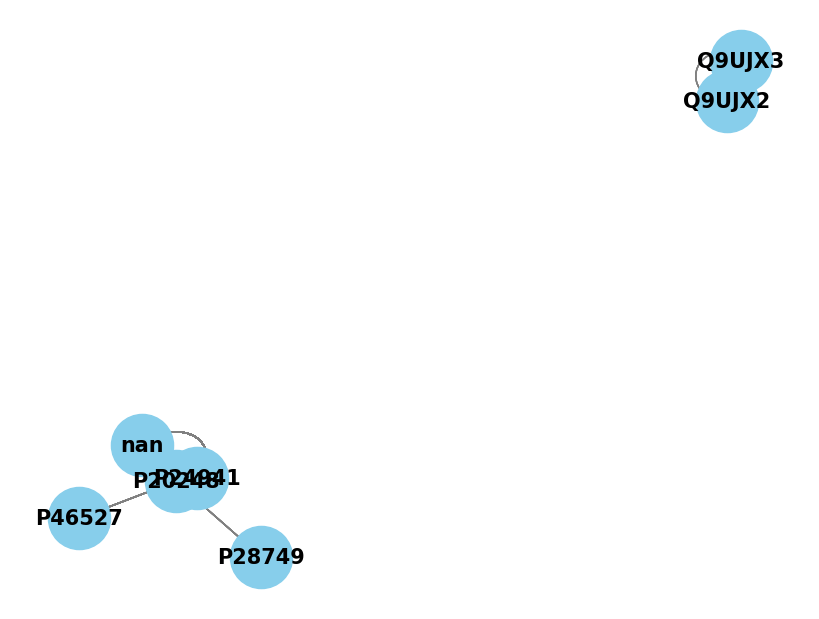

In [14]:
plt.figure(figsize=(8, 6))
pos = nx.spring_layout(G)  # positions for all nodes
nx.draw(G, pos, with_labels=True, node_color='skyblue', edge_color='gray', node_size=2000, font_size=15, font_weight='bold')

In [ ]:
cfr = CifFileReader()
rows = []
ex_debug = None
for _,r in self.file_df.iterrows():
    acc = r['acc']
    struct_pth = r['struct_pth']
    cif_obj = cfr.read(struct_pth)
    row = list(cif_obj.values())[0]['_entity_poly']
    if type(row['entity_id']) == list:
        for row_m in [dict(zip(row, t)) for t in zip(*row.values())]:
            row_m['acc'] = acc
            rows.append(row_m)
    else:
        row['acc'] = acc
        rows.append(row)
out_df = pd.DataFrame(rows)
out_df['pdbx_seq_one_letter_code'] = out_df['pdbx_seq_one_letter_code'].str.replace(r'\s+', '', regex=True)
out_df['pdbx_seq_one_letter_code_can'] = out_df['pdbx_seq_one_letter_code_can'].str.replace(r'\s+', '', regex=True)
return out_df

In [2]:
## Dir of cif files INIT
query_dir = 'pasTest'
rh = HomologyRing.HomologyRing('query/3fg8.cif', blast_DBs['PDB'], struct_source='PDB', log_level=logging.DEBUG, uses_PDB_ids=True)
rh.buildFromPDBs(state_id=1, q_acc='3fg8', q_chain='A', PDB_pths=query_dir)
#rh.acc_PDB = True

/home/bio/source/ring-homology-pipeline/pipeline/RingHomology.py:271: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  query_seq = out_df[(out_df['acc'] == self.q_acc) & (out_df['pdbx_strand_id'].str.contains(chain_re, regex=True))]


In [2]:
## List of ACCS init
pas_accs = """3fc7
3fg8
3k3c
3k3d
3kx0
3luq
3mxq
5hwt
5hwv
5hww
6ide
6kju
6ugl
7dwm
2jnw"""
pas_accs = pas_accs.splitlines()
rh = HomologyRing.HomologyRing('query/3fg8.cif', blast_DBs['PDB'], struct_source='PDB', log_level=logging.DEBUG, uses_PDB_ids=True)
rh.buildFromPDBs(state_id=1, q_acc='3fg8', q_chain='A', PDB_accs=pas_accs)
#rh.acc_PDB = True

/home/bio/source/ring-homology-pipeline/pipeline/RingHomology.py:268: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  query_seq = out_df[(out_df['acc'] == self.q_acc) & (out_df['pdbx_strand_id'].str.contains(chain_re, regex=True))]


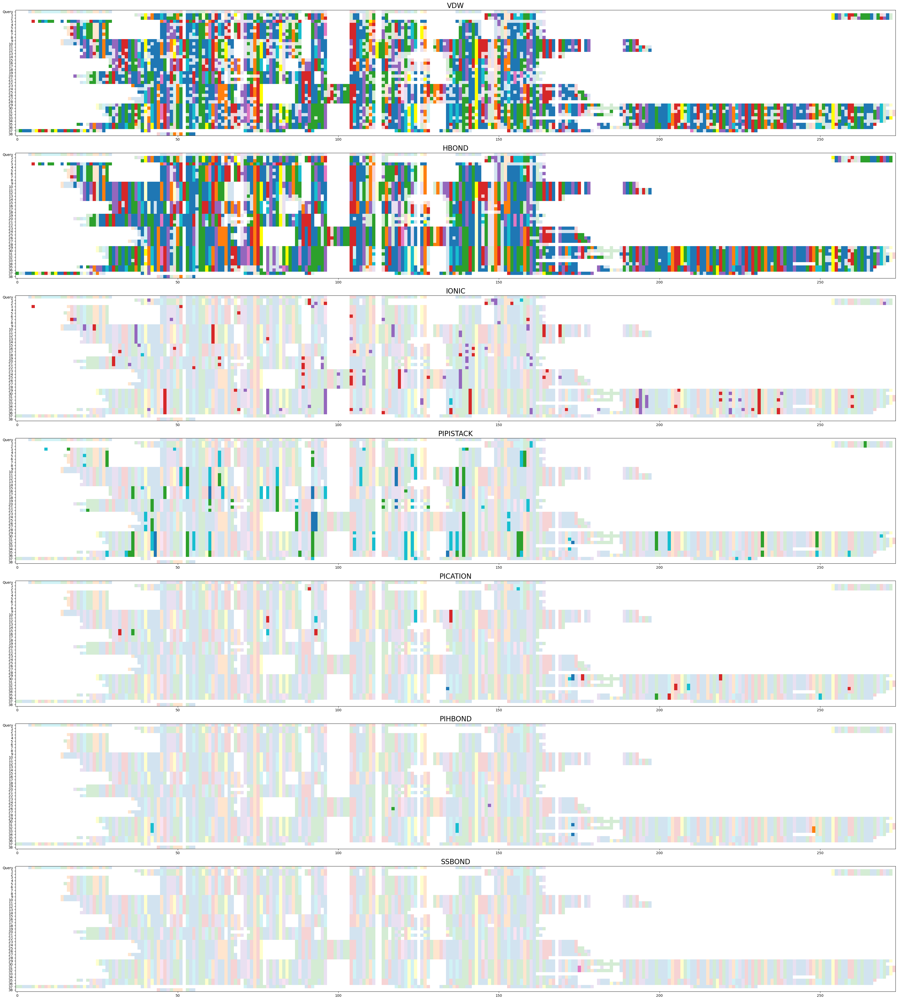

In [5]:
rh.plot_contacts()

In [10]:
from pdbecif.mmcif_io import CifFileReader
def get_all_file_chain_seq(self):
    cfr = CifFileReader()
    rows = []
    ex_debug = None
    for _,r in rh.file_df.iterrows():
        acc = r['acc']
        struct_pth = r['struct_pth']
        cif_obj = cfr.read(struct_pth)
        row = list(cif_obj.values())[0]['_entity_poly']
        if type(row['entity_id']) == list:
            for row_m in [dict(zip(row, t)) for t in zip(*row.values())]:
                row_m['acc'] = acc
                rows.append(row_m)
        else:
            row['acc'] = acc
            rows.append(row)
    out_df = pd.DataFrame(rows)
    out_df['pdbx_seq_one_letter_code'] = out_df['pdbx_seq_one_letter_code'].str.replace(r'\s+', '', regex=True)
    out_df['pdbx_seq_one_letter_code_can'] = out_df['pdbx_seq_one_letter_code_can'].str.replace(r'\s+', '', regex=True)
    return out_df
out_df = get_all_file_chain_seq(rh)
out_df

,entity_id,type,nstd_linkage,nstd_monomer,pdbx_seq_one_letter_code,pdbx_seq_one_letter_code_can,pdbx_strand_id,pdbx_target_identifier,acc
0,1,polypeptide(L),no,yes,SNALANRIENVVSQERTRKKFESLVSDSPDGIVHLTTNGTILSVNP...,SNALANRIENVVSQERTRKKFESLVSDSPDGIVHLTTNGTILSVNP...,"A,B",APC87712.1,3fc7
1,1,polypeptide(L),no,yes,(MSE)GSSHHHHHHSSGRENLYFQGGLGF(MSE)ALDEDLRIIYVN...,MGSSHHHHHHSSGRENLYFQGGLGFMALDEDLRIIYVNSGCLRHVR...,"A,B,C,D,E,F",APC7734,3fg8
2,1,polypeptide(L),no,no,GAMAAEMDWDKTVGAAEDVRRIFEHIPAILVGLEGPDHRFVAVNAA...,GAMAAEMDWDKTVGAAEDVRRIFEHIPAILVGLEGPDHRFVAVNAA...,"A,B,C,D",?,3k3c
3,1,polypeptide(L),no,yes,GAMAAE(MSE)DWDKTVGAAEDVRRIFEHIPAILVGLEGPDHRFVA...,GAMAAEMDWDKTVGAAEDVRRIFEHIPAILVGLEGPDHRFVAVNAA...,A,?,3k3d
4,1,polypeptide(L),no,yes,(MSE)GSSHHHHHHSSGLVPRGSHAS(MSE)AAE(MSE)DWDKTVG...,MGSSHHHHHHSSGLVPRGSHASMAAEMDWDKTVGAAEDVRRIFEHI...,X,?,3kx0
5,1,polypeptide(L),no,yes,SDERLRLFTEHAPAALA(MSE)FDRE(MSE)RYLAVSRRWREDYGL...,SDERLRLFTEHAPAALAMFDREMRYLAVSRRWREDYGLGDGDILGM...,"A,B,C,D",APC87667.1,3luq
6,1,polypeptide(L),no,yes,(MSE)HHHHHHENLYFQSNA(MSE)AKSRLLLSELLDQLSFALCIV...,MHHHHHHENLYFQSNAMAKSRLLLSELLDQLSFALCIVRNDYVIVK...,"A,B,C,D",APC87472.1,3mxq
7,1,polypeptide(L),no,yes,GA(MSE)ALYEFVGLLDAHGNVLEVNQVALEGGGITLEEIRGKPFW...,GAMALYEFVGLLDAHGNVLEVNQVALEGGGITLEEIRGKPFWKARW...,"A,B",?,5hwt
8,1,polypeptide(L),no,yes,GA(MSE)ALYEFVGLLDAHGNVLEVNQVALEGGGIT(MSE)EEIRG...,GAMALYEFVGLLDAHGNVLEVNQVALEGGGITMEEIRGKPFWKARW...,"A,B",?,5hwv
9,1,polypeptide(L),no,no,GAMALYEFVGLLDAHGNVLEVNQVALEGGGITLEEIRGKPFWKARW...,GAMALYEFVGLLDAHGNVLEVNQVALEGGGITLEEIRGKPFWKARW...,"A,B",?,5hww


In [96]:
from pdbecif.mmcif_io import CifFileReader
from Bio import pairwise2
from Bio import Align
from Bio.SubsMat import MatrixInfo as matlist
from Bio.Align import substitution_matrices
from Bio.pairwise2 import format_alignment

def _get_homolog_chains(self, max_results = 32, eval = 0.001):
        # Modification of the _get_homologs method for user supplied PDBs
        # Performs 1-vs-all pairwise alignemnt of the query against all chains in the provided list of PDBs instead of BLAST search.
        self.logger.info("Processing CIFs for chains homologous to query.")
        
        # parse the provided CIF files to get the PP sequence for each chain.
        out_df = get_all_file_chain_seq(self)
        out_df = out_df[out_df['type'] == 'polypeptide(L)'] # filter just the polypeptide chains. #Lookout: don't know what the (L) means
        
        # find the query sequence in the df of chains and their sequences.
        chain_re = f'(^|,){self.q_chain}(,|$)' # Used for finding the records with the correct chain.
        query_seq = out_df[(out_df['acc'] == self.q_acc) & (out_df['pdbx_strand_id'].str.contains(chain_re, regex=True))]
        if len(query_seq) == 0:
                raise Exception("No match for file_chain {self.q_acc}_{self.q_acc}. Ensure auth_asym_id is used for chain id.")
        query_seq = query_seq.iloc[0]['pdbx_seq_one_letter_code_can']
        self.query_seq = query_seq
        
        sub_mat = matlist.blosum62
        # Pairwise align
        #aligner = Align.PairwiseAligner()
        #aligner.substitution_matrix = substitution_matrices.load("BLOSUM62")
        rows = []
        for i, r in out_df.iterrows():
                # s = subject
                s_acc = r['acc']
                s_chains = r['pdbx_strand_id'].split(',')
                s_seq = r['pdbx_seq_one_letter_code_can']
                #aligner = Align.PairwiseAligner(scoring="blastp")
                
                alignments = pairwise2.align.localxx(self.query_seq, s_seq)#, sub_mat)
                #alignments = aligner.align(self.query_seq, s_seq)
                best_aln = max(alignments, key=lambda x: x.score)
                for chain in s_chains:
                        rows.append({
                                'acc' : s_acc,
                                'pdb_chain': chain,
                                'acc_chn' : f'{s_acc}_{chain}',
                                'sstart': best_aln.start,
                                'send': best_aln.end,
                                'struct_seq' : s_seq,
                                'score': best_aln.score
                        })
        return pd.DataFrame(rows)
rows = _get_homolog_chains(rh)
rows

/tmp/ipykernel_216989/4109507365.py:19: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  query_seq = out_df[(out_df['acc'] == self.q_acc) & (out_df['pdbx_strand_id'].str.contains(chain_re, regex=True))]


,acc,pdb_chain,acc_chn,sstart,send,struct_seq,score
0,3fc7,A,3fc7_A,11,198,SNALANRIENVVSQERTRKKFESLVSDSPDGIVHLTTNGTILSVNP...,43.0
1,3fc7,B,3fc7_B,11,198,SNALANRIENVVSQERTRKKFESLVSDSPDGIVHLTTNGTILSVNP...,43.0
2,3fg8,A,3fg8_A,0,118,MGSSHHHHHHSSGRENLYFQGGLGFMALDEDLRIIYVNSGCLRHVR...,118.0
3,3fg8,B,3fg8_B,0,118,MGSSHHHHHHSSGRENLYFQGGLGFMALDEDLRIIYVNSGCLRHVR...,118.0
4,3fg8,C,3fg8_C,0,118,MGSSHHHHHHSSGRENLYFQGGLGFMALDEDLRIIYVNSGCLRHVR...,118.0
5,3fg8,D,3fg8_D,0,118,MGSSHHHHHHSSGRENLYFQGGLGFMALDEDLRIIYVNSGCLRHVR...,118.0
6,3fg8,E,3fg8_E,0,118,MGSSHHHHHHSSGRENLYFQGGLGFMALDEDLRIIYVNSGCLRHVR...,118.0
7,3fg8,F,3fg8_F,0,118,MGSSHHHHHHSSGRENLYFQGGLGFMALDEDLRIIYVNSGCLRHVR...,118.0
8,3k3c,A,3k3c_A,23,216,GAMAAEMDWDKTVGAAEDVRRIFEHIPAILVGLEGPDHRFVAVNAA...,53.0
9,3k3c,B,3k3c_B,23,216,GAMAAEMDWDKTVGAAEDVRRIFEHIPAILVGLEGPDHRFVAVNAA...,53.0


In [22]:
from collections import defaultdict
def seq_from_cif_allChain(mmcif_path, seq_id_source = 'auth', asym_id_source = 'auth', state_id = '1'):
    """
    modified version of seq_from_cif
    Returns a dictionary of seuqences where the keys are the auth_asym_ids for chains and the corresponding values is are their polypeptide sequence (if any)
    Returns AA sequcne and indexMap dictionary.
    indexMap_dict: dictionary where the keys are a seq_id from the structure file
        this can be label_seq_id or auth_seq_id depending on the setting of seq_id.
        Values are 1-indexed ids in the contiguous AA sequence
    """
    with open(mmcif_path, 'r') as file:
        content = file.readlines()
    
    found_atom_header = False
    header_idx = 0
    header_dict = {}
    chain_seq_dict = defaultdict(str)
    #seq_id_list = [] # collect the sequence of seq_ids in the structure
    prev_seq_id = None

    #idx_dict = {}
    has_unk = False # accs that have missing/unknown residue

    # testing for if pdbs will always have some sections
    has_pdbx_poly_seq_scheme = False
    has_entity_poly_seq = False

    for line in content:
        # <DEBUG>
        if line.startswith('_pdbx_poly_seq_scheme.'):
            has_pdbx_poly_seq_scheme = True
        if line.startswith('_entity_poly_seq'):
            has_entity_poly_seq = True
        #<\DEBUG>
        if line.startswith('_atom_site.'):
            found_atom_header = True
            col_name = line.split('.')[1]
            header_dict[str.strip(col_name)] = header_idx
            header_idx += 1
        elif found_atom_header:
            if ('ATOM' in line):
                line_list = line.split()
                line_dict = dict(zip(header_dict.keys(), line.split()))
                # in the case that the CIF has multiple states, discard all information but the desired state.
                if line_dict['pdbx_PDB_model_num'] != state_id:
                    continue
                current_chain =  line_dict[f'{asym_id_source}_asym_id']

                seq_id = int(line_dict[f'{seq_id_source}_seq_id'])
                if seq_id != prev_seq_id:
                    res = line_dict[f'{seq_id_source}_comp_id']
                    if res =='UNK': # code for unknown residue
                        chain_seq_dict[current_chain] += 'X'
                        has_unk = True
                    elif res in ['DA', 'DT', 'DC' 'DG', 'DU']:
                        1# exit conditional and continue
                    elif res not in standard_AA_three:
                        raise Exception(f"Unknown redidue code in {mmcif_path} auth chain {line_dict['auth_asym_id']} at auth_seq_id {line_dict['auth_seq_id']}: {res}")
                    else:
                        chain_seq_dict[current_chain] += three_to_one(line_dict[f'{seq_id_source}_comp_id'])
                        #seq_id_list.append(seq_id)
                prev_seq_id = seq_id
            if 'loop_' in line:
                break # in the next section, done parcing ATOM info
        else:
            continue
    print(f"{acc} pdbx_poly_seq_scheme: {has_pdbx_poly_seq_scheme}")
    print(f"{acc} pdbx_poly_seq: {has_entity_poly_seq}")
    return chain_seq_dict, has_unk #idx_dict,

In [ ]:
from collections import defaultdict
def seq_from_cif_allChain(mmcif_path, seq_id_source = 'auth', asym_id_source = 'auth', state_id = '1'):
    """
    modified version of seq_from_cif
    Returns a dictionary of seuqences where the keys are the auth_asym_ids for chains and the corresponding values is are their polypeptide sequence (if any)
    Returns AA sequcne and indexMap dictionary.
    indexMap_dict: dictionary where the keys are a seq_id from the structure file
        this can be label_seq_id or auth_seq_id depending on the setting of seq_id.
        Values are 1-indexed ids in the contiguous AA sequence
    """
    with open(mmcif_path, 'r') as file:
        content = file.readlines()
    
    found_atom_header = False
    header_idx = 0
    header_dict = {}
    chain_seq_dict = defaultdict(str)
    #seq_id_list = [] # collect the sequence of seq_ids in the structure
    prev_seq_id = None

    #idx_dict = {}
    has_unk = False # accs that have missing/unknown residue

    # testing for if pdbs will always have some sections
    has_pdbx_poly_seq_scheme = False
    has_entity_poly_seq = False

    for line in content:
        if line.startswith('_entity_poly_seq.'):
            found_poly_seq_header = True
            col_name = line.split('.')[1]
            header_dict[str.strip(col_name)] = header_idx
            header_idx += 1
        elif found_poly_seq_header:
            #if ('ATOM' in line): # this wont be the case
            line_list = line.split()
            line_dict = dict(zip(header_dict.keys(), line.split()))
            # in the case that the CIF has multiple states, discard all information but the desired state.
            # if line_dict['pdbx_PDB_model_num'] != state_id:
            #     continue
            # You wont be given information about the 
            current_chain =  line_dict[f'{asym_id_source}_asym_id']

            seq_id = int(line_dict[f'{seq_id_source}_seq_id'])
            if seq_id != prev_seq_id:
                res = line_dict[f'{seq_id_source}_comp_id']
                if res =='UNK': # code for unknown residue
                    chain_seq_dict[current_chain] += 'X'
                    has_unk = True
                elif res in ['DA', 'DT', 'DC' 'DG', 'DU']:
                    1# exit conditional and continue
                elif res not in standard_AA_three:
                    raise Exception(f"Unknown redidue code in {mmcif_path} auth chain {line_dict['auth_asym_id']} at auth_seq_id {line_dict['auth_seq_id']}: {res}")
                else:
                    chain_seq_dict[current_chain] += three_to_one(line_dict[f'{seq_id_source}_comp_id'])
                    #seq_id_list.append(seq_id)
            prev_seq_id = seq_id
            if 'loop_' in line:
                break # in the next section, done parcing ATOM info
        else:
            continue
    print(f"{acc} pdbx_poly_seq_scheme: {has_pdbx_poly_seq_scheme}")
    print(f"{acc} pdbx_poly_seq: {has_entity_poly_seq}")
    return chain_seq_dict, has_unk #idx_dict,

In [72]:
def get_mmCIF_loop(mmcif_path, section_name):
    """
    A very general utility method that will parse a mmCIF file to return a pandas Dataframe containing the content of a single loop_ section
    """
    with open(mmcif_path, 'r') as file:
        content = file.readlines()
    
    found_header = False
    rows = []
    col_names = []
    for line in content:
        if line.startswith(section_name + '.'):
            found_header = True
            col_name = line.split('.')[1].strip()
            col_names.append(col_name)
            #header_dict[str.strip(col_name)] = header_idx
            #header_idx += 1
        elif found_header: # you found the header but are no longer in it (loop body)
            if line.startswith('#') or line.startswith('loop_'): # you have gone out of the section body and started a different section
                break
            else: # section body of interest
                line_list = line.split()
                #line_dict = dict(zip(header_dict.keys(), line.split()))
                rows.append(line_list)
    return pd.DataFrame(rows, columns=col_names)

def get_mmCIF_dict(mmcif_path, section_name):
    """
    A very general utility method that will parse a mmCIF file to return a dict containing the content of a single non-loop section
    """
    out = {}
    with open(mmcif_path, 'r') as file:
        content = file.readlines()
    
    found_section = False
    in_multiline_value = False
    key = None # need to keep track of previous key if it is not provided on the current line
    value = None
    for line in content:
        if line.startswith(section_name + '.'):
            found_section = True
            line_list = line.split()
            key = line_list[0].strip() # section_name.key_name
            key = key.split('.')[1] # key_name

            if len(line_list) == 2: # the value is in the following line(s)
                value = line_list[1]
                out[key] = value
            elif len(line_list) == 1:
                value = '' # will be defined in next lines
                ## need to parse information like follows:
                ## _entity_poly.pdbx_seq_one_letter_code_can   
                ## ;AIAPCMQTTHSKMTAGAYTEGPPQPLSAEEKKEIDKRSVYVGNVDYGSTAQDLEAHFSSCGSINRITILCDKFSGHPKGY
                ## AYIEFAERNSVDAAVAMDETVFRGRTIKVLPKRTNMPGISSTDR
                ## ;
        elif found_section: # you found the section but the section name is not at the beginning
            if line.startswith('#') or line.startswith('loop_'): # you have gone out of the section body and started a different section
                break
            elif line.startswith(';'): # either the beginning or end of a multi-line value
                in_multiline_value = not in_multiline_value
            if in_multiline_value:
                value += line.strip()
            else:
                out[key] = value.strip(';')
    return out

get_mmCIF_dict('cif/PDB/3k3c.cif', '_entity_poly_seq')

{'hetero': ''}

In [7]:
from pdbecif.mmcif_io import CifFileReader
cfr = CifFileReader()
rows = []
ex_debug = None
for _,r in rh.file_df.iterrows():
    acc = r['acc']
    struct_pth = r['struct_pth']
    cif_obj = cfr.read(struct_pth)
    row = list(cif_obj.values())[0]['_entity_poly']
    if type(row['entity_id']) == list:
        for row_m in [dict(zip(row, t)) for t in zip(*row.values())]:
            row_m['acc'] = acc
            rows.append(row_m)
    else:
        row['acc'] = acc
        rows.append(row)
out_df = pd.DataFrame(rows)
out_df['pdbx_seq_one_letter_code'] = out_df['pdbx_seq_one_letter_code'].str.replace(r'\s+', '', regex=True)
out_df['pdbx_seq_one_letter_code_can'] = out_df['pdbx_seq_one_letter_code_can'].str.replace(r'\s+', '', regex=True)
out_df

,entity_id,type,nstd_linkage,nstd_monomer,pdbx_seq_one_letter_code,pdbx_seq_one_letter_code_can,pdbx_strand_id,pdbx_target_identifier,acc
0,1,polypeptide(L),no,yes,SNALANRIENVVSQERTRKKFESLVSDSPDGIVHLTTNGTILSVNP...,SNALANRIENVVSQERTRKKFESLVSDSPDGIVHLTTNGTILSVNP...,"A,B",APC87712.1,3fc7
1,1,polypeptide(L),no,yes,(MSE)GSSHHHHHHSSGRENLYFQGGLGF(MSE)ALDEDLRIIYVN...,MGSSHHHHHHSSGRENLYFQGGLGFMALDEDLRIIYVNSGCLRHVR...,"A,B,C,D,E,F",APC7734,3fg8
2,1,polypeptide(L),no,no,GAMAAEMDWDKTVGAAEDVRRIFEHIPAILVGLEGPDHRFVAVNAA...,GAMAAEMDWDKTVGAAEDVRRIFEHIPAILVGLEGPDHRFVAVNAA...,"A,B,C,D",?,3k3c
3,1,polypeptide(L),no,yes,GAMAAE(MSE)DWDKTVGAAEDVRRIFEHIPAILVGLEGPDHRFVA...,GAMAAEMDWDKTVGAAEDVRRIFEHIPAILVGLEGPDHRFVAVNAA...,A,?,3k3d
4,1,polypeptide(L),no,yes,(MSE)GSSHHHHHHSSGLVPRGSHAS(MSE)AAE(MSE)DWDKTVG...,MGSSHHHHHHSSGLVPRGSHASMAAEMDWDKTVGAAEDVRRIFEHI...,X,?,3kx0
5,1,polypeptide(L),no,yes,SDERLRLFTEHAPAALA(MSE)FDRE(MSE)RYLAVSRRWREDYGL...,SDERLRLFTEHAPAALAMFDREMRYLAVSRRWREDYGLGDGDILGM...,"A,B,C,D",APC87667.1,3luq
6,1,polypeptide(L),no,yes,(MSE)HHHHHHENLYFQSNA(MSE)AKSRLLLSELLDQLSFALCIV...,MHHHHHHENLYFQSNAMAKSRLLLSELLDQLSFALCIVRNDYVIVK...,"A,B,C,D",APC87472.1,3mxq
7,1,polypeptide(L),no,yes,GA(MSE)ALYEFVGLLDAHGNVLEVNQVALEGGGITLEEIRGKPFW...,GAMALYEFVGLLDAHGNVLEVNQVALEGGGITLEEIRGKPFWKARW...,"A,B",?,5hwt
8,1,polypeptide(L),no,yes,GA(MSE)ALYEFVGLLDAHGNVLEVNQVALEGGGIT(MSE)EEIRG...,GAMALYEFVGLLDAHGNVLEVNQVALEGGGITMEEIRGKPFWKARW...,"A,B",?,5hwv
9,1,polypeptide(L),no,no,GAMALYEFVGLLDAHGNVLEVNQVALEGGGITLEEIRGKPFWKARW...,GAMALYEFVGLLDAHGNVLEVNQVALEGGGITLEEIRGKPFWKARW...,"A,B",?,5hww


In [8]:
with open('struct.fasta','w') as f:
    for _,r in out_df.iterrows():
        if 'polypeptide' in r['type']:
            f.write(f">{r['acc']}_{r['pdbx_strand_id']}\n")
            f.write(r['pdbx_seq_one_letter_code_can']+'\n')

In [86]:
def get_mmCIF_general(mmcif_path, section_name):
    """
    This is a very ugly combination of two different functions, but parses mmCIF file to get content of section and gaurentees that the output is a pd Dataframe
    """
    with open(mmcif_path, 'r') as file:
        content = file.readlines()
    
    found_section = False
    in_multiline_value = False
    cur_section_symbol = None
    used_section_symbol = None
    key = None # need to keep track of previous key if it is not provided on the current line
    value = None
    rows = []
    col_names = []
    out_dict = {}
    for line in content:
        if line.startswith('#') or line.startswith('loop_'):
            #this will indicate if we are in a loop or not.
            cur_section_symbol = line.strip()
        if cur_section_symbol == 'loop_':
            if line.startswith(section_name + '.'):
                found_section = True
                used_section_symbol = cur_section_symbol
                col_name = line.split('.')[1].strip()
                col_names.append(col_name)
                #header_dict[str.strip(col_name)] = header_idx
                #header_idx += 1
            elif found_section: # you found the header but are no longer in it (loop body)
                if line.startswith('#') or line.startswith('loop_'): # you have gone out of the section body and started a different section
                    break
                else: # section body of interest
                    line_list = line.split()
                    #line_dict = dict(zip(header_dict.keys(), line.split()))
                    rows.append(line_list)
        elif cur_section_symbol == '#':
            if line.startswith(section_name + '.'):
                found_section = True
                used_section_symbol = cur_section_symbol
                line_list = line.split()
                key = line_list[0].strip() # section_name.key_name
                key = key.split('.')[1] # key_name

                if len(line_list) == 2: # the value is in the following line(s)
                    value = line_list[1]
                    out_dict[key] = value
                elif len(line_list) == 1:
                    value = '' # will be defined in next lines
                    ## need to parse information like follows:
                    ## _entity_poly.pdbx_seq_one_letter_code_can   
                    ## ;AIAPCMQTTHSKMTAGAYTEGPPQPLSAEEKKEIDKRSVYVGNVDYGSTAQDLEAHFSSCGSINRITILCDKFSGHPKGY
                    ## AYIEFAERNSVDAAVAMDETVFRGRTIKVLPKRTNMPGISSTDR
                    ## ;
            elif found_section: # you found the section but the section name is not at the beginning
                if line.startswith('#') or line.startswith('loop_'): # you have gone out of the section body and started a different section
                    break
                elif line.startswith(';'): # either the beginning or end of a multi-line value
                    in_multiline_value = not in_multiline_value
                if in_multiline_value:
                    value += line.strip()
                else:
                    out_dict[key] = value.strip(';')
    if used_section_symbol == 'loop_':
        try:
            out = pd.DataFrame(rows, columns=col_names)
        except:
            print(rows)
            raise Exception()
        return out
    elif used_section_symbol == '#':
        return pd.DataFrame([out_dict])
    else:
        raise Exception("Did not find content in CIF")
        return

In [ ]:
def get_mmCIF_loop(mmcif_path, section_name):
    """
    A very general utility method that will parse a mmCIF file to return a pandas Dataframe containing the content of a single loop_ section
    """
    with open(mmcif_path, 'r') as file:
        content = file.readlines()
    
    found_header = False
    rows = []
    col_names = []
    partial_row = None
    for line in content:
        if line.startswith(section_name + '.'):
            found_header = True
            col_name = line.split('.')[1].strip()
            col_names.append(col_name)
            #header_dict[str.strip(col_name)] = header_idx
            #header_idx += 1
        elif found_header: # you found the header but are no longer in it (loop body)
            if line.startswith('#') or line.startswith('loop_'): # you have gone out of the section body and started a different section
                break
            else: # section body of interest
                line_list = line.split()
                in_partial_row = len(line_list) < len(col_names)
                if in_partial_row: 
                    # record is spread over multiple lines
                    # Human readable mmCIFs were a mistake.
                    

                rows.append(line_list)
    return pd.DataFrame(rows, columns=col_names)


In [84]:
get_mmCIF_general('cif/PDB/3k3c.cif', '_entity_poly')

,entity_id,type,nstd_linkage,nstd_monomer,pdbx_seq_one_letter_code,pdbx_seq_one_letter_code_can,pdbx_strand_id,pdbx_target_identifier
0,1,'polypeptide(L)',no,no,GAMAAEMDWDKTVGAAEDVRRIFEHIPAILVGLEGPDHRFVAVNAA...,GAMAAEMDWDKTVGAAEDVRRIFEHIPAILVGLEGPDHRFVAVNAA...,"A,B,C,D",?


In [91]:
get_mmCIF_loop('cif/PDB/6ide.cif', '_entity_poly')

ValueError: 8 columns passed, passed data had 7 columns

In [90]:

get_mmCIF_general('cif/PDB/6ide.cif', '_entity_poly')

[['1', "'polypeptide(L)'", 'no', 'no'], [';MKPNHLTLEQISLFKQLPGYWGCKDLNSVFVYANQAYGELIGLKRAEDCIGRTDFEMPSPTAACAAEFQQQDRYVIETGH'], ['SVKVLDIHPYPDGHWHAHIFTKTPWRDSQGKIQGTIFFGQDLTDTAILEVGHWVCRATGLSTSTTFKSVADRDTLKLTAR'], ['ESEVLFLLLYGKKPQHIARVMGISIKTVEGYEAKLRSKFGALSKDQLIDLALDRGFGSVIPKTLLRKQLSVVLSDHTIPK'], ['KVDVVAQLLEHHHHHH'], [';'], [';MKPNHLTLEQISLFKQLPGYWGCKDLNSVFVYANQAYGELIGLKRAEDCIGRTDFEMPSPTAACAAEFQQQDRYVIETGH'], ['SVKVLDIHPYPDGHWHAHIFTKTPWRDSQGKIQGTIFFGQDLTDTAILEVGHWVCRATGLSTSTTFKSVADRDTLKLTAR'], ['ESEVLFLLLYGKKPQHIARVMGISIKTVEGYEAKLRSKFGALSKDQLIDLALDRGFGSVIPKTLLRKQLSVVLSDHTIPK'], ['KVDVVAQLLEHHHHHH'], [';'], ['A,B', '?'], ['2', 'polydeoxyribonucleotide', 'no', 'no', "'(DA)(DG)(DG)(DG)(DG)(DG)(DG)(DA)(DA)(DA)(DT)(DC)(DC)(DC)(DC)(DC)(DC)(DT)'", 'AGGGGGGAAATCCCCCCT', 'C'], ['?'], ['3', 'polydeoxyribonucleotide', 'no', 'no', "'(DA)(DG)(DG)(DG)(DG)(DG)(DG)(DA)(DT)(DT)(DT)(DC)(DC)(DC)(DC)(DC)(DC)(DT)'", 'AGGGGGGATTTCCCCCCT', 'D'], ['?']]


Exception: 

In [89]:
col_accs = []
col_chains = []
col_seq = []
dfs = []
for _,r in rh.file_df.iterrows():
    acc = r['acc']
    struct_pth = r['struct_pth']
    try:
        dfs.append(get_mmCIF_general(struct_pth, '_entity_poly'))
    except:
        print(acc, struct_pth)
        raise Exception()
    # seq_chain_dict, _ = seq_from_cif_allChain(struct_pth, asym_id_source='auth')
    # for chain, seq in seq_chain_dict.items():
    #     print(acc, chain, seq)

[['1', "'polypeptide(L)'", 'no', 'no'], [';MKPNHLTLEQISLFKQLPGYWGCKDLNSVFVYANQAYGELIGLKRAEDCIGRTDFEMPSPTAACAAEFQQQDRYVIETGH'], ['SVKVLDIHPYPDGHWHAHIFTKTPWRDSQGKIQGTIFFGQDLTDTAILEVGHWVCRATGLSTSTTFKSVADRDTLKLTAR'], ['ESEVLFLLLYGKKPQHIARVMGISIKTVEGYEAKLRSKFGALSKDQLIDLALDRGFGSVIPKTLLRKQLSVVLSDHTIPK'], ['KVDVVAQLLEHHHHHH'], [';'], [';MKPNHLTLEQISLFKQLPGYWGCKDLNSVFVYANQAYGELIGLKRAEDCIGRTDFEMPSPTAACAAEFQQQDRYVIETGH'], ['SVKVLDIHPYPDGHWHAHIFTKTPWRDSQGKIQGTIFFGQDLTDTAILEVGHWVCRATGLSTSTTFKSVADRDTLKLTAR'], ['ESEVLFLLLYGKKPQHIARVMGISIKTVEGYEAKLRSKFGALSKDQLIDLALDRGFGSVIPKTLLRKQLSVVLSDHTIPK'], ['KVDVVAQLLEHHHHHH'], [';'], ['A,B', '?'], ['2', 'polydeoxyribonucleotide', 'no', 'no', "'(DA)(DG)(DG)(DG)(DG)(DG)(DG)(DA)(DA)(DA)(DT)(DC)(DC)(DC)(DC)(DC)(DC)(DT)'", 'AGGGGGGAAATCCCCCCT', 'C'], ['?'], ['3', 'polydeoxyribonucleotide', 'no', 'no', "'(DA)(DG)(DG)(DG)(DG)(DG)(DG)(DA)(DT)(DT)(DT)(DC)(DC)(DC)(DC)(DC)(DC)(DT)'", 'AGGGGGGATTTCCCCCCT', 'D'], ['?']]
6ide cif/PDB/6ide.cif


Exception: 

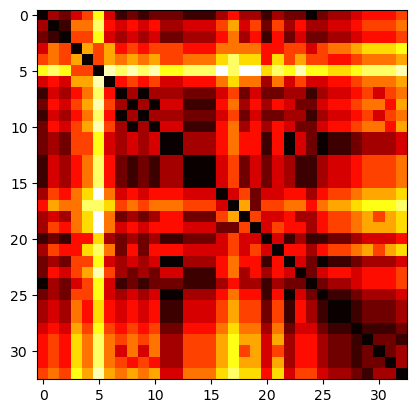

In [5]:
plt.imshow(rh.dist_matrix( 'HBOND', 'inter'),cmap='hot')

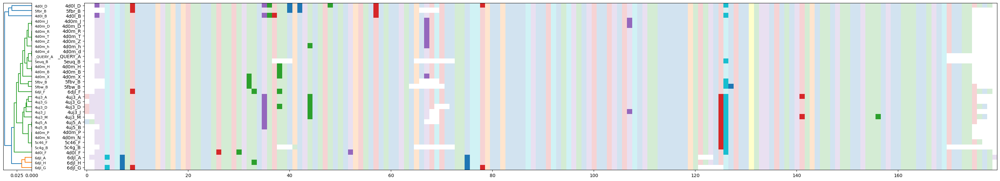

([5,
  3,
  4,
  10,
  8,
  14,
  13,
  15,
  23,
  24,
  0,
  20,
  9,
  7,
  18,
  2,
  1,
  21,
  29,
  28,
  30,
  31,
  32,
  27,
  26,
  12,
  11,
  22,
  25,
  6,
  19,
  16,
  17],
 ['4d0l_D',
  '5fbr_B',
  '4d0l_B',
  '4d0m_J',
  '4d0m_D',
  '4d0m_R',
  '4d0m_T',
  '4d0m_Z',
  '4d0m_h',
  '4d0m_d',
  '_QUERY_A',
  '5euq_B',
  '4d0m_H',
  '4d0m_B',
  '4d0m_X',
  '5fbv_B',
  '5fbw_B',
  '6djl_F',
  '4uj3_A',
  '4uj3_G',
  '4uj3_D',
  '4uj3_J',
  '4uj3_M',
  '4uj5_A',
  '4uj5_B',
  '4d0m_P',
  '4d0m_N',
  '5c46_F',
  '5c4g_B',
  '4d0l_F',
  '6djl_A',
  '6djl_H',
  '6djl_G'])

In [9]:
rh.plot_contact_conservation(inter_class='inter', contact_type='HBOND')

In [8]:
rh._get_homologs()

,index,sseqid,qstart,qend,sstart,send,evalue,gaps,sseq,qseq,overlap_length,acc,pdb_chain,acc_chn
0,0,sp|Q5ZJN2|RB11A_CHICK,1,168,6,173,7.700000e-121,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,Q5ZJN2,A,Q5ZJN2_A
1,1,sp|P62494|RB11A_RAT,1,168,6,173,9.800000e-121,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,P62494,A,P62494_A
2,2,sp|P62493|RB11A_RABIT,1,168,6,173,9.800000e-121,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,P62493,A,P62493_A
3,3,sp|Q5R9M7|RB11A_PONAB,1,168,6,173,9.800000e-121,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,Q5R9M7,A,Q5R9M7_A
4,4,sp|Q52NJ1|RB11A_PIG,1,168,6,173,9.800000e-121,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,Q52NJ1,A,Q52NJ1_A
5,5,sp|P62492|RB11A_MOUSE,1,168,6,173,9.800000e-121,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,P62492,A,P62492_A
6,6,sp|P62491|RB11A_HUMAN,1,168,6,173,9.800000e-121,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,P62491,A,P62491_A
7,7,sp|P62490|RB11A_CANLF,1,168,6,173,9.800000e-121,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,P62490,A,P62490_A
8,8,sp|Q2TA29|RB11A_BOVIN,1,168,6,173,1.110000e-119,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,Q2TA29,A,Q2TA29_A
9,9,sp|P46638|RB11B_MOUSE,1,168,6,173,3.220000e-117,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,P46638,A,P46638_A


In [5]:
def run_dssp(self,  file_suffix='.cif', out_dir='dssp_out/', force=False, timeout=4):
    status = {}
    for i,r in self.file_df.iterrows():
        struct_pth = r['struct_pth']
        if i > 1:
            continue # DEBUG
        if not force and os.path.exists(struct_pth):
            self.logger.debug(f"running ring on {struct_pth} -? {out_dir}")
            process = subprocess.Popen(['dssp', struct_pth, '--output-format=dssp'], stdout=subprocess.PIPE, stderr=subprocess.PIPE)#stdout=output_log, stderr=output_log)
            stdout, stderr = process.communicate() # wait for ring to complete before releasing thread
            return stdout

            

In [95]:
rh._get_homologs()

,index,sseqid,qstart,qend,sstart,send,evalue,gaps,sseq,qseq,overlap_length,acc,pdb_chain,acc_chn
0,0,sp|Q5ZJN2|RB11A_CHICK,1,168,6,173,7.700000e-121,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,Q5ZJN2,A,Q5ZJN2_A
1,1,sp|P62494|RB11A_RAT,1,168,6,173,9.800000e-121,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,P62494,A,P62494_A
2,2,sp|P62493|RB11A_RABIT,1,168,6,173,9.800000e-121,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,P62493,A,P62493_A
3,3,sp|Q5R9M7|RB11A_PONAB,1,168,6,173,9.800000e-121,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,Q5R9M7,A,Q5R9M7_A
4,4,sp|Q52NJ1|RB11A_PIG,1,168,6,173,9.800000e-121,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,Q52NJ1,A,Q52NJ1_A
5,5,sp|P62492|RB11A_MOUSE,1,168,6,173,9.800000e-121,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,P62492,A,P62492_A
6,6,sp|P62491|RB11A_HUMAN,1,168,6,173,9.800000e-121,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,P62491,A,P62491_A
7,7,sp|P62490|RB11A_CANLF,1,168,6,173,9.800000e-121,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,P62490,A,P62490_A
8,8,sp|Q2TA29|RB11A_BOVIN,1,168,6,173,1.110000e-119,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,Q2TA29,A,Q2TA29_A
9,9,sp|P46638|RB11B_MOUSE,1,168,6,173,3.220000e-117,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,P46638,A,P46638_A


In [93]:
rh.file_df

,acc,pdb_chain,acc_chn,struct_pth,has_unk_res,edge_pth,node_pth
0,_QUERY,A,_QUERY_A,cif/AlphaFold/query.cif,False,ring_out/AlphaFold/query.cif_ringEdges,ring_out/AlphaFold/query.cif_ringNodes
1,Q5ZJN2,A,Q5ZJN2_A,cif/AlphaFold/Q5ZJN2.cif,False,ring_out/AlphaFold/Q5ZJN2.cif_ringEdges,ring_out/AlphaFold/Q5ZJN2.cif_ringNodes
2,P62494,A,P62494_A,cif/AlphaFold/P62494.cif,False,ring_out/AlphaFold/P62494.cif_ringEdges,ring_out/AlphaFold/P62494.cif_ringNodes
3,P62493,A,P62493_A,cif/AlphaFold/P62493.cif,False,ring_out/AlphaFold/P62493.cif_ringEdges,ring_out/AlphaFold/P62493.cif_ringNodes
4,Q5R9M7,A,Q5R9M7_A,cif/AlphaFold/Q5R9M7.cif,False,ring_out/AlphaFold/Q5R9M7.cif_ringEdges,ring_out/AlphaFold/Q5R9M7.cif_ringNodes
5,Q52NJ1,A,Q52NJ1_A,cif/AlphaFold/Q52NJ1.cif,False,ring_out/AlphaFold/Q52NJ1.cif_ringEdges,ring_out/AlphaFold/Q52NJ1.cif_ringNodes
6,P62492,A,P62492_A,cif/AlphaFold/P62492.cif,False,ring_out/AlphaFold/P62492.cif_ringEdges,ring_out/AlphaFold/P62492.cif_ringNodes
7,P62491,A,P62491_A,cif/AlphaFold/P62491.cif,False,ring_out/AlphaFold/P62491.cif_ringEdges,ring_out/AlphaFold/P62491.cif_ringNodes
8,P62490,A,P62490_A,cif/AlphaFold/P62490.cif,False,ring_out/AlphaFold/P62490.cif_ringEdges,ring_out/AlphaFold/P62490.cif_ringNodes
9,Q2TA29,A,Q2TA29_A,cif/AlphaFold/Q2TA29.cif,False,ring_out/AlphaFold/Q2TA29.cif_ringEdges,ring_out/AlphaFold/Q2TA29.cif_ringNodes


In [94]:
rh.blast_df

,index,sseqid,qstart,qend,sstart,send,evalue,gaps,sseq,qseq,overlap_length,acc,pdb_chain,acc_chn,full_seq,struct_seq,qseq_x,sseq_x,sstart_x,send_x
0,0,sp|Q5ZJN2|RB11A_CHICK,1,168,6,173,7.700000e-121,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,Q5ZJN2,A,Q5ZJN2_A,MGNRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,MGNRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,----D-EYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,MGNRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,4,173
1,1,sp|P62494|RB11A_RAT,1,168,6,173,9.800000e-121,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,P62494,A,P62494_A,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,----D-EYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,4,173
2,2,sp|P62493|RB11A_RABIT,1,168,6,173,9.800000e-121,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,P62493,A,P62493_A,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,----D-EYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,4,173
3,3,sp|Q5R9M7|RB11A_PONAB,1,168,6,173,9.800000e-121,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,Q5R9M7,A,Q5R9M7_A,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,----D-EYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,4,173
4,4,sp|Q52NJ1|RB11A_PIG,1,168,6,173,9.800000e-121,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,Q52NJ1,A,Q52NJ1_A,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,----D-EYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,4,173
5,5,sp|P62492|RB11A_MOUSE,1,168,6,173,9.800000e-121,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,P62492,A,P62492_A,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,----D-EYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,4,173
6,6,sp|P62491|RB11A_HUMAN,1,168,6,173,9.800000e-121,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,P62491,A,P62491_A,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,----D-EYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,4,173
7,7,sp|P62490|RB11A_CANLF,1,168,6,173,9.800000e-121,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,P62490,A,P62490_A,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,----D-EYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,4,173
8,8,sp|Q2TA29|RB11A_BOVIN,1,168,6,173,1.110000e-119,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,Q2TA29,A,Q2TA29_A,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,----D-EYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,4,173
9,9,sp|P46638|RB11B_MOUSE,1,168,6,173,3.220000e-117,0,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATR...,167,P46638,A,P46638_A,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,----D-EYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,MGTRDDEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGV...,4,173


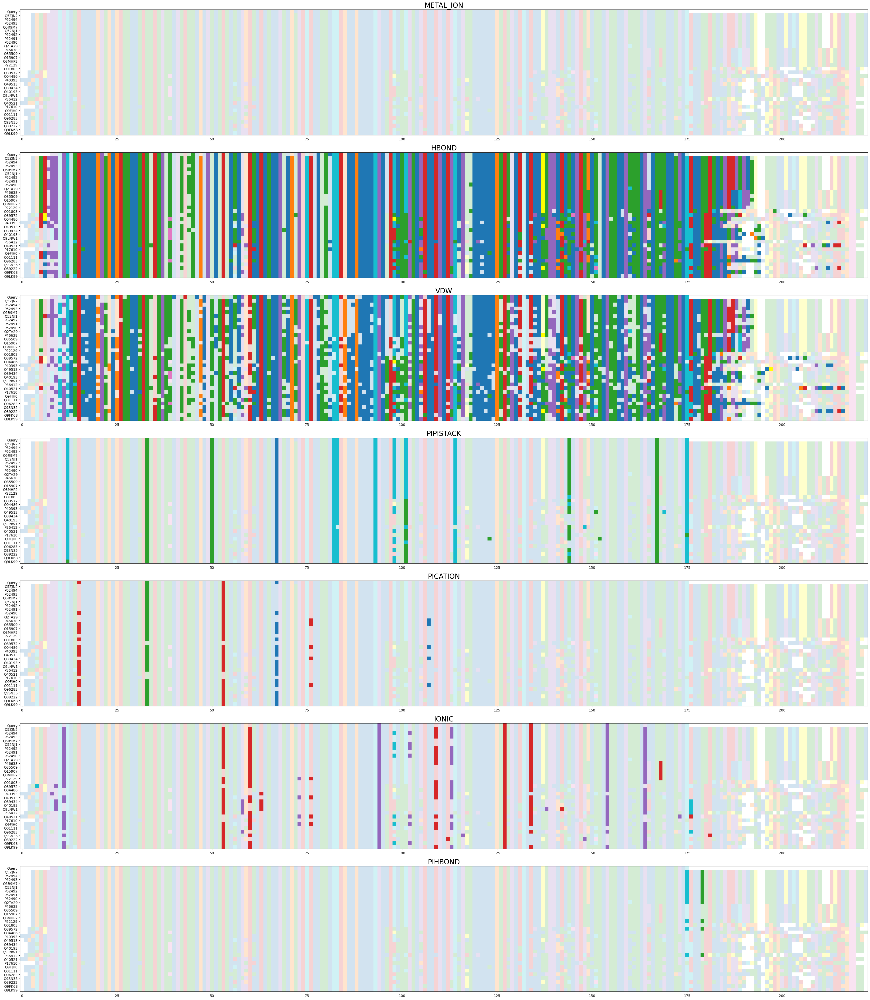

In [8]:
rh.plot_contacts(display_acc='True', inter_participants=['intra'])

Max prob for METAL_ION: 0.000
Max prob for HBOND: 1.000
Max prob for VDW: 0.970
Max prob for PIPISTACK: 1.000
Max prob for PICATION: 0.909
Max prob for IONIC: 1.000


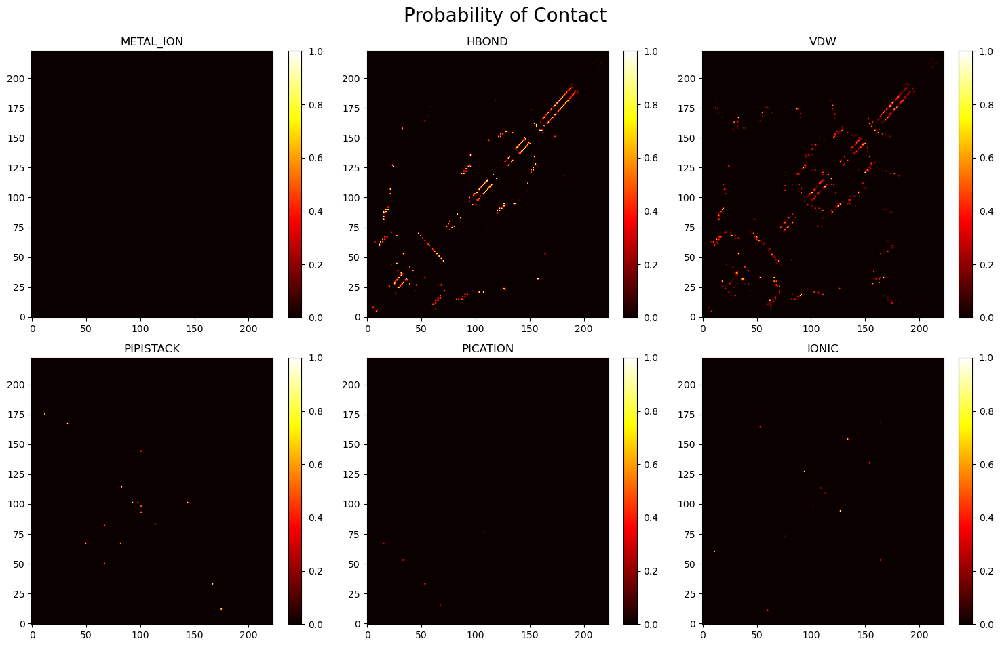

{'METAL_ION': array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]),
 'HBOND': array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]),
 'VDW': array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]),
 'PIPISTACK': array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
   

In [9]:
rh.plot_contact_prob()

In [13]:
tst_view = rh.atom_df

In [20]:
self.atom_df.iloc[120]

acc                          _QUERY
group_PDB                      ATOM
id                              121
type_symbol                       C
label_atom_id                     C
label_alt_id                      .
label_comp_id                   GLY
label_asym_id                     A
label_entity_id                   1
label_seq_id                     39
pdbx_PDB_ins_code                 ?
Cartn_x                      16.070
Cartn_y                      17.531
Cartn_z                       5.926
occupancy                      1.00
B_iso_or_equiv                15.26
pdbx_formal_charge                ?
auth_seq_id                      21
auth_comp_id                    GLY
auth_asym_id                      A
auth_atom_id                      C
pdbx_PDB_model_num                1
acc_chn                    _QUERY_A
pdbx_sifts_xref_db_acc          NaN
pdbx_sifts_xref_db_name         NaN
pdbx_sifts_xref_db_num          NaN
pdbx_sifts_xref_db_res          NaN
msa_col                     

In [24]:
rh.atom_df[rh.atom_df['label_alt_id'] != '.']

,acc,group_PDB,id,type_symbol,label_atom_id,label_alt_id,label_comp_id,label_asym_id,label_entity_id,label_seq_id,...,auth_comp_id,auth_asym_id,auth_atom_id,pdbx_PDB_model_num,acc_chn,pdbx_sifts_xref_db_acc,pdbx_sifts_xref_db_name,pdbx_sifts_xref_db_num,pdbx_sifts_xref_db_res,msa_col
450,_QUERY,ATOM,451,N,N,A,ILE,A,1,82,...,ILE,A,N,1,_QUERY_A,NaN,NaN,NaN,NaN,66
451,_QUERY,ATOM,452,N,N,B,ILE,A,1,82,...,ILE,A,N,1,_QUERY_A,NaN,NaN,NaN,NaN,66
452,_QUERY,ATOM,453,C,CA,A,ILE,A,1,82,...,ILE,A,CA,1,_QUERY_A,NaN,NaN,NaN,NaN,66
453,_QUERY,ATOM,454,C,CA,B,ILE,A,1,82,...,ILE,A,CA,1,_QUERY_A,NaN,NaN,NaN,NaN,66
454,_QUERY,ATOM,455,C,C,A,ILE,A,1,82,...,ILE,A,C,1,_QUERY_A,NaN,NaN,NaN,NaN,66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1228,_QUERY,ATOM,1229,C,CG,B,LEU,A,1,174,...,LEU,A,CG,1,_QUERY_A,NaN,NaN,NaN,NaN,158
1229,_QUERY,ATOM,1230,C,CD1,A,LEU,A,1,174,...,LEU,A,CD1,1,_QUERY_A,NaN,NaN,NaN,NaN,158
1230,_QUERY,ATOM,1231,C,CD1,B,LEU,A,1,174,...,LEU,A,CD1,1,_QUERY_A,NaN,NaN,NaN,NaN,158
1231,_QUERY,ATOM,1232,C,CD2,A,LEU,A,1,174,...,LEU,A,CD2,1,_QUERY_A,NaN,NaN,NaN,NaN,158


In [22]:
# Filter the dataframe to include only rows where 'label_atom_id' is 'CA'
ca_rows = self.atom_df[(self.atom_df['acc'] == query_acc) & (self.atom_df['label_atom_id'] == 'CA')]

# Group by 'auth_seq_id' and filter groups where the count is greater than 1
filtered_rows = ca_rows.groupby('auth_seq_id').filter(lambda x: len(x) > 1)

# Print the filtered rows
filtered_rows

,acc,group_PDB,id,type_symbol,label_atom_id,label_alt_id,label_comp_id,label_asym_id,label_entity_id,label_seq_id,...,auth_comp_id,auth_asym_id,auth_atom_id,pdbx_PDB_model_num,acc_chn,pdbx_sifts_xref_db_acc,pdbx_sifts_xref_db_name,pdbx_sifts_xref_db_num,pdbx_sifts_xref_db_res,msa_col
452,_QUERY,ATOM,453,C,CA,A,ILE,A,1,82,...,ILE,A,CA,1,_QUERY_A,NaN,NaN,NaN,NaN,66
453,_QUERY,ATOM,454,C,CA,B,ILE,A,1,82,...,ILE,A,CA,1,_QUERY_A,NaN,NaN,NaN,NaN,66
577,_QUERY,ATOM,578,C,CA,A,SER,A,1,96,...,SER,A,CA,1,_QUERY_A,NaN,NaN,NaN,NaN,80
578,_QUERY,ATOM,579,C,CA,B,SER,A,1,96,...,SER,A,CA,1,_QUERY_A,NaN,NaN,NaN,NaN,80
654,_QUERY,ATOM,655,C,CA,A,LEU,A,1,106,...,LEU,A,CA,1,_QUERY_A,NaN,NaN,NaN,NaN,90
655,_QUERY,ATOM,656,C,CA,B,LEU,A,1,106,...,LEU,A,CA,1,_QUERY_A,NaN,NaN,NaN,NaN,90
935,_QUERY,ATOM,936,C,CA,A,MET,A,1,138,...,MET,A,CA,1,_QUERY_A,NaN,NaN,NaN,NaN,122
936,_QUERY,ATOM,937,C,CA,B,MET,A,1,138,...,MET,A,CA,1,_QUERY_A,NaN,NaN,NaN,NaN,122
1219,_QUERY,ATOM,1220,C,CA,A,LEU,A,1,174,...,LEU,A,CA,1,_QUERY_A,NaN,NaN,NaN,NaN,158
1220,_QUERY,ATOM,1221,C,CA,B,LEU,A,1,174,...,LEU,A,CA,1,_QUERY_A,NaN,NaN,NaN,NaN,158


In [86]:
# Need to do:
# Build a network for ALL nodes (msa cols)
def plot_contact_net(self, use_coords='xz', arced=True, prob_weight = 1.3, min_weight = 0.3):
        use_coords = str.lower(use_coords)
        cord1_mmCIF_colname = f'Cartn_{use_coords[0]}'
        cord2_mmCIF_colname = f'Cartn_{use_coords[1]}'
        #cord_to_idx = {'x': 0, 'y': 1, 'z': 2}
        #atom_pos_contig = self.q_atom_pos[:, [cord_to_idx[use_coords[0]], cord_to_idx[use_coords[1]]]]
        q_atom_pos_contig_df = self.atom_df[(self.atom_df['acc'] == query_acc)] # filter out just the query struct from atom_df
        q_atom_pos_contig_df = q_atom_pos_contig_df[(q_atom_pos_contig_df['label_atom_id'] == 'CA')] # get just the carbon-alpha locations
        q_atom_pos_contig_df = q_atom_pos_contig_df[q_atom_pos_contig_df['label_alt_id'].isin(['.','A'])] #for some residues alternate locations are given. Take the first (or only) location.
        if q_atom_pos_contig_df['label_seq_id'].duplicated().any() or q_atom_pos_contig_df['auth_seq_id'].duplicated().any():
            raise Exception('Residue with multiple CA postions per residue')
        q_atom_pos_contig_pos = q_atom_pos_contig_df[[cord1_mmCIF_colname,cord2_mmCIF_colname]].to_numpy(dtype=float)
        q_nonGap_msaCol = list(q_atom_pos_contig_df['msa_col'])
        
        nongap_idx = 0
        atom_pos = []
        for msa_col in range(self.msa.get_alignment_length()):
            cur_res = self.msa[0,msa_col]
            if cur_res != '-':
                atom_pos.append(q_atom_pos_contig_pos[nongap_idx,:])
                #print('nongap', atom_pos[-1].shape)
                nongap_idx += 1
            else:
                atom_pos.append(np.zeros((2)))
                #print('gap', atom_pos[-1].shape)
        #print(len(atom_pos))
        #print(sum([res != '-' for res in str(self.msa[0].seq)]))
        atom_pos = np.array(atom_pos)
        atom_pos = impute_zeros(atom_pos)

        atom_pos_scaled = np.array(atom_pos).astype(float)
        lb = np.min(atom_pos_scaled, axis=0)
        ub = np.max(atom_pos_scaled, axis=0)
        atom_pos_scaled = -1 + ((atom_pos_scaled - lb) / (ub - lb)) * (2)
        pos = {i: atom_pos_scaled[i] for i in range(len(atom_pos_scaled))}

        if self.prob_df is None:
            self.build_contact_prob_df()
        if self.G is None:
            self.build_network()

        nx.draw_networkx_nodes(self.G, pos, node_size=10)

        if arced:
            # Drawing arcs for edges with curvature adjustments
            edge_curvature = {}
            for _, row in self.prob_df.iterrows():
                pair = (row['i'], row['j'])
                if pair not in edge_curvature:
                    edge_curvature[pair] = 0
                edge_curvature[pair] += 1

            for pair, count in edge_curvature.items():
                if count == 1:
                    edge_curvature[pair] = np.array([0])
                else:
                    edge_curvature[pair] = np.linspace(-0.15, 0.15, count)

            edge_index = {}
            for _, row in self.prob_df.iterrows():
                u, v = row['i'], row['j']
                ct = row['contact_type']
                color = contact_colors.get(ct, 'black')
                pair = (u, v)
                prob = row['probability']

                if pair not in edge_index:
                    edge_index[pair] = 0
                
                rad = edge_curvature[pair][edge_index[pair]]
                edge_index[pair] += 1

                start_pos = np.array(pos[u])
                end_pos = np.array(pos[v])

                patch = patches.FancyArrowPatch(posA=start_pos, posB=end_pos,
                                                connectionstyle=f"arc3,rad={rad}",
                                                arrowstyle='-', color=color, lw= prob_weight*prob + min_weight,
                                                mutation_scale=10.0, zorder=0)
                plt.gca().add_patch(patch)
        else:
            # Drawing straight edges or no edges if prob_df is not provided
            # for (u, v, data) in self.G.edges(data=True):
            #     color = contact_colors.get(data.get('interaction'), 'black')
            for _, r in self.prob_df.iterrows():
                u, v = r['i'], r['j']
                color = contact_colors.get(r['contact_type'])
                prob = r['probability']
                start_pos = np.array(pos[u])
                end_pos = np.array(pos[v])

                plt.plot([start_pos[0], end_pos[0]], [start_pos[1], end_pos[1]], color=color, lw=prob_weight*prob + min_weight)

        plt.axis('equal')
        plt.axis('off')
        plt.show()

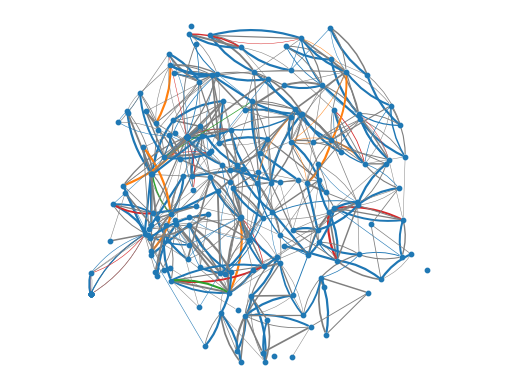

In [88]:
plot_contact_net(rh,use_coords='xy')

In [64]:
rh.prob_df[rh.prob_df['i'] == 7]

,i,j,contact_type,probability,count
414,7,63,HBOND,0.40625,13
415,7,63,VDW,0.09375,3


In [66]:
rh.build_network()

In [74]:
intrachain_summary(rh,13,63)

VDW 8
defaultdict(<class 'int'>, {'LEU-LYS': 8})


,NodeId1,Interaction,NodeId2,Distance,acc,acc_chn,chain1,chain2,struct_id1,struct_id2,inter,inter_orientation,msaCol1,msaCol2,Node1_name,Node2_name,inter_class,res1_one,res2_one
3966,A:11:_:LEU,VDW:SC_SC,A:61:_:LYS,2.385,O01803,O01803_A,A,A,11,61,VDW,SC_SC,13,63,LEU,LYS,intra,L,K
5205,A:13:_:LEU,VDW:SC_SC,A:63:_:LYS,2.416,O49513,O49513_A,A,A,13,63,VDW,SC_SC,13,63,LEU,LYS,intra,L,K
2083,A:11:_:LEU,VDW:SC_SC,A:61:_:LYS,2.414,P62491,P62491_A,A,A,11,61,VDW,SC_SC,13,63,LEU,LYS,intra,L,K
7245,A:13:_:LEU,VDW:SC_SC,A:63:_:LYS,2.420,Q01111,Q01111_A,A,A,13,63,VDW,SC_SC,13,63,LEU,LYS,intra,L,K
5295,A:12:_:LEU,VDW:SC_SC,A:62:_:LYS,2.398,Q39434,Q39434_A,A,A,12,62,VDW,SC_SC,13,63,LEU,LYS,intra,L,K
3643,A:11:_:LEU,VDW:SC_SC,A:61:_:LYS,2.418,Q3MHP2,Q3MHP2_A,A,A,11,61,VDW,SC_SC,13,63,LEU,LYS,intra,L,K
1172,A:11:_:LEU,VDW:SC_SC,A:61:_:LYS,2.413,Q5R9M7,Q5R9M7_A,A,A,11,61,VDW,SC_SC,13,63,LEU,LYS,intra,L,K
120,A:11:_:LEU,VDW:SC_SC,A:61:_:LYS,2.418,_QUERY,_QUERY_A,A,A,11,61,VDW,SC_SC,13,63,LEU,LYS,intra,L,K


In [79]:
rh.G[13]['goob'] = 1

TypeError: 'AdjacencyView' object does not support item assignment

In [76]:
rh.G[13][63]

AtlasView({0: {'acc': '_QUERY', 'interaction': 'VDW:SC_SC'}, 1: {'acc': 'Q5R9M7', 'interaction': 'VDW:SC_SC'}, 2: {'acc': 'P62491', 'interaction': 'VDW:SC_SC'}, 3: {'acc': 'Q3MHP2', 'interaction': 'VDW:SC_SC'}, 4: {'acc': 'O01803', 'interaction': 'VDW:SC_SC'}, 5: {'acc': 'O49513', 'interaction': 'VDW:SC_SC'}, 6: {'acc': 'Q39434', 'interaction': 'VDW:SC_SC'}, 7: {'acc': 'Q01111', 'interaction': 'VDW:SC_SC'}})

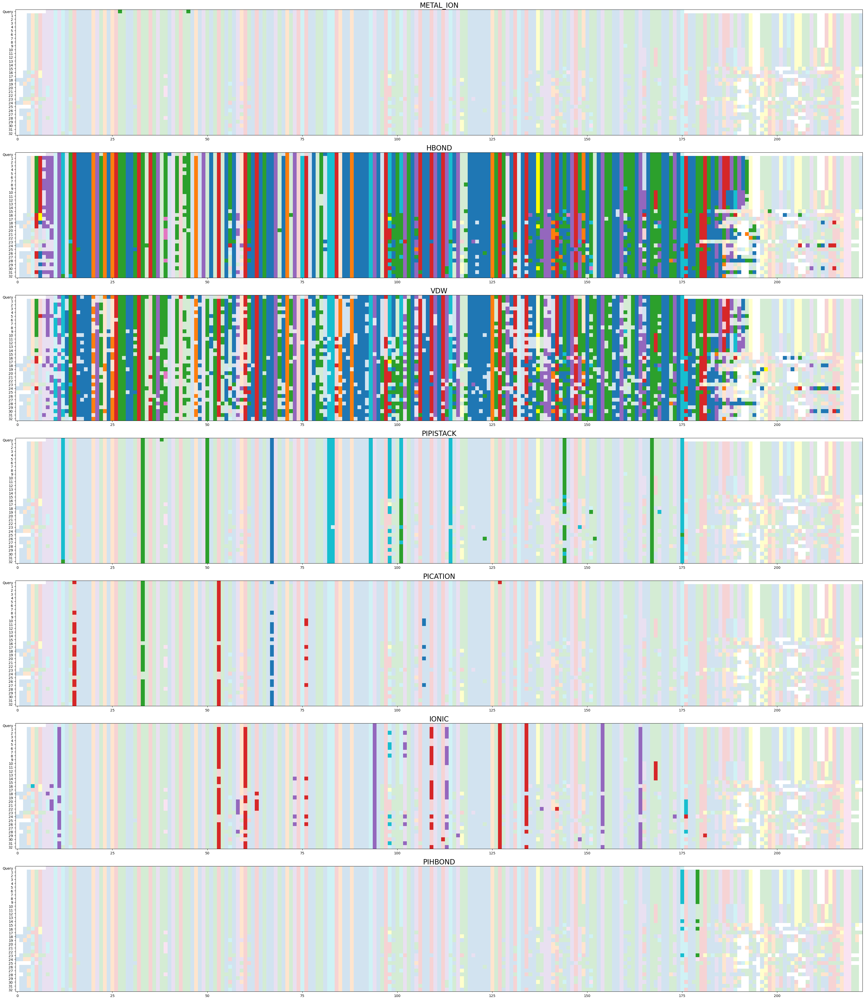

In [60]:
rh.plot_contacts()

In [ ]:
def summary_other(self,msaCol, inter_class = 'all'):
    df = rh.filter_contact_df(inter_class=inter_class)

In [73]:
from collections import defaultdict
def intrachain_summary(self, u,v, inter_type = 'all'):
    sele = (rh.contact_df['msaCol1'] == u) & (rh.contact_df['msaCol2'] == v)
    if inter_type != 'all':
        if type(inter_type) == 'str':
            inter_type = [inter_type]
        else:
            raise Exception("inter_type should be string or list of str")
        for inter_type_selected in inter_type:
            sele = sele | (self.contact_df['iter'] == inter_type_selected)
    out_df = rh.contact_df[sele].sort_values(['inter', 'acc_chn'])
    type_data = {}
    for seleced_inter_type in list(out_df['inter'].unique()):
        resPair_count = defaultdict(int)
        type_df = rh.contact_df[(rh.contact_df['inter'] == seleced_inter_type) & sele]
        print(seleced_inter_type, len(type_df))
        for i,r in type_df.iterrows():
            resPair = r['Node1_name']+'-'+r['Node2_name']
            resPair_count[resPair] += 1
        print(resPair_count)

    return out_df
intrachain_summary(rh, 88,121)

,NodeId1,Interaction,NodeId2,Distance,acc,acc_chn,chain1,chain2,struct_id1,struct_id2,inter,inter_orientation,msaCol1,msaCol2,Node1_name,Node2_name,inter_class,res1_one,res2_one


In [8]:
rh.contact_df[rh.contact_df['inter_class'] == 'intra']

,NodeId1,Interaction,NodeId2,Distance,acc,acc_chn,chain1,chain2,struct_id1,struct_id2,inter,inter_orientation,msaCol1,msaCol2,Node1_name,Node2_name,inter_class,res1_one,res2_one
0,A:78:_:SER,VDW:SC_SC,A:82:_:ARG,2.879,_QUERY,_QUERY_A,A,A,78,82,VDW,SC_SC,74,78,SER,ARG,intra,S,R
1,A:23:_:GLY,HBOND:MC_MC,A:27:_:LEU,2.897,_QUERY,_QUERY_A,A,A,23,27,HBOND,MC_MC,19,23,GLY,LEU,intra,G,L
2,A:13:_:LYS,HBOND:SC_MC,A:82:_:ARG,2.897,_QUERY,_QUERY_A,A,A,13,82,HBOND,SC_MC,9,78,LYS,ARG,intra,K,R
3,A:132:_:ARG,IONIC:SC_SC,A:152:_:GLU,3.665,_QUERY,_QUERY_A,A,A,132,152,IONIC,SC_SC,128,148,ARG,GLU,intra,R,E
4,A:92:_:ASP,IONIC:SC_SC,A:125:_:LYS,3.673,_QUERY,_QUERY_A,A,A,92,125,IONIC,SC_SC,88,121,ASP,LYS,intra,D,K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16090,D:167:_:THR,HBOND:MC_MC,D:171:_:GLU,3.104,5jcz,5jcz_D,D,D,167,171,HBOND,MC_MC,163,167,THR,GLU,intra,T,E
16092,D:92:_:ASP,HBOND:SC_SC,D:125:_:LYS,3.049,5jcz,5jcz_D,D,D,92,125,HBOND,SC_SC,88,121,ASP,LYS,intra,D,K
16093,D:26:_:ASN,VDW:SC_SC,D:36:_:PHE,2.731,5jcz,5jcz_D,D,D,26,36,VDW,SC_SC,22,32,ASN,PHE,intra,N,F
16094,D:72:_:ARG,HBOND:SC_SC,D:77:_:THR,3.011,5jcz,5jcz_D,D,D,72,77,HBOND,SC_SC,68,73,ARG,THR,intra,R,T


In [5]:
rh.filter_contact_df(inter_participant='all')

,NodeId1,Interaction,NodeId2,Distance,acc,acc_chn,chain1,chain2,struct_id1,struct_id2,inter,inter_orientation,msaCol1,msaCol2,Node1_name,Node2_name,inter_class,res1_one,res2_one
0,A:78:_:SER,VDW:SC_SC,A:82:_:ARG,2.879,_QUERY,_QUERY_A,A,A,78,82,VDW,SC_SC,74,78,SER,ARG,intra,S,R
1,A:23:_:GLY,HBOND:MC_MC,A:27:_:LEU,2.897,_QUERY,_QUERY_A,A,A,23,27,HBOND,MC_MC,19,23,GLY,LEU,intra,G,L
2,A:13:_:LYS,HBOND:SC_MC,A:82:_:ARG,2.897,_QUERY,_QUERY_A,A,A,13,82,HBOND,SC_MC,9,78,LYS,ARG,intra,K,R
3,A:132:_:ARG,IONIC:SC_SC,A:152:_:GLU,3.665,_QUERY,_QUERY_A,A,A,132,152,IONIC,SC_SC,128,148,ARG,GLU,intra,R,E
4,A:92:_:ASP,IONIC:SC_SC,A:125:_:LYS,3.673,_QUERY,_QUERY_A,A,A,92,125,IONIC,SC_SC,88,121,ASP,LYS,intra,D,K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16091,D:42:_:SER,VDW:SC_LIG,D:203:_:BEF,2.674,5jcz,5jcz_D,D,D,42,203,VDW,SC_LIG,38,<NA>,SER,BEF,intra,S,<NA>
16092,D:92:_:ASP,HBOND:SC_SC,D:125:_:LYS,3.049,5jcz,5jcz_D,D,D,92,125,HBOND,SC_SC,88,121,ASP,LYS,intra,D,K
16093,D:26:_:ASN,VDW:SC_SC,D:36:_:PHE,2.731,5jcz,5jcz_D,D,D,26,36,VDW,SC_SC,22,32,ASN,PHE,intra,N,F
16094,D:72:_:ARG,HBOND:SC_SC,D:77:_:THR,3.011,5jcz,5jcz_D,D,D,72,77,HBOND,SC_SC,68,73,ARG,THR,intra,R,T


In [5]:
rh.contact_df[rh.contact_df['res1_one'].isna()]

,NodeId1,Interaction,NodeId2,Distance,acc,acc_chn,chain1,chain2,struct_id1,struct_id2,inter,inter_orientation,msaCol1,msaCol2,Node1_name,Node2_name,inter_class,res1_one,res2_one
7866,M:1182:_:SO4,VDW:LIG_SC,Q:372:_:GLU,3.019,4uj3,4uj3_M,M,Q,1182,372,VDW,LIG_SC,<NA>,<NA>,SO4,GLU,LIG,<NA>,E
8578,V:300:_:PG4,VDW:LIG_SC,W:419:_:THR,2.890,4uj3,4uj3_V,V,W,300,419,VDW,LIG_SC,<NA>,<NA>,PG4,THR,LIG,<NA>,T
15976,C:1902:_:EDO,VDW:LIG_SC,D:73:_:TYR,2.889,5jcz,5jcz_D,C,D,1902,73,VDW,LIG_SC,<NA>,69,EDO,TYR,LIG,<NA>,Y


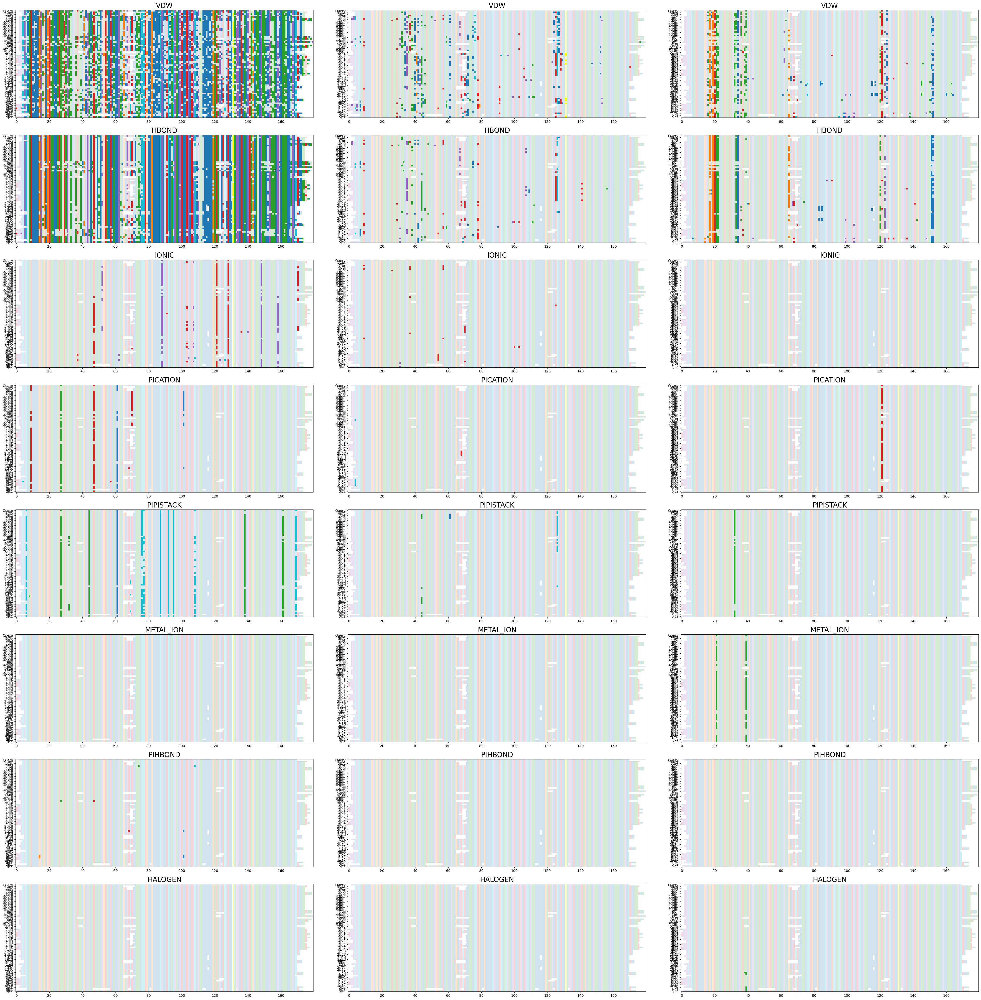

In [4]:
rh.plot_contacts(display_acc=True, inter_participants=['intra', 'inter', 'LIG'])

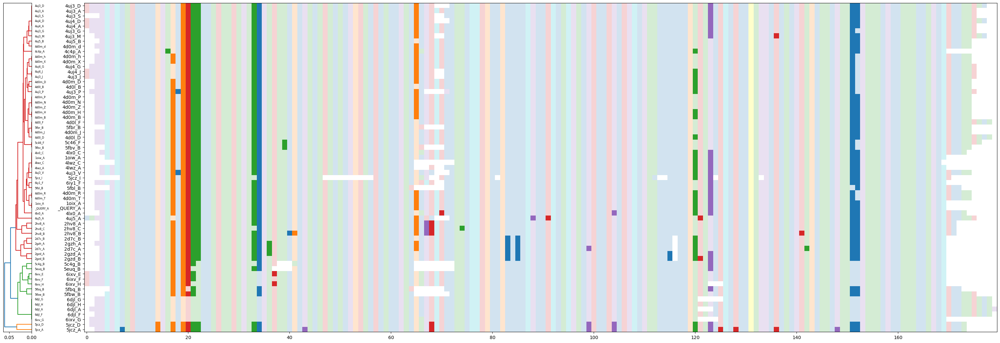

([30,
  29,
  34,
  38,
  39,
  28,
  32,
  26,
  24,
  61,
  23,
  18,
  37,
  36,
  31,
  8,
  4,
  33,
  12,
  11,
  15,
  9,
  7,
  6,
  3,
  10,
  5,
  22,
  2,
  53,
  49,
  55,
  56,
  35,
  63,
  52,
  46,
  14,
  13,
  48,
  0,
  54,
  27,
  42,
  40,
  41,
  50,
  43,
  51,
  45,
  44,
  25,
  20,
  60,
  59,
  57,
  47,
  1,
  17,
  16,
  19,
  21,
  58,
  64,
  62],
 ['4uj3_D',
  '4uj3_A',
  '4uj3_S',
  '4uj4_D',
  '4uj4_A',
  '4uj3_G',
  '4uj3_M',
  '4uj5_B',
  '4d0m_d',
  '4c4p_A',
  '4d0m_h',
  '4d0m_X',
  '4uj4_G',
  '4uj4_J',
  '4uj3_J',
  '4d0m_D',
  '4d0l_B',
  '4uj3_P',
  '4d0m_P',
  '4d0m_N',
  '4d0m_Z',
  '4d0m_H',
  '4d0m_B',
  '4d0l_F',
  '5fbr_B',
  '4d0m_J',
  '4d0l_D',
  '5c46_F',
  '5fbv_B',
  '4lx0_C',
  '1oiw_A',
  '4lwz_C',
  '4lwz_A',
  '4uj3_V',
  '5jcz_I',
  '6iy1_F',
  '5fbl_B',
  '4d0m_R',
  '4d0m_T',
  '1oix_A',
  '_QUERY_A',
  '4lx0_A',
  '4uj5_A',
  '2hv8_A',
  '2hv8_C',
  '2hv8_B',
  '2d7c_B',
  '2gzh_A',
  '2d7c_A',
  '2gzd_A',
  '2gzd_B',
  '5c

In [7]:
rh.plot_contact_conservation('HBOND', 'LIG')

In [5]:
debug = rh.file_df
rh.file_df

,acc,pdb_chain,acc_chn,struct_pth,has_unk_res,edge_pth,node_pth
0,_QUERY,A,_QUERY_A,cif/PDB/query.cif,False,ring_out/PDB/query.cif_ringEdges,ring_out/PDB/query.cif_ringNodes
1,5fbw,B,5fbw_B,cif/PDB/5fbw.cif,False,ring_out/PDB/5fbw.cif_ringEdges,ring_out/PDB/5fbw.cif_ringNodes
2,5fbv,B,5fbv_B,cif/PDB/5fbv.cif,False,ring_out/PDB/5fbv.cif_ringEdges,ring_out/PDB/5fbv.cif_ringNodes
3,5fbr,B,5fbr_B,cif/PDB/5fbr.cif,False,ring_out/PDB/5fbr.cif_ringEdges,ring_out/PDB/5fbr.cif_ringNodes
4,4d0l,B,4d0l_B,cif/PDB/4d0l.cif,False,ring_out/PDB/4d0l.cif_ringEdges,ring_out/PDB/4d0l.cif_ringNodes
...,...,...,...,...,...,...,...
60,6ixv,E,6ixv_E,cif/PDB/6ixv.cif,False,ring_out/PDB/6ixv.cif_ringEdges,ring_out/PDB/6ixv.cif_ringNodes
61,4c4p,A,4c4p_A,cif/PDB/4c4p.cif,False,ring_out/PDB/4c4p.cif_ringEdges,ring_out/PDB/4c4p.cif_ringNodes
62,5jcz,A,5jcz_A,cif/PDB/5jcz.cif,False,ring_out/PDB/5jcz.cif_ringEdges,ring_out/PDB/5jcz.cif_ringNodes
63,5jcz,I,5jcz_I,cif/PDB/5jcz.cif,False,ring_out/PDB/5jcz.cif_ringEdges,ring_out/PDB/5jcz.cif_ringNodes


In [6]:
for r in rh.msa:
    print(r.id, str(r.seq))

_QUERY_A --DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATRSIQVDGKTIKAQIWDTAGLERYRAITSAYYRGAVGALLVYDIAKHLTYENVERWLKELRDHADSNIVIMLVGNKSDLRHLRAVPTDEARAFAEKNGLSFIETSALDSTNVEAAFQTILTEIY----------
5fbw_B ----YDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATRSIQVDGKTIKAQIWDTA-------ITSAYYRGAVGALLVYDIAKHLTYENVERWLKELRDHADSNIVIMLVGNKSDLRHLRAVPTDEARAFAEKNGLSFIETSALDSTNVEAAFQTILTEIYRIVSQK----
5fbv_B ----YDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATRSIQVDGKTIKAQIWDTAGR----AITSAYYRGAVGALLVYDIAKHLTYENVERWLKELRDHADSNIVIMLVGNKSDLRHLRAVPTDEARAFAEKNGLSFIETSALDSTNVEAAFQTILTEIYRIVSQ-----
5fbr_B ----YDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATRSIQVDGKTIKAQIWDTAGR----AITSAYYRGAVGALLVYDIAKHLTYENVERWLKELRDHADSNIVIMLVGNKSDLRHLRAVPTDEARAFAEKNGLSFIETSALDSTNVEAAFQTILTEIYRIVSQ-----
4d0l_B --DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATRSIQVDGKTIKAQIWDTAGLERYRAITSAYYRGAVGALLVYDIAKHLTYENVERWLKELRDHADSNIVIMLVGNKSDLRHLRAVPTDEARAFAEKNGLSFIETSALDSTNVEAAFQTILTEIYRIVSQ-----
4d0l_D --DEYDYLFKVVLIGDSGVGKSNLLSRFTRNEFNLESKSTIGVEFATRSIQ

In [2]:
import json
unp_ids = []
pdb_ids = []
mobi_counts = []
mobi_frac = []

# Open the JSON file
with open('mobidb_mobileResidues.json', 'r') as file:
    for line in file:
        try:
            data = json.loads(line)
            # Process the JSON data here
        except json.JSONDecodeError as e:
            print("Error decoding JSON:", e)
        unp_id = data.get('acc')
        mobi_est_keys = [k for k in data.keys() if k.startswith('derived-mobile-mobi')] #or k.startswith('curated')]
        for k in mobi_est_keys:
            mobi_est = data[k]
            try:
                unp_ids.append(unp_id)
                pdb_ids.append(mobi_est['source_id'])
                mobi_counts.append(mobi_est['content_count'])
                mobi_frac.append(mobi_est['content_fraction'])
            except:
                print(mobi_est)
                break
        # source_ids = {data[k]['source_id'] for k in entries if 'source_id' in data[k].keys()}
        # pdb_ids.append(source_ids)
        # num_source.append(len(source_ids))
#pd.DataFrame({'acc':unp_ids,'source_ids':pdb_ids, 'entries':num_source})
mobi_df = pd.DataFrame({'UNP':unp_ids, 'PDB_chn':pdb_ids, 'mobi_count':mobi_counts, 'mobi_frac':mobi_frac})
mobi_df['PDB'] = mobi_df['PDB_chn'].str.split('_').str[0].str.lower()
mobi_df

,UNP,PDB_chn,mobi_count,mobi_frac,PDB
0,C3VPR6,2mjm_A,19,0.010,2mjm
1,A3DCU1,7n87_A,21,0.029,7n87
2,A3DCU1,7s5j_A,26,0.036,7s5j
3,P59113,2kmc_A,22,0.032,2kmc
4,Q13882,1rja_A,4,0.009,1rja
...,...,...,...,...,...
3871,Q03132,1pzr_B,5,0.001,1pzr
3872,A0A2S3R7M0,2n9w_A,29,0.006,2n9w
3873,Q9NZJ4,1iur_A,14,0.003,1iur
3874,Q15149,2n03_A,73,0.016,2n03


In [3]:
data.keys()

dict_keys(['acc', 'derived-mobile-mobi-1ujd_A', 'derived-mobile-th_90', 'derived-mobile_context_dependent-th_90', 'derived-observed-mobi-1ujd_A', 'derived-observed-th_90', 'length', 'gene', 'homology-domain-gene3d', 'homology-domain-merge', 'homology-domain-pfam', 'localization', 'name', 'ncbi_taxon_id', 'organism', 'prediction-coil-fess', 'prediction-disorder-dis465', 'prediction-disorder-disHL', 'prediction-disorder-espD', 'prediction-disorder-espN', 'prediction-disorder-espX', 'prediction-disorder-glo', 'prediction-disorder-iupl', 'prediction-disorder-iups', 'prediction-disorder-mobidb_lite', 'prediction-disorder-th_50', 'prediction-disorder-vsl', 'prediction-helix-fess', 'prediction-lip-anchor', 'prediction-low_complexity-merge', 'prediction-low_complexity-mobidb_lite_sub', 'prediction-low_complexity-pfilt', 'prediction-low_complexity-seg', 'prediction-negative_polyelectrolyte-mobidb_lite_sub', 'prediction-polar-mobidb_lite_sub', 'prediction-polyampholyte-mobidb_lite_sub', 'predict

In [3]:
with open('blast_db/pdb_seqres', 'r') as pdb_file:
    ids = []
    chains = []
    types = []
    while True:
        id_l = pdb_file.readline()
        seq_l = pdb_file.readline()
        
        # Check if both lines are empty, indicating end of file
        if not id_l and not seq_l:
            break
        id_list = id_l.split()
        pdb_acc_chn = id_list[0][1:]
        pdb_acc = pdb_acc_chn.split('_')[0]
        pdb_chn = pdb_acc_chn.split('_')[1]
        mol_type = id_list[1]

        ids.append(str.lower(pdb_acc))
        chains.append(pdb_chn)
        types.append(mol_type)
pdb_df = pd.DataFrame({'PDB':ids,'chain':chains,'mol_type':types})
        

In [4]:
num_chains = pdb_df.groupby('PDB').count()['chain'].sort_values()
num_chains[(num_chains >= 2) & (num_chains <= 5)]

PDB
5idw    2
5lcc    2
5n5m    2
5b6e    2
5kib    2
       ..
6y7b    5
1nam    5
6z1g    5
5x6u    5
7tt6    5
Name: chain, Length: 109544, dtype: int64

In [5]:
mobi_filtered_df = mobi_df.join(num_chains, on='PDB', how='inner')
mobi_filtered_df

,UNP,PDB_chn,mobi_count,mobi_frac,PDB,chain
0,C3VPR6,2mjm_A,19,0.010,2mjm,1
1,A3DCU1,7n87_A,21,0.029,7n87,1
2,A3DCU1,7s5j_A,26,0.036,7s5j,2
3,P59113,2kmc_A,22,0.032,2kmc,1
4,Q13882,1rja_A,4,0.009,1rja,1
...,...,...,...,...,...,...
3871,Q03132,1pzr_B,5,0.001,1pzr,2
3872,A0A2S3R7M0,2n9w_A,29,0.006,2n9w,1
3873,Q9NZJ4,1iur_A,14,0.003,1iur,1
3874,Q15149,2n03_A,73,0.016,2n03,1


In [6]:
tst = mobi_filtered_df[(mobi_filtered_df['chain'] >= 2) & (mobi_filtered_df['mobi_frac'] > 0.1)]
tst

,UNP,PDB_chn,mobi_count,mobi_frac,PDB,chain
18,P84103,2i2y_A,26,0.159,2i2y,2
22,P63172,5jpw_A,24,0.212,5jpw,2
23,P63172,5jpw_B,23,0.204,5jpw,2
39,Q06389,2ju0_A,32,0.168,2ju0,2
72,O26567,2kke_A,13,0.245,2kke,2
...,...,...,...,...,...,...
3100,P38863,5fm1_A,170,0.207,5fm1,6
3699,Q8CIE6,5nzt_A,166,0.136,5nzt,16
3787,O75694,5ijn_E,212,0.152,5ijn,26
3789,O75694,5ijn_Q,188,0.135,5ijn,26


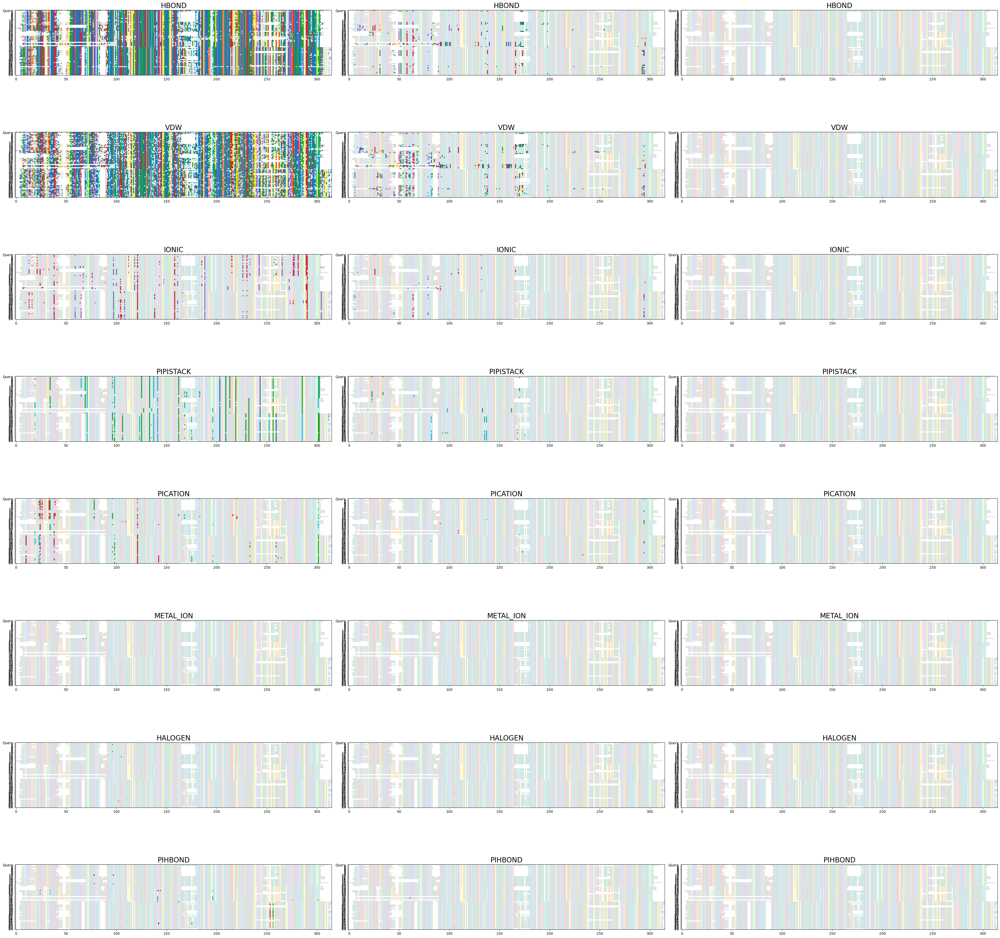

In [3]:
rh.plot_contacts(['intra','inter','LIG'])

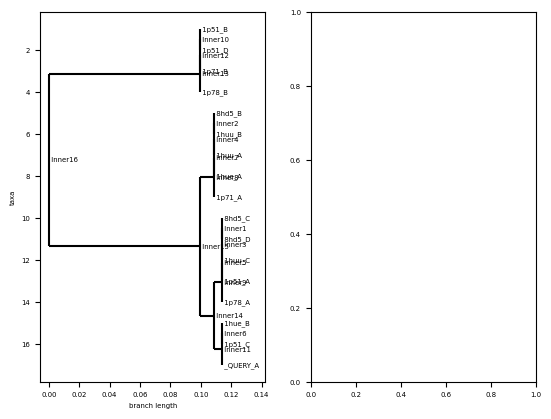

In [45]:
from Bio.Phylo.TreeConstruction import DistanceMatrix, DistanceTreeConstructor
from Bio import Phylo
import matplotlib.pyplot as plt
import matplotlib

# Example: Define a distance matrix

names = [r.id for r in rh.msa]

dist_mat_lower = [dist_mat[i, :i+1].tolist() for i in range(len(dist_mat))]
# Create a DistanceMatrix object
dm = DistanceMatrix(names, dist_mat_lower)

# Initialize a DistanceTreeConstructor object
constructor = DistanceTreeConstructor()

# Construct the phylogenetic tree using UPGMA algorithm
tree = constructor.upgma(dm)

# Draw the phylogenetic tree
matplotlib.rc('font', size=5)
fig, ax = plt.subplots(1,2)  # Create a figure and a set of subplots
Phylo.draw(tree, show_confidence=False, axes=ax[0])
ax[0].set_axis_off()
#Phylo.draw(tree,show_confidence=False)


In [7]:
def build_single_contact_plot(self, inter_participant, contact_type):
        # create the color values for the backgorund of the MSA plot.
        # same for all plots so done once.
        if self.contact_img_base is None:
            self.contact_img_base = self.build_contact_img_base()

        contact_img = self.contact_img_base.copy()
        #dn_order_dict = {index: value for index, value in enumerate(list(reversed(leaves_order)))}

        # map the structure identifiers to the row index in the image
        #orig_acc_list = [r.id for r in msa]
        acc_msa_row_dict = {seq_rec.id: index for index, seq_rec in enumerate(self.msa)}
        filtered_contact_df = self.filter_contact_df(inter_participant=inter_participant, contact_type=contact_type)

        for i,r in filtered_contact_df.iterrows():
            acc = r['acc']
            acc_chn = r['acc_chn']
            msa_row = acc_msa_row_dict[acc_chn]
            msaCol1 = r['msaCol1']
            msaCol2 = r['msaCol2']
            alpha = 0.00
            if not pd.isna(msaCol1):
                msaCol1 = int(msaCol1)
                res1 = three_to_one(r['NodeId1'].split(':')[-1])
                contact_img[msa_row, msaCol1] = np.array(make_darker(hex_to_rgb(clustal_colors[res1]), alpha)) / 255.0
                
            if not pd.isna(msaCol2):
                msaCol2 = int(msaCol2)
                res2 = three_to_one(r['NodeId2'].split(':')[-1])
                contact_img[msa_row, msaCol2] = np.array(make_darker(hex_to_rgb(clustal_colors[res2]), alpha)) / 255.0
        return contact_img

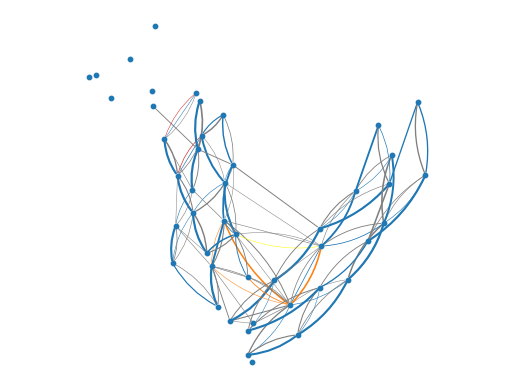

In [37]:
rh.plot_contact_net()

Max prob for VDW: 0.696
Max prob for HBOND: 1.000
Max prob for PIPISTACK: 0.652
Max prob for PIHBOND: 0.043
Max prob for IONIC: 0.130
Max prob for PICATION: 0.000


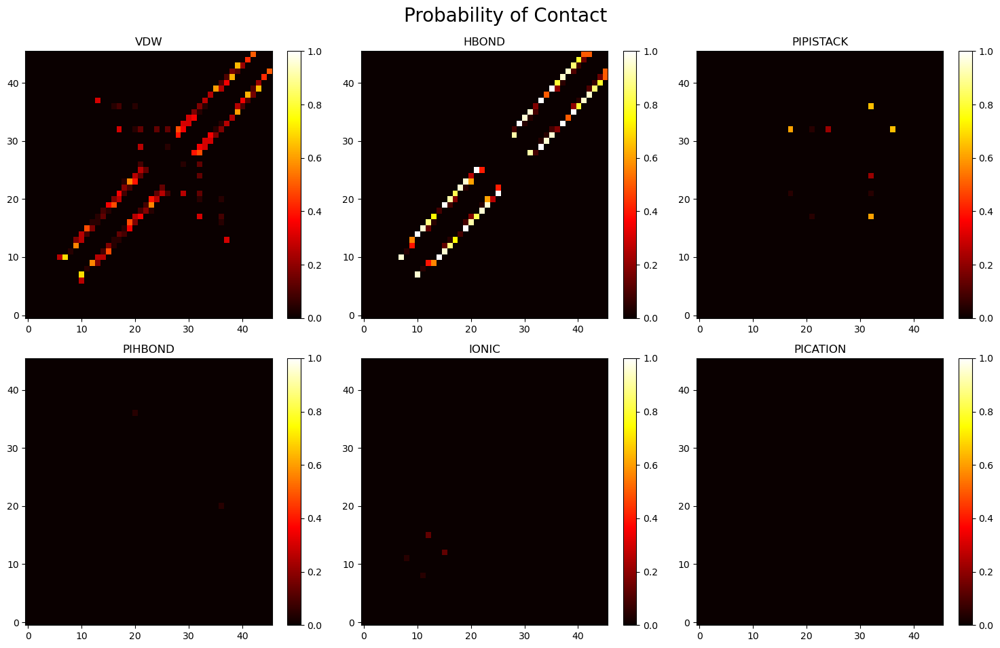

{'VDW': array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]),
 'HBOND': array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]),
 'PIPISTACK': array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]),
 'PIHBOND': array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
     

In [49]:
rh.plot_contact_prob()

In [13]:
def build_contact_plot(self):
        acc_msa_row_dict = {value: index for index, value in enumerate(self.accs)}
        n_row = len(self.msa)
        n_col = self.msa.get_alignment_length()
        img = []
        for acc in self.accs:
            rec = self.get_seqrecord_by_id(acc)
            row = []
            for j in range(n_col):
                res = rec[j]#self.msa[i,j]
                color = np.array(make_fainter(hex_to_rgb(clustal_colors[res]),0.8)) / 255.0
                row.append(color)
            img.append(row)
        img_base = np.array(img)

        contact_img_dict = {}
        # init the values fore the image dictionary
        for contact_type in self._interaction_types:
            contact_img_dict[contact_type] = img_base.copy()

        for i,r in self.contact_df.iterrows():
            acc = r['acc']
            msa_row = acc_msa_row_dict[acc]
            inter = r['inter']
            msaCol1 = r['msaCol1']
            msaCol2 = r['msaCol2']
            alpha = 0.00
            if msaCol1:
                res1 = three_to_one(r['NodeId1'].split(':')[-1])
                try:
                    contact_img_dict[inter][msa_row, msaCol1] = np.array(make_darker(hex_to_rgb(clustal_colors[res1]), alpha)) / 255.0
                except:
                    print(msaCol1, self.msa.get_alignment_length())
            if msaCol2:
                res2 = three_to_one(r['NodeId2'].split(':')[-1])
                contact_img_dict[inter][msa_row, msaCol2] = np.array(make_darker(hex_to_rgb(clustal_colors[res2]), alpha)) / 255.0
        return contact_img_dict

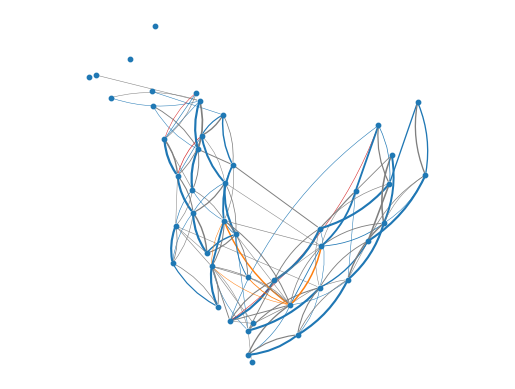

In [3]:
rh.plot_contact_net()

In [41]:
def InteractionSummary(self, u, v, verbose = False): 
    summary_df = self.contact_df[(self.contact_df['msaCol1'] == u) & (self.contact_df['msaCol2'] == v)].copy()
    summary_df['res3_u'] = summary_df['NodeId1'].str.split(':').str[-1]
    summary_df['res3_v'] = summary_df['NodeId2'].str.split(':').str[-1]
    summary_df = summary_df[['acc','inter','msaCol1','msaCol2']]

In [42]:
InteractionSummary(rh, 17, 32)

,acc,NodeId1,Interaction,NodeId2,inter,inter_orientation,struct_id1,struct_id2,msaCol1,msaCol2
252,P12368,A:17:_:TYR,PIPISTACK:SC_SC,A:32:_:PHE,PIPISTACK,SC_SC,17,32,17,32
768,P13861,A:17:_:TYR,PIPISTACK:SC_SC,A:32:_:PHE,PIPISTACK,SC_SC,17,32,17,32
769,P13861,A:17:_:TYR,VDW:SC_SC,A:32:_:PHE,VDW,SC_SC,17,32,17,32
1271,P00515,A:17:_:TYR,PIPISTACK:SC_SC,A:32:_:PHE,PIPISTACK,SC_SC,17,32,17,32
1799,P12367,A:17:_:TYR,PIPISTACK:SC_SC,A:31:_:PHE,PIPISTACK,SC_SC,17,31,17,32
2299,P31322,A:16:_:PHE,PIPISTACK:SC_SC,A:31:_:PHE,PIPISTACK,SC_SC,16,31,17,32
2804,P31323,A:16:_:PHE,PIPISTACK:SC_SC,A:31:_:PHE,PIPISTACK,SC_SC,16,31,17,32
2805,P31323,A:16:_:PHE,VDW:SC_SC,A:31:_:PHE,VDW,SC_SC,16,31,17,32
3327,P12369,A:16:_:PHE,PIPISTACK:SC_SC,A:31:_:PHE,PIPISTACK,SC_SC,16,31,17,32
3839,P31324,A:16:_:PHE,PIPISTACK:SC_SC,A:31:_:PHE,PIPISTACK,SC_SC,16,31,17,32


In [6]:
def InteractionSummary(self, u, v, verbose = False): 
        if self.prob_df is None:
            self.build_contact_prob_df()
        if self.pos_dict is None:
            self._build_pos_dict()
        inter_type_df = self.prob_df[(self.prob_df['i'] == u) & (self.prob_df['j'] == v)].copy()
        # it does not make sense (nor is it computationally efficient) to calculat prob of NO_INTERACTION for each pair of indicies
        # should be done here.
        accs_no_interaction = self.accs
        for _, inter_type_r in inter_type_df.iterrows():
            contact_type_selected = inter_type_r['contact_type']
            print(f"Interaction: {contact_type_selected} Probability: {inter_type_r['probability']:.3f}, Count: {inter_type_r['count']}")
            accs = list(self.contact_df[(self.contact_df['Interaction'] == contact_type_selected) & \
                                            ((self.contact_df['msaCol1'] == u) & (self.contact_df['msaCol2'] == v) | \
                                            (self.contact_df['msaCol1'] == v) & (self.contact_df['msaCol2'] == u))]['acc'])
            accs_no_interaction = [acc for acc in accs_no_interaction if acc not in accs] # remove acc_ids that have interaction of this contact type
            #print(accs_no_interaction)
            print('AA pair probability: ' + ', '.join([f"{one_to_three(inter[0])}-{one_to_three(inter[1])}: {count / inter_type_r['count']:.3f}" for inter, count in interaction_dict.items()]))
            interaction_dict = {}
            for acc in accs:
                seq_aln_record = self.get_seqrecord_by_id(acc)
                res_u = seq_aln_record[u]
                res_v = seq_aln_record[v]
                AA_inter_pair = res_u + res_v
                interaction_dict[AA_inter_pair] = interaction_dict.get(AA_inter_pair, 0) + 1
                if verbose:
                    if acc != '_QUERY':
                        blast_r = self.blast_df[self.blast_df['acc'] == acc].iloc[0]
                        sbj_offset_start = blast_r['sstart'] - 1 # subtract one to convert residue number to index
                        #sbj_offset_end = blast_r['send'] - 1 # One indexed to zero indexed
                        #full_seq = blast_r['full_seq']
                    else:
                        sbj_offset_start = 0
                        #full_seq = str(seq_rec_acc.seq).strip('-')
                    u_trimmed_idx = aln_to_seq_idx(str(seq_aln_record.seq), u)
                    v_trimmed_idx = aln_to_seq_idx(str(seq_aln_record.seq), v)
                    idx_full_u, idx_full_v =  sbj_offset_start + u_trimmed_idx, sbj_offset_start + v_trimmed_idx
                    print(f"\t{acc}: {one_to_three(res_u)}-{one_to_three(res_v)}\tRes# (Uniprot): {idx_full_u + 1}, {idx_full_v + 1}, Dist(CA): {np.linalg.norm(self.pos_dict[acc][u_trimmed_idx,:] - self.pos_dict[acc][v_trimmed_idx,:]):.3f}")
                    # Atom position debug
                    # print(f"ATOM POS({u_trimmed_idx},{v_trimmed_idx}) : {self.pos_dict[acc][u_trimmed_idx,:]} {self.pos_dict[acc][v_trimmed_idx,:]} Dist(CA): {np.linalg.norm(self.pos_dict[acc][u_trimmed_idx,:] - self.pos_dict[acc][v_trimmed_idx,:])}")
                    ## INDEX MAPPING DEBUGGING
                    # print(f"{aln_to_seq_idx(str(seq_rec_acc.seq), u) + sbj_offset_start}, {aln_to_seq_idx(str(seq_rec_acc.seq), v) + sbj_offset_end}")
                    #print(str(seq_rec_acc.seq).strip('-'))
                    #print(full_seq[sbj_offset_start-1:sbj_offset_end])
                    #print(res_u, res_v)
                    #print(_one_to_three(res_u), _one_to_three(res_v))
                    #print(u,v, '->', aln_to_seq_idx(str(seq_rec_acc.seq), u), aln_to_seq_idx(str(seq_rec_acc.seq), v))
                    # if acc == '_QUERY':
                    #     continue
                    #print(len(full_seq), sbj_offset_start, aln_to_seq_idx(str(seq_rec_acc.seq), u))

            
        # calulate prob and count of no contact for pair (u,v)
        count_nc = len(accs_no_interaction)
        prob_nc = count_nc / len(self.accs)
        if len(accs_no_interaction) > 0:
            print(f"Interaction: NO_INTER Probability: {prob_nc:.3f}, Count: {count_nc}")
        inter_type_df = pd.concat([inter_type_df, pd.DataFrame({'i':[u],'j':[v],'contact_type':["NO_INTER"],'probability':[prob_nc],'count':[count_nc]})], ignore_index=True)
        no_interaction_dict = {}
        for acc in accs_no_interaction:
            seq_aln_record = self.get_seqrecord_by_id(acc)
            res_u = seq_aln_record[u]
            res_v = seq_aln_record[v]
            AA_inter_pair = res_u + res_v
            no_interaction_dict[AA_inter_pair] = no_interaction_dict.get(AA_inter_pair, 0) + 1
            if verbose:
                if acc != '_QUERY':
                    blast_r = self.blast_df[self.blast_df['acc'] == acc].iloc[0]
                    sbj_offset_start = blast_r['sstart'] - 1 # subtract one to convert residue number to index
                    #sbj_offset_end = blast_r['send'] - 1 # One indexed to zero indexed
                    #full_seq = blast_r['full_seq']
                else:
                    sbj_offset_start = 0
                    #full_seq = str(seq_rec_acc.seq).strip('-')
                u_trimmed_idx = aln_to_seq_idx(str(seq_aln_record.seq), u)
                v_trimmed_idx = aln_to_seq_idx(str(seq_aln_record.seq), v)
                idx_full_u, idx_full_v =  sbj_offset_start + u_trimmed_idx, sbj_offset_start + v_trimmed_idx
                print(f"\t{acc}: {one_to_three(res_u)}-{one_to_three(res_v)}\tRes# (Uniprot): {idx_full_u + 1}, {idx_full_v + 1}, Dist(CA): {np.linalg.norm(self.pos_dict[acc][u_trimmed_idx,:] - self.pos_dict[acc][v_trimmed_idx,:]):.3f}")
        print('\t' + ', '.join([f"{one_to_three(inter[0])}-{one_to_three(inter[1])}: {count / len(accs_no_interaction):.3f}" for inter, count in no_interaction_dict.items()]))
        return inter_type_df

Interaction: VDW Probability: 0.174, Count: 4


UnboundLocalError: cannot access local variable 'interaction_dict' where it is not associated with a value

In [54]:
# TODO: Simplify method by using the atom_df
def _append_alignment(self, subject_pth, ens_path, rot_tran, state, seperate_states):
        ATOM_header_ens = []
        ATOM_header_sbj = []
        col_idx = []
        inHeader = False
        with open(ens_path, 'r') as dst:
            for l in dst:
                if l.startswith('_atom_site.'): # ATOM header
                    ATOM_header_ens.append(l.split('.')[1].strip())
        with open(subject_pth,'r') as src, open(ens_path, 'a') as dst:
            for l in src:
                if l.startswith('_atom_site.'): # ATOM header
                    inHeader = True
                    ATOM_header_sbj.append(l.split('.')[1].strip())
                elif inHeader:
                    inHeader = False
                    col_idx = [ATOM_header_ens.index(col) for col in ATOM_header_sbj if col in ATOM_header_ens]
                if l.startswith('ATOM'): # ATOM data
                    l_tab = re.sub(r"\s+(?=\S)", "\t", l) # CIF uses inconsitent whitespace delims, replace with one tab
                    ATOM_arr = l_tab.split('\t')
                    state_idx = ATOM_header_sbj.index('pdbx_PDB_model_num')
                    x_idx = ATOM_header_sbj.index('Cartn_x')
                    y_idx = ATOM_header_sbj.index('Cartn_y')
                    z_idx = ATOM_header_sbj.index('Cartn_z')
                    chain_idx = ATOM_header_sbj.index('label_asym_id')
                    chain_auth_idx = ATOM_header_sbj.index('auth_asym_id')

                    # TODO: deal with multi chain structures.
                    chain = ATOM_arr[chain_idx]
                    xyz = np.array((
                        ATOM_arr[x_idx].strip(),
                        ATOM_arr[y_idx].strip(),
                        ATOM_arr[z_idx].strip()
                    ), dtype=np.float64)
                    rot, tran = rot_tran
                    xyz_aln = np.dot(xyz, rot) + tran
                    
                    ATOM_arr[x_idx] = xyz_aln[0]
                    ATOM_arr[y_idx] = xyz_aln[1]
                    ATOM_arr[z_idx] = xyz_aln[2]
                    if seperate_states:
                        ATOM_arr[state_idx] = state
                    else: # seperate by chain
                        ATOM_arr[chain_idx] = int_to_letters(state - 1)
                        ATOM_arr[chain_auth_idx] = int_to_letters(state - 1)
                        ATOM_arr[state_idx] = 1
                    l_arr = [ATOM_arr[col_idx[i]] for i in range(len(col_idx))]
                    line = ' '.join([str(val) for val in l_arr]) + '\n'
                    dst.write(line)


In [6]:
rh.blast_df[['acc', 'full_seq']].groupby('full_seq').agg(list) #TODO: cluster at 100% seq identity

,acc
full_seq,
MAATGTAAAAATGKLLVLLLLGLTAPAAALAGYIEALAANAGTGFAVAEPQIAMFCGKLNMHVNIQTGKWEPDPTGTKSCLGTKEEVLQYCQEIYPELQITNVMEANQPVNIDSWCRRDKKQCRSHIVIPFKCLVGEFVSDVLLVPENCQFFHQERMEVCEKHQRWHTVVKEACLTEGMTLYSYGMLLPCGVDQFHGTEYVCCPQTKVVDSDSTMSKEEEEEEEEDEEEDYALDKSEFPTEADLEDFTEAAADEDEDEEEEEEEEGEEVVEDRDYYYDSFKGDDYNEENPTEPSSDGTISDKEIAHDVKAVCSQEAMTGPCRAVMPRWYFDLSKGKCVRFIYGGCGGNRNNFESEDYCMAVCKTMIPPTPLPTNDVDVYFETSADDNEHARFQKAKEQLEIRHRSRMDRVKKEWEEAELQAKNLPKAERQTLIQHFQAMVKALEKEAASEKQQLVETHLARVEAMLNDRRRIALENYLAALQSDPPRPHRILQALRRYVRAENKDRLHTIRHYQHVLAVDPEKAAQMKSQVMTHLHVIEERRNQSLSLLYKVPYVAQEIQEEIDELLQEQRADMDQFTSSISENPVDVRVSSEESEEIPPFHPFHPFPSLSENEDTQPELYHPMKKGSGMAEQDGGLIGAEEKVINSKNKMDENMVIDETLDVKEMIFNAERVGGLEEEPDSVGPLREDFSLSSSALIGLLVIAVAIATVIVISLVMLRKRQYGTISHGIVEVHPMLTPEERHLNKMQNHGYENPTYKYLEQMQI,[P15943]
MAATGTAAAAATGKLLVLLLLGLTAPAAALAGYIEALAANAGTGFAVAEPQIAMFCGKLNMHVNIQTGKWEPDPTGTKSCLGTKEEVLQYCQEIYPELQITNVMEANQPVNIDSWCRRDKRQCKSHIVIPFKCLVGEFVSDVLLVPDNCQFFHQERMEVCEKHQRWHTLVKEACLTEGLTLYSYGMLLPCGVDQFHGTEYVCCPQTKTVDSDSTMSKEEEEEEEDEEDEEEDYDLDKSEFPTEADLEDFTEAAADEEEEDEEEGEEVVEDRDYYYDPFKGDDYNEENPTEPSSEGTISDKEIVHDVKVPPTPLPTNDVDVYFETSADDNEHARFQKAKEQLEIRHRNRMDRVKKEWEEAELQAKNLPKTERQTLIQHFQAMVKALEKEAASEKQQLVETHLARVEAMLNDRRRIALENYLAALQSDPPRPHRILQALRRYVRAENKDRLHTIRHYQHVLAVDPEKAAQMKSQVMTHLHVIEERRNQSLSLLYKVPYVAQEIQEEIDELLQEQRADMDQFTSSISENPVDVRVSSEESEEIPPFHPLHPFPSLSENEDTQPELYHPMKKGSGMAEQDGGLIGAEEKVINSKNKMDENMVIDETLDVKEMIFNAERVGGLEEEPESVGPLREDFSLSSNALIGLLVIAVAIATVIVISLVMLRKRQYGTISHGIVEVDPMLTPEERHLNKMQNHGYENPTYKYLEQMQI,[Q06335]
MAATGTAAAAATGRLLLLLLVGLTAPALALAGYIEALAANAGTGFAVAEPQIAMFCGKLNMHVNIQTGKWEPDPTGTKSCFETKEEVLQYCQEMYPELQITNVMEANQRVSIDNWCRRDKKQCKSRFVTPFKCLVGEFVSDVLLVPEKCQFFHKERMEVCENHQHWHTVVKEACLTQGMTLYSYGMLLPCGVDQFHGTEYVCCPQTKIIGSVSKEEEEEDEEEEEEEDEEEDYDVYKSEFPTEADLEDFTEAAVDEDDEDEEEGEEVVEDRDYYYDTFKGDDYNEENPTEPGSDGTMSDKEITHDVKAVCSQEAMTGPCRAVMPRWYFDLSKGKCVRFIYGGCGGNRNNFESEDYCMAVCKAMIPPTPLPTNDVDVYFETSADDNEHARFQKAKEQLEIRHRNRMDRVKKEWEEAELQAKNLPKAERQTLIQHFQAMVKALEKEAASEKQQLVETHLARVEAMLNDRRRMALENYLAALQSDPPRPHRILQALRRYVRAENKDRLHTIRHYQHVLAVDPEKAAQMKSQVMTHLHVIEERRNQSLSLLYKVPYVAQEIQEEIDELLQEQRADMDQFTASISETPVDVRVSSEESEEIPPFHPFHPFPALPENEDTQPELYHPMKKGSGVGEQDGGLIGAEEKVINSKNKVDENMVIDETLDVKEMIFNAERVGGLEEERESVGPLREDFSLSSSALIGLLVIAVAIATVIVISLVMLRKRQYGTISHGIVEVDPMLTPEERHLNKMQNHGYENPTYKYLEQMQI,[Q06481]
MCAALRRNLLLRSLWVVLAIGTAQVQAASPRWEPQIAVLCEAGQIYQPQYLSEEGRWVTDLSKKTTGPTCLRDKMDLLDYCKKAYPNRDITNIVESSHYQKIGGWCRQGALNAAKCKGSHRWIKPFRCLGPFQSDALLVPEGCLFDHIHNASRCWPFVRWNQTGAAACQERGMQMRSFAMLLPCGISVFSGVEFVCCPKHFKTDEIHVKKTDLPVMPAAQINSANDELVMNDEDDSNDSNYSKDANEDDLDDEDDLMGDDEEDDMVADEAATAGGSPNTGSSGDSNSGSLDDINAEYDSGEEGDNYEEDGAGSESEAEVEASWDQSGGAKVVSLKSDSSSPSSAPVAPAPEKAPVKSESVTSTPQLSASAAAFVAANSGNSGTGAGAPPSTAQPTSDPYFTHFDPHYEHQSYKVSQKRLEESHREKVTRVMKDWSDLEEKYQDMRLADPKAAQSFKQRMTARFQTSVQALEEEGNAEKHQLAAMHQQRVLAHINQRKREAMTCYTQALTEQPPNAHHVEKCLQKLLRALHKDRAHALAHYRHLLNSGGPGGLEAAASERPRTLERLIDIDRAVNQSMTMLKRYPELSAKIAQLMNDYILALRSKDDIPGSSLGMSEEAEAGILDKYRVEIERKVAEKERLRLAEKQRKEQRAAEREKLREEKLRLEAKKVDDMLKSQVAEQQSQPTQSSTQSQAQQQQQEKSLPGKELGPDAALVTAANPNLETTKSEKDLSDTEYGEATVSSTKVQTVLPTVDDDAVQRAVEDVAAAVAHQEAEPQVQHFMTHDLGHRESSFSLRREFAQHAHAAKEGRNVYFTLSFAGIALMAAVFVGVAVAKWRTSRSPHAQGFIEVDQNVTTHHPIVREEKIVPNMQINGYENPTYKYFEVKE,[P14599]
MGETTAFVLLLVATLTRSSEIPADDTVGLLTEPQVAMFCGKLNMHINVQNGKWESDPSGTKSCLNTKEGILQYCQEVYPELQITNVVEANQPVSIQNWCKKGRKQCRSHTHIVVPYRCLVGEFVSDALLVPDKCKFLHQERMNQCESHLHWHTVAKESCGDRSMNLHDYGMLLPCGIDRFRGVKFVCCPAETEQETDSSEVEGEESDVWWGGADPEYSENSPPTPSRATYVAGDAFERDENGDGDEDEEDDEDVDPTDEQESDERTANVAMTTTTTTTTESVEEVVRAVCWAQAESGPCRAMLERWYFNPKKRRCVPFLFGGCGGNRNNFESEEYCLAVCSSSLPTVAPSPPDAVDQYFEAPGDDNEHADFRKAKESLEAKHRERMSQVMREWEEAERQAKNLPRADKKAVIQHFQEKVEALEQEAAGERQQLVETHMARVEALLNSRRRLTLENYLGALQANPPRARQVLSLLKKYVRAEQKDRQHTLKHYEHVRTVDPKKAAQIRPQVLTHLRVIDERMNQSLALLYKVPSVASEIQNQIYPAAGSDCKDPVEHCVCPQVDGLVSYGNDALMPDQAYSSAPMDMGVDGLGSIDQSFNQANTENHVEPVDARPIPDRGLPTRPVSSLKLEEMPEVRTETDKRQSAGYEVYHQKLVFFADDVGSNKGAIIGLMVGGVVIATVIVITLVMLRKKQYTSIHHGVIEVDAAVTPEERHLARMQQNGYENPTYKFFEQMQN,[O93279]
MGHSVAWLLLVAAASTLAAEVPTDVSMGLLAEPQVAMFCGKINMHINVQSGKWEPDPSGTKSCIGTKEGILQYCQE

In [3]:
#TODO: Implement these checks in the pipeline
check_uniprot_AF_parody(rh_2k0e, atom_df)
check_ring_msa_parody(rh_2k0e, edge_df)

NameError: name 'atom_df' is not defined

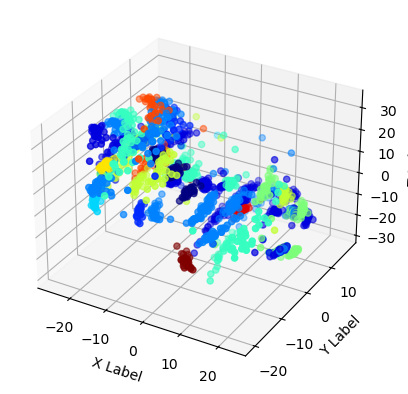

In [37]:
het_cat = het_gb['label_comp_id'].unique()
colors = plt.cm.jet(np.linspace(0, 1, len(het_cat)))
color_map = dict(zip(het_cat, colors))

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
x,y,z = het_gb[['Cartn_x','Cartn_y','Cartn_z']].to_numpy(dtype=float).T
ax.scatter(x, y, z, marker='o', color=list(het_gb['label_comp_id'].map(color_map)))
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.show()

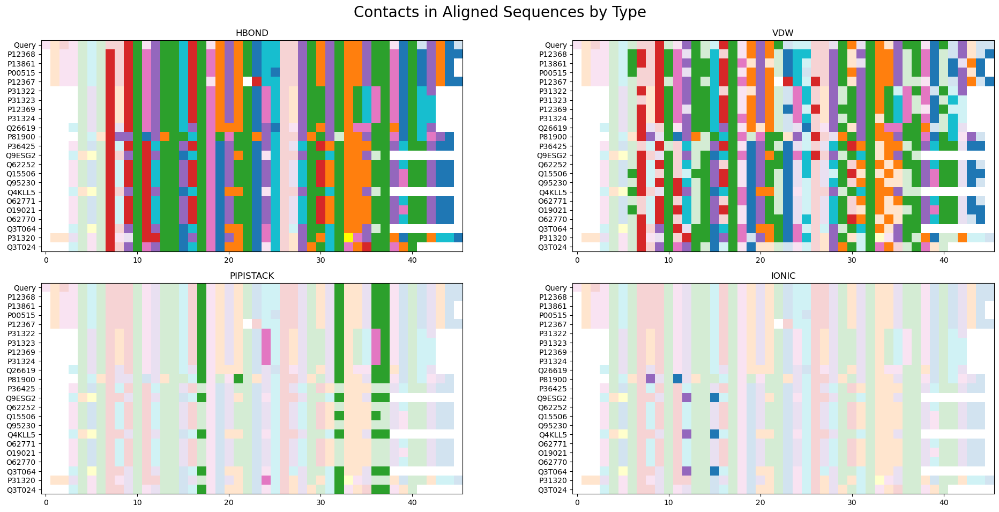

In [22]:
def plot_contacts(self, subplot_dims=(2, 2), interaction_types=None):
    if interaction_types is None:
        interaction_types = self._interaction_types

    nrows, ncols = subplot_dims
    fig, axs = plt.subplots(nrows, ncols, figsize=(20, 5 * nrows))  # Adjust figsize as needed
    # Handle the case of a single subplot
    if nrows * ncols == 1:
        axs = [axs]
    axs = axs.flatten()

    # y_lab = np.arange(0, len(self.msa)).astype(str)
    y_lab = self.accs
    y_lab[0] = 'Query'
    y_lab_pos = np.arange(len(self.msa))

    

    for ax, elem in zip(axs, interaction_types):
        if elem in self.contact_img_dict:
            im = ax.imshow(self.contact_img_dict[elem])
            ax.set_title(elem)
            ax.set_yticks(y_lab_pos)
            ax.set_yticklabels(y_lab)
        else:
            ax.set_visible(False)  # Hide axes without data

    #plt.tight_layout()
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.suptitle("Contacts in Aligned Sequences by Type", fontsize=20)
    plt.show()
plot_contacts(rh_2h9r, subplot_dims=(2,2), interaction_types=['HBOND', 'VDW', 'PIPISTACK', 'IONIC'])

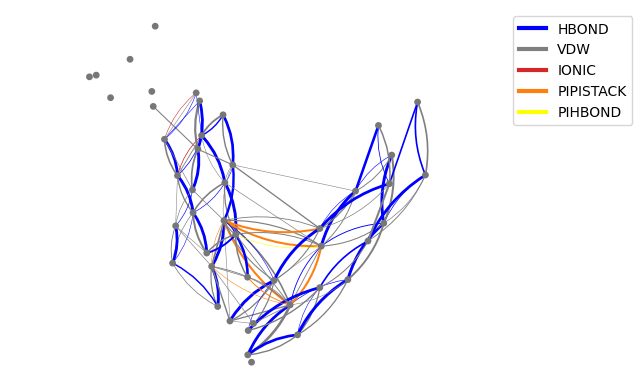

In [14]:
from matplotlib.lines import Line2D
def plot_contact_net(self, use_coords='xz', arced=True, prob_weight = 1.3, min_weight = 0.3, legend=True, color_nodes = None):
    contact_colors = {
        'HBOND': 'blue',
        'VDW': 'tab:gray',
        'IONIC': 'tab:red',
        'PIPISTACK': 'tab:orange',
        'PIHBOND': 'yellow'
    }
    cord_to_idx = {'x': 0, 'y': 1, 'z': 2}
    atom_pos_contig = self.q_atom_pos[:, [cord_to_idx[use_coords[0]], cord_to_idx[use_coords[1]]]]
    nongap_idx = 0
    atom_pos = []
    for msa_col in range(self.msa.get_alignment_length()):
        cur_res = self.msa[0,msa_col]
        if cur_res != '-':
            atom_pos.append(atom_pos_contig[nongap_idx,:])
            #print('nongap', atom_pos[-1].shape)
            nongap_idx += 1
        else:
            atom_pos.append(np.zeros((2)))
            #print('gap', atom_pos[-1].shape)
    #print(len(atom_pos))
    #print(sum([res != '-' for res in str(self.msa[0].seq)]))
    atom_pos = np.array(atom_pos)
    atom_pos = impute_zeros(atom_pos)

    atom_pos_scaled = np.array(atom_pos).astype(float)
    lb = np.min(atom_pos_scaled, axis=0)
    ub = np.max(atom_pos_scaled, axis=0)
    atom_pos_scaled = -1 + ((atom_pos_scaled - lb) / (ub - lb)) * (2)
    pos = {i: atom_pos_scaled[i] for i in range(len(atom_pos_scaled))}

    if self.prob_df is None:
        self.build_contact_prob_df()
    if self.G is None:
        self.build_network()

    node_colors = ['#777777']*self.G.number_of_nodes()#1f78b4
    if color_nodes is not None:
        for n_id in color_nodes:
            node_colors[n_id] = '#FF0000'
    #print(node_colors)
    nx.draw_networkx_nodes(self.G, pos, node_size=15, node_color=node_colors)

    if arced:
        # Drawing arcs for edges with curvature adjustments
        edge_curvature = {}
        for _, row in self.prob_df.iterrows():
            pair = (row['i'], row['j'])
            if pair not in edge_curvature:
                edge_curvature[pair] = 0
            edge_curvature[pair] += 1

        for pair, count in edge_curvature.items():
            if count == 1:
                edge_curvature[pair] = np.array([0])
            else:
                edge_curvature[pair] = np.linspace(-0.15, 0.15, count)

        edge_index = {}
        for _, row in self.prob_df.iterrows():
            u, v = row['i'], row['j']
            ct = row['contact_type']
            color = contact_colors.get(ct, 'black')
            pair = (u, v)
            prob = row['probability']

            if pair not in edge_index:
                edge_index[pair] = 0
            
            rad = edge_curvature[pair][edge_index[pair]]
            edge_index[pair] += 1

            start_pos = np.array(pos[u])
            end_pos = np.array(pos[v])

            patch = patches.FancyArrowPatch(posA=start_pos, posB=end_pos,
                                            connectionstyle=f"arc3,rad={rad}",
                                            arrowstyle='-', color=color, lw= prob_weight*prob + min_weight,
                                            mutation_scale=10.0, zorder=0)
            plt.gca().add_patch(patch)
    else:
        # Drawing straight edges or no edges if prob_df is not provided
        # for (u, v, data) in self.G.edges(data=True):
        #     color = contact_colors.get(data.get('interaction'), 'black')
        for _, r in self.prob_df.iterrows():
            u, v = r['i'], r['j']
            color = contact_colors.get(r['contact_type'])
            prob = r['probability']
            start_pos = np.array(pos[u])
            end_pos = np.array(pos[v])

            plt.plot([start_pos[0], end_pos[0]], [start_pos[1], end_pos[1]], color=color, lw=prob_weight*prob + min_weight)
    if legend:
        legend_lines = [Line2D([0], [0], color=color, lw=3, label=contact_type) for contact_type, color in contact_colors.items()]
        plt.legend(handles=legend_lines, loc='upper left', bbox_to_anchor=(1, 1))
    plt.axis('equal')
    plt.axis('off')
    plt.show()
plot_contact_net(rh_2h9r, legend = True, prob_weight=1.8)

In [74]:
rh_2h9r.buildEnsemble('cif/ens/2h9r_ens_chain.cif')
rh_2h9r.InteractionSummary(17,36, verbose=True)

Interaction: VDW Probability: 0.304, Count: 7
	P31322: Phe-His	Res# (Uniprot): 16, 35, Dist(CA): 7.176
	P31323: Phe-His	Res# (Uniprot): 16, 35, Dist(CA): 7.233
	P12369: Phe-His	Res# (Uniprot): 16, 35, Dist(CA): 7.162
	P81900: Phe-Tyr	Res# (Uniprot): 22, 41, Dist(CA): 7.278
	O62770: Leu-Tyr	Res# (Uniprot): 23, 42, Dist(CA): 7.127
	Q3T064: Phe-Tyr	Res# (Uniprot): 21, 40, Dist(CA): 7.882
	P31320: Leu-Tyr	Res# (Uniprot): 17, 36, Dist(CA): 7.451
	Phe-His: 0.429, Phe-Tyr: 0.286, Leu-Tyr: 0.286
Interaction: PIPISTACK Probability: 0.652, Count: 15
	_QUERY: Tyr-Tyr	Res# (Uniprot): 18, 37, Dist(CA): 7.717
	P12368: Tyr-Tyr	Res# (Uniprot): 17, 36, Dist(CA): 7.060
	P13861: Tyr-Tyr	Res# (Uniprot): 17, 36, Dist(CA): 7.079
	P00515: Tyr-Tyr	Res# (Uniprot): 17, 36, Dist(CA): 7.026
	P12367: Tyr-Tyr	Res# (Uniprot): 17, 35, Dist(CA): 7.068
	P31322: Phe-His	Res# (Uniprot): 16, 35, Dist(CA): 7.176
	P31323: Phe-His	Res# (Uniprot): 16, 35, Dist(CA): 7.233
	P12369: Phe-His	Res# (Uniprot): 16, 35, Dist(CA): 7.16

,i,j,contact_type,probability,count
0,17,36,VDW,0.304348,7
1,17,36,PIPISTACK,0.652174,15
2,17,36,NO_INTER,0.260870,6


In [44]:

rh_2nls.buildEnsemble('cif/ens/2nls_ens_chain.cif')
rh_2nls.InteractionSummary(11,26, verbose=True)

Interaction: VDW Probability: 0.905, Count: 19
	_QUERY: Cys-Cys	Res# (Uniprot): 12, 27, Dist(CA): 5.917
	P61263: Cys-Cys	Res# (Uniprot): 44, 59, Dist(CA): 5.836
	P60023: Cys-Cys	Res# (Uniprot): 44, 59, Dist(CA): 5.803
	Q95M68: Cys-Cys	Res# (Uniprot): 44, 59, Dist(CA): 5.828
	Q7JGM2: Cys-Cys	Res# (Uniprot): 44, 59, Dist(CA): 5.836
	Q95J22: Cys-Cys	Res# (Uniprot): 44, 59, Dist(CA): 5.847
	Q7JGM1: Cys-Cys	Res# (Uniprot): 44, 59, Dist(CA): 5.829
	Q7JGM0: Cys-Cys	Res# (Uniprot): 44, 59, Dist(CA): 5.865
	Q95J18: Cys-Cys	Res# (Uniprot): 44, 59, Dist(CA): 5.857
	Q7JGL9: Cys-Cys	Res# (Uniprot): 44, 59, Dist(CA): 5.845
	Q95J24: Cys-Cys	Res# (Uniprot): 44, 59, Dist(CA): 5.865
	Q7JGL8: Cys-Cys	Res# (Uniprot): 44, 59, Dist(CA): 5.862
	P61262: Cys-Cys	Res# (Uniprot): 44, 59, Dist(CA): 5.839
	O18794: Cys-Cys	Res# (Uniprot): 44, 59, Dist(CA): 5.853
	P61261: Cys-Cys	Res# (Uniprot): 44, 59, Dist(CA): 5.850
	Q95M67: Cys-Cys	Res# (Uniprot): 44, 59, Dist(CA): 5.875
	Q95M66: Cys-Cys	Res# (Uniprot): 44, 59, 

,i,j,contact_type,probability,count
0,11,26,VDW,0.904762,19
1,11,26,SSBOND,1.000000,21
2,11,26,NO_INTER,0.000000,0


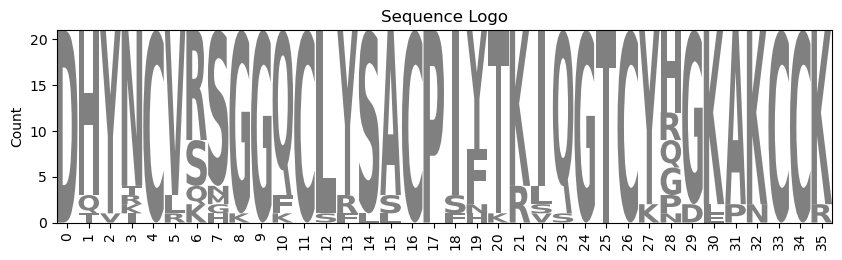

In [9]:
import logomaker
import matplotlib.pyplot as plt
from Bio import AlignIO

# Load the multiple sequence alignment
alignment = rh.msa#AlignIO.read("your_alignment_file.aln", "clustal")

# Convert the alignment to a DataFrame
# The DataFrame should contain frequencies or counts of residues at each position
alignment_data = []
for record in alignment:
    sequence = record.seq
    alignment_data.append(str(sequence))

# Create a DataFrame from the alignment data
import pandas as pd
alignment_df = pd.DataFrame(alignment_data)

# Turn the DataFrame of sequences into a frequency matrix
freq_matrix = logomaker.alignment_to_matrix(sequences=alignment_data, to_type='counts')

# Create the sequence logo
logo = logomaker.Logo(freq_matrix)

# Style the sequence logo
logo.style_xticks(rotation=90, fmt='%d', anchor=0)
logo.ax.set_ylabel("Count")
logo.ax.set_title("Sequence Logo")

# Show the plot
plt.show()


In [24]:
def plot_contact_net_3D(self, prob_weight=1.3, min_weight=0.3, elev=30, azim=45):
    # Similar setup as in the original function
    if self.prob_df is None:
        self.build_contact_prob_df()

    # Order contact prob df so that more interesting interactions are plotted on top
    self.prob_df['contact_type'] = pd.Categorical(
        self.prob_df['contact_type'],
        categories=['VDW', 'HBOND', 'IONIC', 'PIPISTACK', 'PICATION', 'PIHBOND'],
        ordered=True
    )

    # New imputation logic added from your first method
    atom_pos_contig = self.q_atom_pos
    nongap_idx = 0
    atom_pos = []
    for msa_col in range(self.msa.get_alignment_length()):
        cur_res = self.msa[0, msa_col]
        if cur_res != '-':
            atom_pos.append(atom_pos_contig[nongap_idx, :])
            nongap_idx += 1
        else:
            atom_pos.append(np.zeros(atom_pos_contig.shape[1]))
    atom_pos = np.array(atom_pos)
    atom_pos = impute_zeros(atom_pos)  # Assuming you have defined this method

    # Scale atom positions
    atom_pos_scaled = np.array(atom_pos).astype(float)
    lb = np.min(atom_pos_scaled, axis=0)
    ub = np.max(atom_pos_scaled, axis=0)
    atom_pos_scaled = -1 + ((atom_pos_scaled - lb) / (ub - lb)) * 2
    pos = {i: atom_pos_scaled[i] for i in range(len(atom_pos_scaled))}

    # Prepare the 3D plot
    fig = plt.figure()
    ax = fig.add_subplot(111, projection="3d")
    ax.view_init(elev=elev, azim=azim)

    # Plot nodes with the imputed positions
    node_xyz = np.array([pos[node] for node in sorted(self.G.nodes)])
    ax.scatter(*node_xyz.T, s=20)

    # Plot edges with dynamic line width based on probability
    for _, row in self.prob_df.sort_values('contact_type').iterrows():
        u, v = row['i'], row['j']
        pos_u, pos_v = pos[u], pos[v]
        probability = row['probability']
        line_width = min_weight + (prob_weight * probability)  # Adjust line width based on probability
        ax.plot(
            [pos_u[0], pos_v[0]], [pos_u[1], pos_v[1]], [pos_u[2], pos_v[2]],
            color=contact_colors[row['contact_type']], linewidth=line_width
        )

    _format_axes(ax)
    plt.tight_layout()
    plt.show()


In [20]:
contact_colors = {
            'HBOND': 'tab:blue',
            'VDW': 'tab:gray',
            'IONIC': 'tab:red',
            'PIPISTACK': 'tab:orange',
            'PICATION': 'tab:green',
            'PIHBOND': 'yellow'
        }
def plot_contact_net_3D(self, prob_weight=1.3, min_weight=0.3, elev=30, azim=45):
        if self.prob_df is None:
            self.build_contact_prob_df()
        if self.G is None:
            self.build_network()
        # Order contact prob df so that more interesting interactions are plotted on top
        self.prob_df['contact_type'] = pd.Categorical(self.prob_df['contact_type'], categories=['VDW', 'HBOND', 'IONIC', 'PIPISTACK', 'PICATION', 'PIHBOND'], ordered=True)

        atom_pos = self.q_atom_pos

        # Ensure atom positions are correctly scaled
        atom_pos_scaled = np.array(atom_pos).astype(float)
        lb = np.min(atom_pos_scaled, axis=0)
        ub = np.max(atom_pos_scaled, axis=0)
        atom_pos_scaled = -1 + ((atom_pos_scaled - lb) / (ub - lb)) * (2)
        pos = {i: atom_pos_scaled[i] for i in range(len(atom_pos_scaled))}

        # Create the 3D figure
        fig = plt.figure()
        ax = fig.add_subplot(111, projection="3d")
        ax.view_init(elev=elev, azim=azim)

        # Plot nodes
        print(pos)
        node_xyz = np.array([pos[node] for node in sorted(self.G.nodes)])
        ax.scatter(*node_xyz.T, s=20)

        # Plot edges with dynamic line width based on probability
        for _, row in self.prob_df.sort_values('contact_type').iterrows():
            u = row['i']
            v = row['j']
            pos_u = pos[u]
            pos_v = pos[v]
            probability = row['probability']
            line_width = min_weight + (prob_weight * probability)  # Adjust line width based on probability
            ax.plot([pos_u[0], pos_v[0]], [pos_u[1], pos_v[1]], [pos_u[2], pos_v[2]], color=contact_colors[row['contact_type']], linewidth=line_width)

        def _format_axes(ax):
            """Visualization options for the 3D axes."""
            ax.grid(False)  # Turn gridlines off
            ax.xaxis.set_ticks([])  # Suppress tick labels
            ax.yaxis.set_ticks([])
            ax.zaxis.set_ticks([])
            ax.set_xlabel("x")  # Set axes labels
            ax.set_ylabel("y")
            ax.set_zlabel("z")

        _format_axes(ax)
        plt.tight_layout()
        plt.show()

['#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#FF0000', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#FF0000', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777', '#777777']


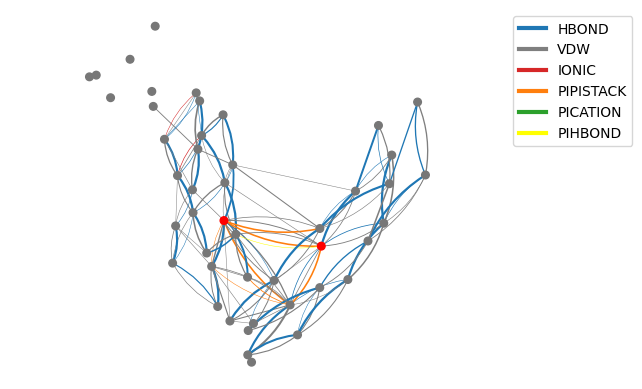

In [19]:
from matplotlib.lines import Line2D
plot_contact_net(rh_2h9r,use_coords='xz', color_nodes=[17,36])

In [8]:
from matplotlib.lines import Line2D
def plot_contact_net(self, use_coords='xz', arced=True, prob_weight = 1.3, min_weight = 0.3, legend=True, color_nodes = None):
    contact_colors = {
        'HBOND': 'tab:blue',
        'VDW': 'tab:gray',
        'IONIC': 'tab:red',
        'PIPISTACK': 'tab:orange',
        'PICATION': 'tab:green',
        'PIHBOND': 'yellow'
    }
    cord_to_idx = {'x': 0, 'y': 1, 'z': 2}
    atom_pos_contig = self.q_atom_pos[:, [cord_to_idx[use_coords[0]], cord_to_idx[use_coords[1]]]]
    nongap_idx = 0
    atom_pos = []
    for msa_col in range(self.msa.get_alignment_length()):
        cur_res = self.msa[0,msa_col]
        if cur_res != '-':
            atom_pos.append(atom_pos_contig[nongap_idx,:])
            #print('nongap', atom_pos[-1].shape)
            nongap_idx += 1
        else:
            atom_pos.append(np.zeros((2)))
            #print('gap', atom_pos[-1].shape)
    #print(len(atom_pos))
    #print(sum([res != '-' for res in str(self.msa[0].seq)]))
    atom_pos = np.array(atom_pos)
    atom_pos = impute_zeros(atom_pos)

    atom_pos_scaled = np.array(atom_pos).astype(float)
    lb = np.min(atom_pos_scaled, axis=0)
    ub = np.max(atom_pos_scaled, axis=0)
    atom_pos_scaled = -1 + ((atom_pos_scaled - lb) / (ub - lb)) * (2)
    pos = {i: atom_pos_scaled[i] for i in range(len(atom_pos_scaled))}

    if self.prob_df is None:
        self.build_contact_prob_df()
    if self.G is None:
        self.build_network()

    node_colors = ['#777777']*self.G.number_of_nodes()#1f78b4
    if color_nodes is not None:
        for n_id in color_nodes:
            node_colors[n_id] = '#FF0000'
    #print(node_colors)
    nx.draw_networkx_nodes(self.G, pos, node_size=20, node_color=node_colors)

    if arced:
        # Drawing arcs for edges with curvature adjustments
        edge_curvature = {}
        for _, row in self.prob_df.iterrows():
            pair = (row['i'], row['j'])
            if pair not in edge_curvature:
                edge_curvature[pair] = 0
            edge_curvature[pair] += 1

        for pair, count in edge_curvature.items():
            if count == 1:
                edge_curvature[pair] = np.array([0])
            else:
                edge_curvature[pair] = np.linspace(-0.15, 0.15, count)

        edge_index = {}
        for _, row in self.prob_df.iterrows():
            u, v = row['i'], row['j']
            ct = row['contact_type']
            color = contact_colors.get(ct, 'black')
            pair = (u, v)
            prob = row['probability']

            if pair not in edge_index:
                edge_index[pair] = 0
            
            rad = edge_curvature[pair][edge_index[pair]]
            edge_index[pair] += 1

            start_pos = np.array(pos[u])
            end_pos = np.array(pos[v])

            patch = patches.FancyArrowPatch(posA=start_pos, posB=end_pos,
                                            connectionstyle=f"arc3,rad={rad}",
                                            arrowstyle='-', color=color, lw= prob_weight*prob + min_weight,
                                            mutation_scale=10.0, zorder=0)
            plt.gca().add_patch(patch)
    else:
        # Drawing straight edges or no edges if prob_df is not provided
        # for (u, v, data) in self.G.edges(data=True):
        #     color = contact_colors.get(data.get('interaction'), 'black')
        for _, r in self.prob_df.iterrows():
            u, v = r['i'], r['j']
            color = contact_colors.get(r['contact_type'])
            prob = r['probability']
            start_pos = np.array(pos[u])
            end_pos = np.array(pos[v])

            plt.plot([start_pos[0], end_pos[0]], [start_pos[1], end_pos[1]], color=color, lw=prob_weight*prob + min_weight)
    if legend:
        legend_lines = [Line2D([0], [0], color=color, lw=3, label=contact_type) for contact_type, color in contact_colors.items()]
        plt.legend(handles=legend_lines, loc='upper left', bbox_to_anchor=(1, 1))
    plt.axis('equal')
    plt.axis('off')
    plt.show()
    

In [117]:
def NodeSummary(self, u, verbose=False):
    node_df = self.contact_df[(self.contact_df['msaCol1'] == u) | (self.contact_df['msaCol2'] == u)]
    col_AA_dict = {}
    for i in range(len(self.msa)):
        res = self.msa[i, u]
        col_AA_dict[res] = col_AA_dict.get(res, 0) + 1
    print(', '.join([f"{one_to_three(res)}: {count}" for (res, count) in col_AA_dict.items()]))
    if verbose:
        for inter_type in self._interaction_types:
            inter_type_df = self.contact_df[self.contact_df['Interaction'] == inter_type]
    return node_df.groupby("Interaction").apply(lambda x: x,include_groups=False)

#NodeSummary(rh, 11)